# Generative modelling in deep learning

*This notebook consists of common introductory questions, followed by 4 different generative models, and a common conclusive question. **Choose & implement 2 among the 4 models**, not all of them! If you train more models, write down below the 2 ones you want to be graded on. Do not forget the last common question.*

Generative modelling in machine learning can aim at achieving different goals.

The first, obvious one is that a generative model can be used to generate more data, to be used afterwards by another algorithm. While a generative model cannot create more information to solve the issue of having too small datasets, it could be used to solve anonymity questions. Typically, sharing a generative model trained on private data could allow the exploitation of the statistical property of this data without sharing the data itself (which can be protected by privacy matters for example).

Another goal is to use generative modelling to better understand the data at hand. This is based on the hypothesis that a model that successfully learned to generate (and generalize) a dataset should have internally learned some efficient and compressed representation of the information contained in the data. In this case, analysing a posteriori the learned representation may give us insights on the data itself.

The notion of a generative model however needs to be more formally specified, in order to work with. What does it mean for the model to generate data that "looks like" the original dataset? A mathematical formulation of that is necessary, in order to define a training objective that can be used efficiently. Having some expert rate the quality of all generated datapoints one by one is definitely not an option.

Thus, modelling our data and models as probability distributions comes to the rescue. If we consider our data as coming from some underlying probability distribution, that we will name $p_D$, our goal is thus to train our model to represent another probability distribution, which we will name $p_\theta$, that should be some good approximation of $p_D$. Given that we only know $p_D$ through some set of realisations from it (the dataset), we can never hope to learn it exactly.

**Q1: Can you name some metrics that can be used to compare two given distributions $p_D$ and $p_\theta$?**

>Total Variation distance: 

>$$TV(p_D, p_\theta) = \frac{1}{2} \int |p_D(x) - p_\theta(x)| \, dx$$
>Kullback-Leibler divergence (or relative entropy): It is a metric which come from information theory (which provide tools to quantify how much information a random variable can provide), and measures how the information provided by $p_D$ will be different from the information provided by $p_\theta$
>$$
D_{\mathrm{KL}}(p_D \| p_\theta)=\int_{-\infty}^{\infty} p_D(x) \log \left(\frac{p_D(x)}{p_\theta(x)}\right) \mathrm{d} x
$$



Most comparison methods can be separated into two kinds: those that compare the density of the distributions ($p_\theta(x)$ vs $p_D(x)$), and those that compare the values sampled from them. These two kinds of approaches have different behavior and trade-offs.

**Q2: Given we want to use them as an optimisation objective, what are the caveats to keep in mind about these two kinds?**

>For density comparaison methods:\
>-We may have to compute the distributions if we don't have access to it.\
>-It may take some time to compute the distributions\
>-We may need to make some hypothesis on the distribution which may lead us to have one computed distribution which is not accurate and different from the original one\
>-Computing the metric between two distributions may be computationally expensive as we have to make sums over the whole space

>For sample comparaison methods:±
>-We need to have a sufficient number of samples to use these methods\
>-We may need to have complex sampling methods to avoid the variance\
>-It may lead to a high computational cost

In this work, we will focus on the most widely used generative models based on deep neural networks: Generative Adversarial Networks (GAN), Variational AutoEncoders (VAE), Normalizing Flows and Diffusion Models, in order to compare them and understand their strengths and weaknesses.

### Dataset

#### Checkerboard (prioritize this dataset)

In [1]:
import torch
import math
from sklearn import datasets
import numpy as np
import matplotlib.pyplot as plt

def generate_batch(num_datapoints: int) -> np.ndarray:
  """Checkerboard dataset."""
  x1 = np.random.rand(num_datapoints) * 4 - 2
  x2 = np.random.rand(num_datapoints) - np.random.randint(0, 2, [num_datapoints]) * 2. + np.floor(x1) % 2
  data = np.stack([x1, x2]).T * 2
  data = (data - data.mean(axis=0)) / data.std(axis=0) # normalize
  return torch.from_numpy(data.astype(np.float32))

train_data = generate_batch(5000)

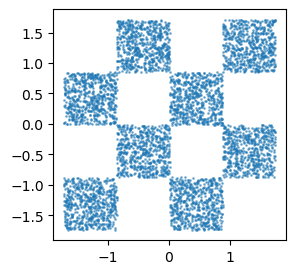

In [2]:
plt.figure(figsize=(3, 3))
plt.scatter(train_data.numpy()[:,0], train_data.numpy()[:,1], s=1.0, alpha=0.5)
plt.show()

It's also good to visualize the density as sometimes generative models overfit particular region of space. Once models are trained, when you sample from them, plot the two densities side-by-side to compare real & synthetic dataset.

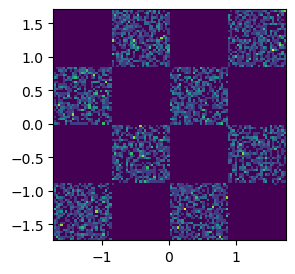

In [3]:
plt.figure(figsize=(3, 3))
plt.hist2d(train_data.numpy()[:,0], train_data.numpy()[:,1], bins=100)
plt.show()

#### Moon (use this one only if your models struggle on checkerboard)

In [42]:
import torch
import math
from sklearn import datasets
import numpy as np

# Our dataset is mathematically defined, we can generate batches on the fly and enjoy
# an infinite-size dataset
def generate_batch(batchlen):
    """This function generates a batch of length 'batchlen' from the dataset
    """
    data = datasets.make_moons(n_samples=batchlen, noise=0.05)[0].astype(np.float32)
    return torch.from_numpy(data)

Let's plot a large batch, to see what the dataset looks like.

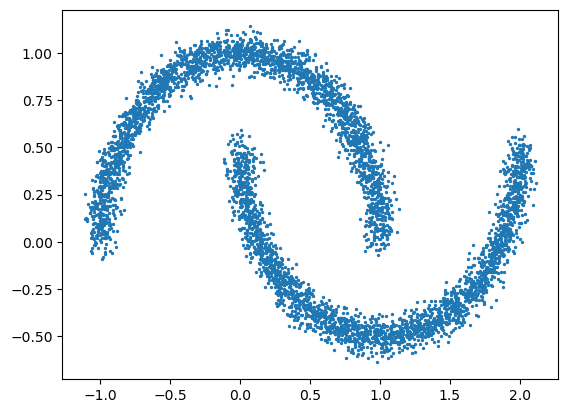

In [191]:
%matplotlib inline
import matplotlib.pyplot as plt

batch = generate_batch(5000)

plt.scatter(batch[:,0], batch[:,1], s=2.0)
plt.show()

It's also good to visualize the density as sometimes generative models overfit particular areas. Once models are trained, when you sample from them, plot the two densities side-by-side to compare real & synthetic dataset.

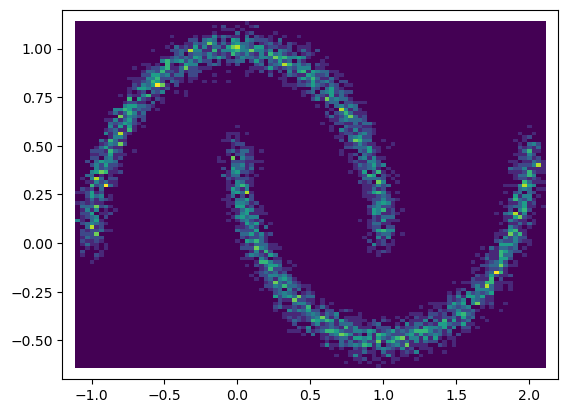

In [430]:
plt.hist2d(batch.numpy()[:,0], batch.numpy()[:,1], bins=100)
plt.xlim([-1.2,2.2])
plt.ylim([-0.7,1.2])
plt.show()

----
### Generative Adversarial Networks

GANs structure is based on modelling the distribution $p_\theta$ as a learned deterministic function applied to a standard noise. Sampling from it is thus done as follows: first, some noise is sampled from a standard N-dimensional Gaussian distribution: $\epsilon \sim \mathcal{N}(0;I)$, and then the output is computed as a deterministic function $x = f_\theta(\epsilon)$. The function $f_\theta$ is implemented as a neural network, $\theta$ representing its learned parameters.

**Q3: What is, a priori, the impact of the choice of N, the dimension of the input noise $\epsilon$?**

> When N is high, the learned distribution $p_\theta$ can learn more information and it may lead to have more accurate generated data. \
But, if $N$ is too high, the training of the neral network may be harder, and need more data and time.\
When N is too low, the learned distribution $p_\theta$ may loose too much information.\
We have to choose an accurate $N$ to prevent this.

By construction, this generator structure only allows sampling the distribution $p_\theta$, and does not allow the computation of the density $p_\theta(x)$ (at least not without strong assumptions on $f_\theta$). Such a model thus needs a comparison method based on samples to be trained.

The smart idea of GANs is to instead use another neural network to model the objective. Another neural network is introduced: a classifier (that we call the discriminator) which is trained to distinguish examples from the dataset from examples generated by $p_\theta$. The reasoning is as follows:

The discriminator $D$ is trained using a classic classifier loss between the two classes defined as the samples generated by either $p_D$ or $p_\theta$. This way $D(x)$ can be interpreted as the probability that $x$ came from the real dataset:

$$ \mathcal{L}_D = \mathbb{E}_{p_D} \left[ -\log D(x) \right] + \mathbb{E}_{p_\theta} \left[ -\log \left(1-D(x)\right) \right] $$

From that, it can be shown that for the generator fixed, the optimal discriminator is given by $D(x) = \frac{p_D(x)}{p_\theta(x) + p_D(x)}$, and when reached its loss takes a specific value:

$$ \mathcal{L}_D = 2 \left( \log 2 - JSD(p_\theta \| p_D) \right) $$
, where JSD is the JS divergence used to measure the similarity of two distributions. 
$$JSD(p_\theta \| p_D) = \frac{1}{2} \mathbb{E}_{p_D} \left[ log(\frac{2p_D}{p_D+p_\theta}) \right] + \frac{1}{2} \mathbb{E}_{p_\theta} \left[ log(\frac{2p_\theta}{p_D+p_\theta}) \right]$$
So, training the generator network to *maximize* the same loss would, assuming the discriminator is always trained to optimality, minimize the Jensen-Shannon Divergence between $p_\theta$ and $p_D$, and thus bring $p_\theta$ closer to $p_D$.

**Q4: Can you anticipate a caveat of using the JSD as a training objective for the generator?**

> If the discriminator learns to differentiate true from generated samples with high performance and high confidence, which implies that D(x) will be close to 0 or 1, and the loss will be close to 0, and the gradients will be very low and won't provide enough information for the generator to train.

Having the generator trained to maximize $\mathcal{L}_D$ is equivalent to setting its training loss to $ \mathcal{L}_G = \mathbb{E}_{p_\theta} \log(1-D(x)) $.

**Q5: This loss only gives feedback to the generator on samples it generated, what problem may this cause?**

> This loss can make the generator focus on the same outputs. Indeed, it won't be penalized if it returns similar output, so it can leads the generator to give the same outputs can fool the discriminator (and result in a low loss).


We will now work on implementing a GAN on a simple toy problem, to get a feeling of its behavior and test our theoretical insights. For this we will use the `pytorch` library.

While a real problem would be generating images for example (each datapoint $x$ would then be a different image), this is a kind of task that easily requires intensive CPU/GPU power, and image datasets are difficult to visualize from a geometric point of view (even small images contains hundreds of pixels, and nobody can visualize points in a 100-dimensional space). So instead we will focus on points in the plane: each datapoint $x$ will actually be a couple of numbers $(x1, x2)$, and our target dataset will be a 2D two-moons shape with some noise.

We now need to define our two neural networks, the generator and the discriminator. The generator will take as input a value $z$ sampled from a Gaussian prior, and output a value $x$ (thus a couple $(x_1,x_2)$). The discriminator takes as input a value $x$, and is a binary classifier.

In [43]:
import torch.nn as nn
import torch.nn.functional as F

# Choose a value for the prior dimension
PRIOR_N = 2

# Define the generator
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(PRIOR_N, 2)
        
    def __call__(self, z):
        return self.fc1(z)
    
    def generate(self, batchlen):
        z = torch.normal(torch.zeros(batchlen, PRIOR_N), 1.0)
        return self.__call__(z)
    

# Define the discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(2, 1)
    
    def __call__(self, x):
        return self.fc1(x)

With these classes in shape, now is only needed the training loop. To stick with the mathematical GAN framework, we should train the discriminator until convergence between each training step of the generator. This is not practical for two reasons: first it takes a lot of time, and second if the discriminator is too good, it will generate vanishing gradients to the generator (as seen in **Q4**).

We will thus train the discriminator a fixed number of times between each training iteration of the generator.

step 0: discriminator: 1.553e+00, generator: 5.077e-01


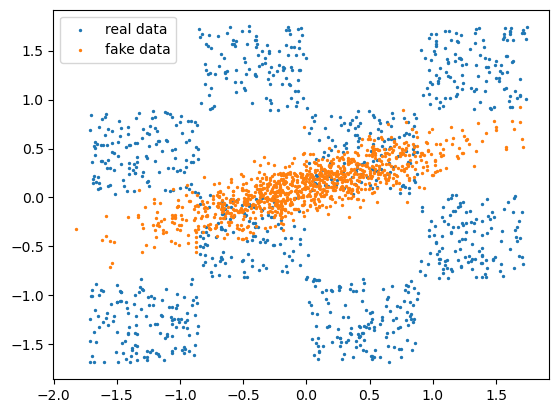

step 1000: discriminator: 1.398e+00, generator: 6.924e-01


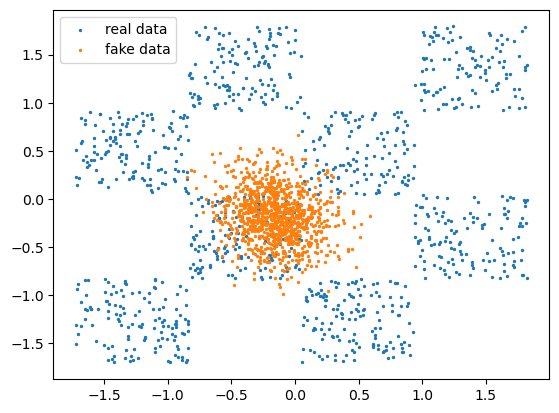

step 2000: discriminator: 1.391e+00, generator: 6.914e-01


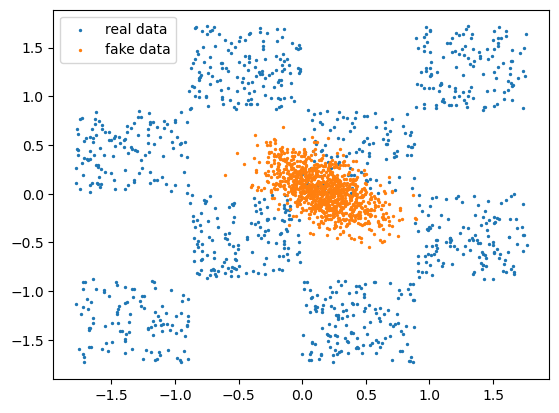

step 3000: discriminator: 1.385e+00, generator: 7.000e-01


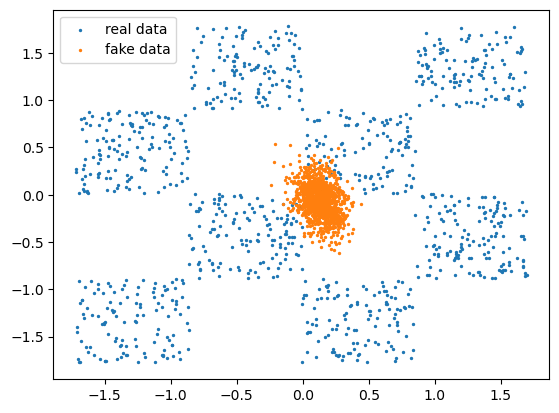

step 4000: discriminator: 1.397e+00, generator: 6.910e-01


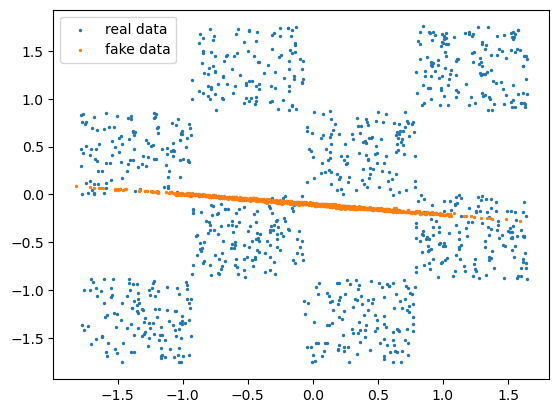

step 5000: discriminator: 1.381e+00, generator: 6.998e-01


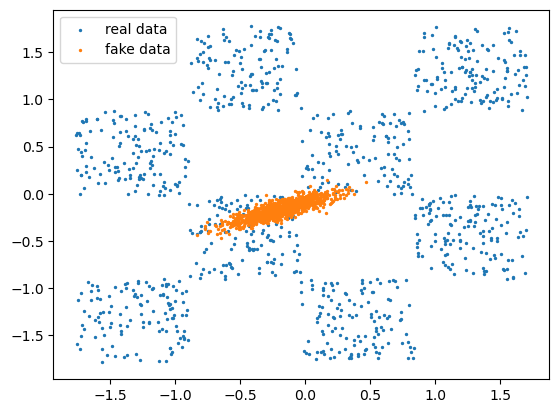

step 6000: discriminator: 1.406e+00, generator: 6.932e-01


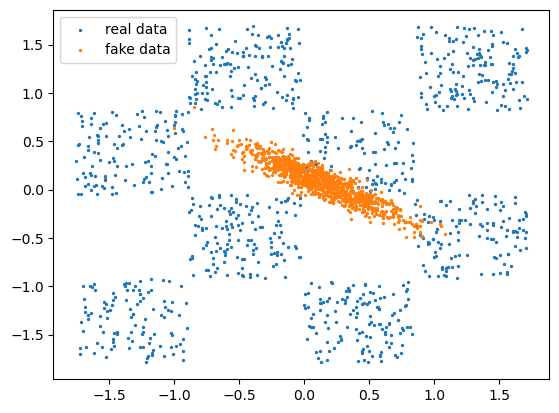

step 7000: discriminator: 1.390e+00, generator: 7.001e-01


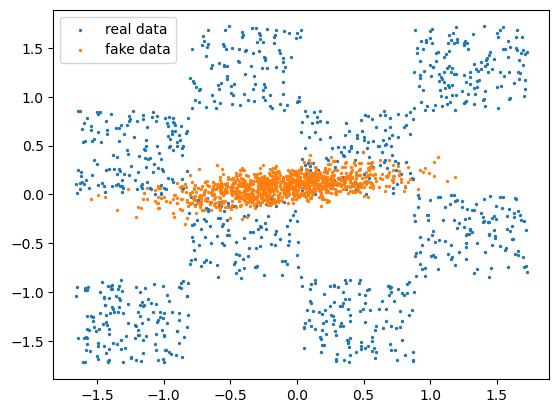

step 8000: discriminator: 1.392e+00, generator: 7.046e-01


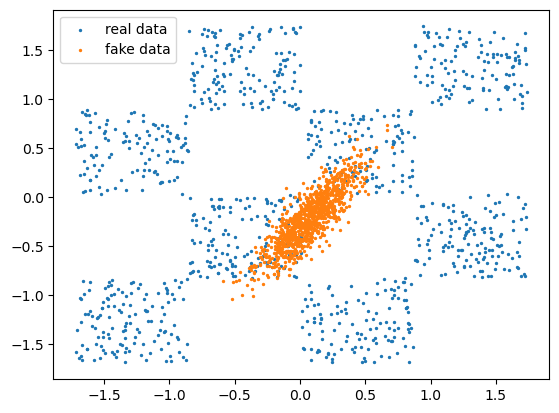

step 9000: discriminator: 1.382e+00, generator: 6.828e-01


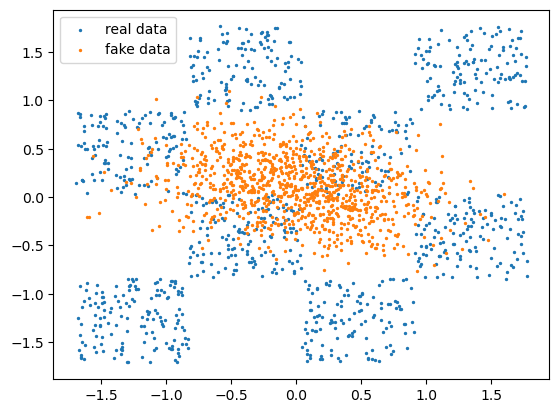

step 10000: discriminator: 1.378e+00, generator: 7.078e-01


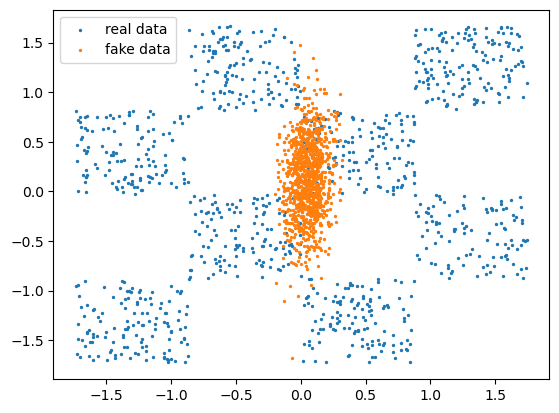

step 11000: discriminator: 1.395e+00, generator: 6.973e-01


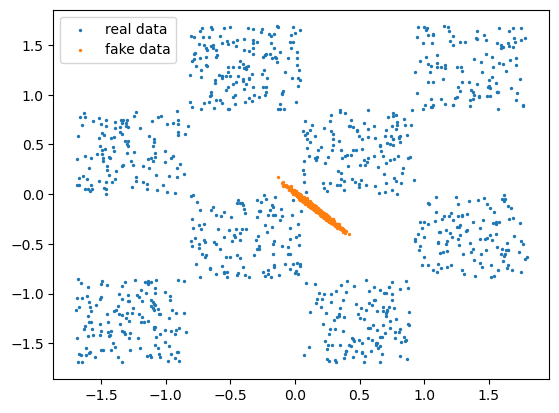

step 12000: discriminator: 1.393e+00, generator: 6.882e-01


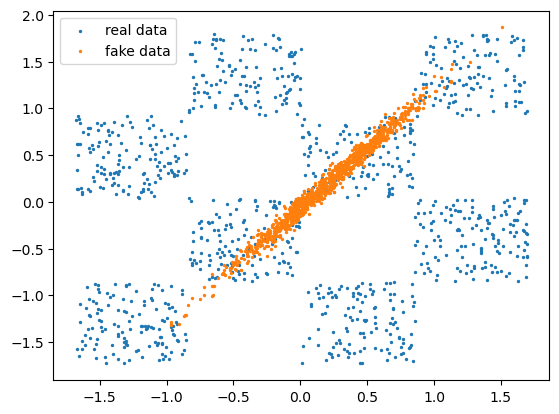

step 13000: discriminator: 1.381e+00, generator: 6.985e-01


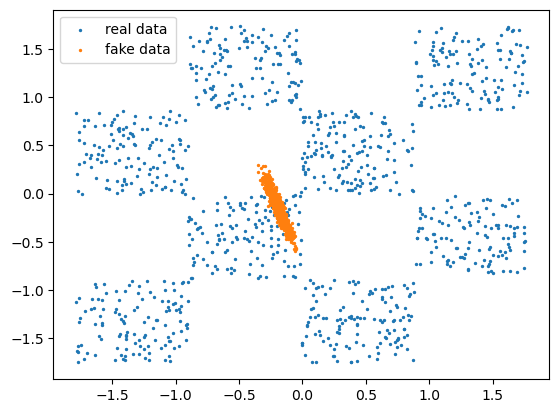

step 14000: discriminator: 1.399e+00, generator: 6.892e-01


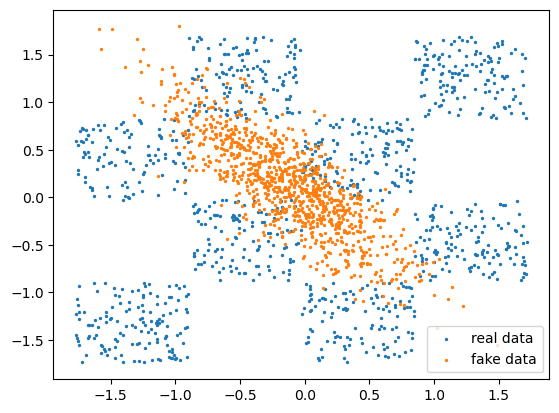

step 15000: discriminator: 1.397e+00, generator: 6.957e-01


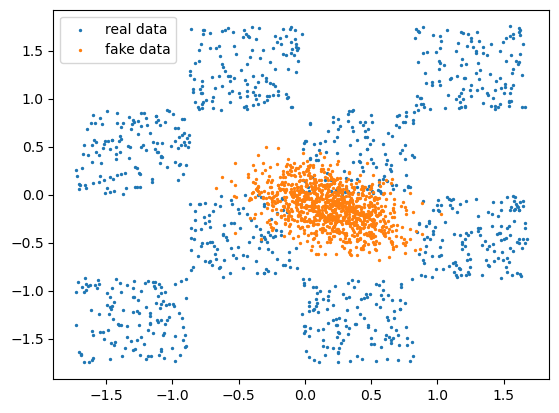

step 16000: discriminator: 1.391e+00, generator: 6.970e-01


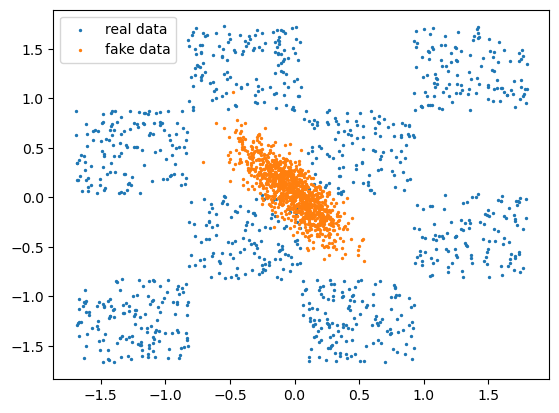

step 17000: discriminator: 1.399e+00, generator: 6.957e-01


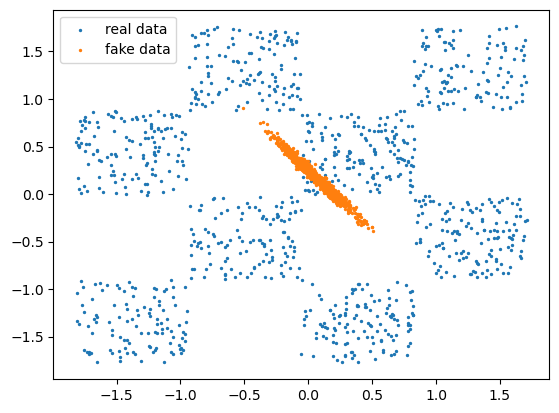

step 18000: discriminator: 1.367e+00, generator: 7.064e-01


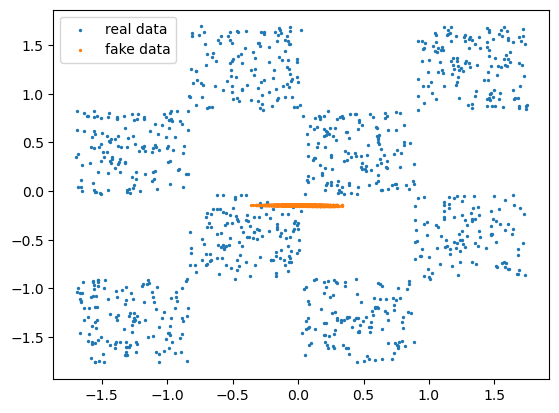

step 19000: discriminator: 1.391e+00, generator: 7.091e-01


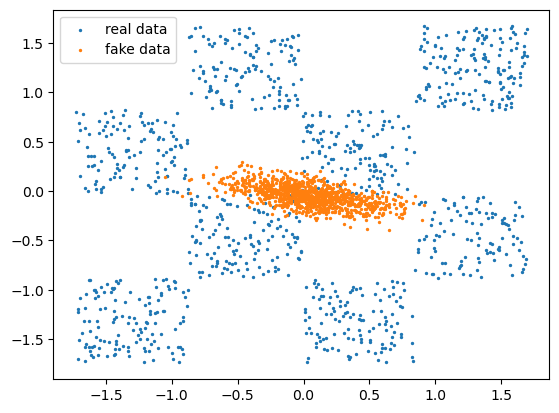

step 20000: discriminator: 1.393e+00, generator: 6.952e-01


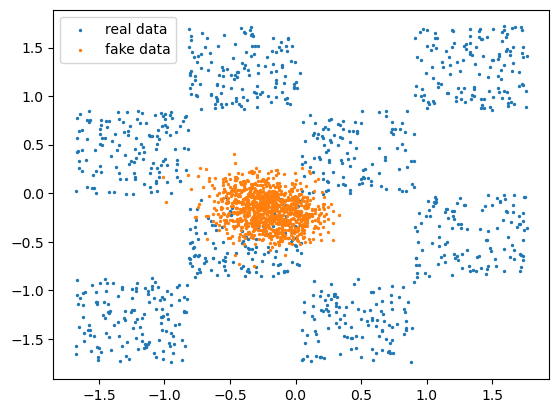

step 21000: discriminator: 1.387e+00, generator: 7.023e-01


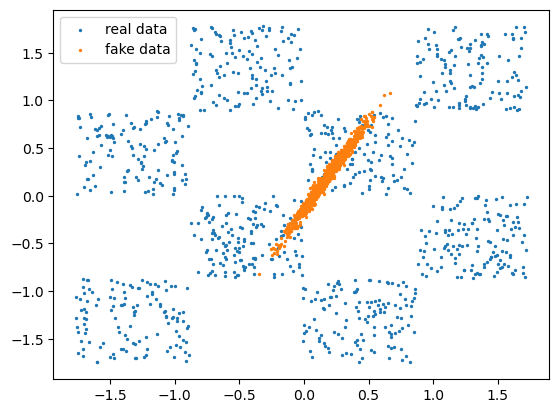

step 22000: discriminator: 1.382e+00, generator: 7.032e-01


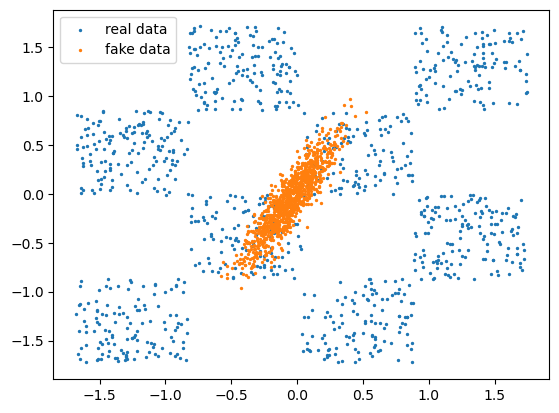

step 23000: discriminator: 1.404e+00, generator: 6.846e-01


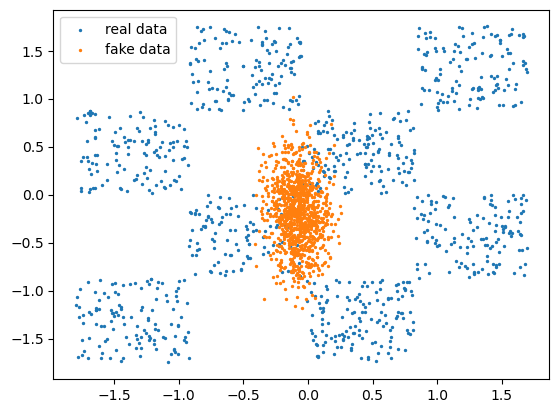

step 24000: discriminator: 1.378e+00, generator: 6.995e-01


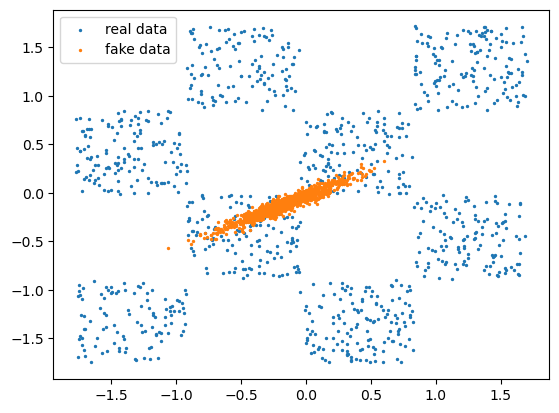

step 25000: discriminator: 1.389e+00, generator: 7.055e-01


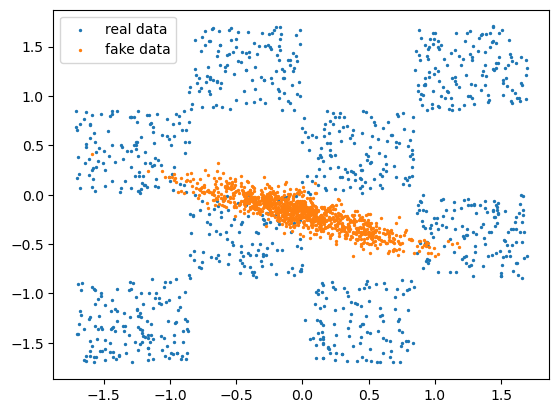

step 26000: discriminator: 1.404e+00, generator: 6.948e-01


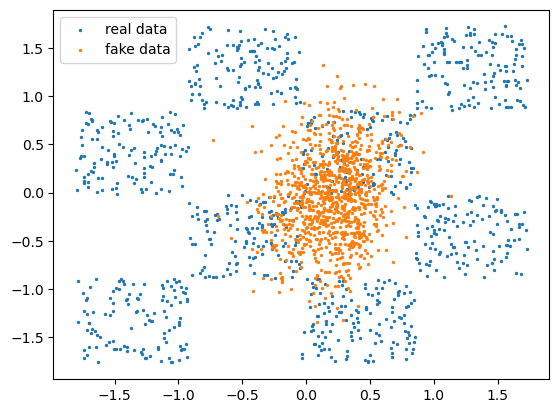

step 27000: discriminator: 1.398e+00, generator: 6.991e-01


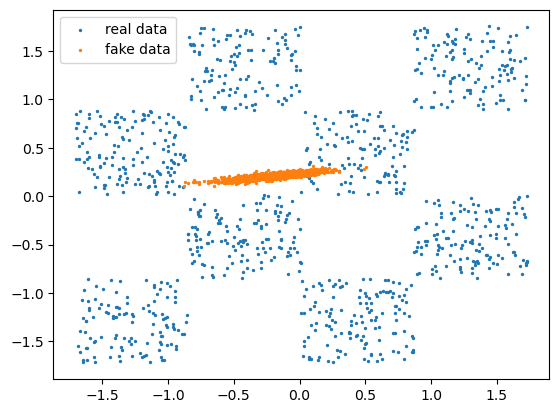

step 28000: discriminator: 1.394e+00, generator: 7.070e-01


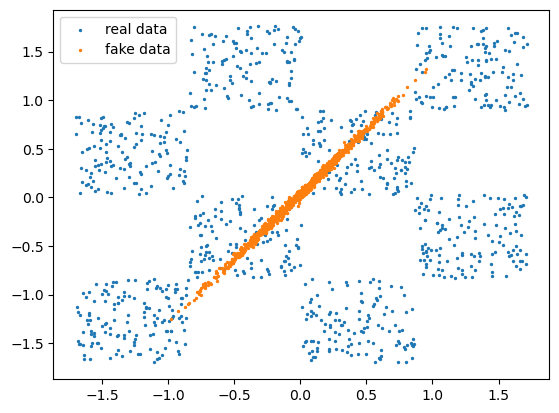

step 29000: discriminator: 1.380e+00, generator: 6.871e-01


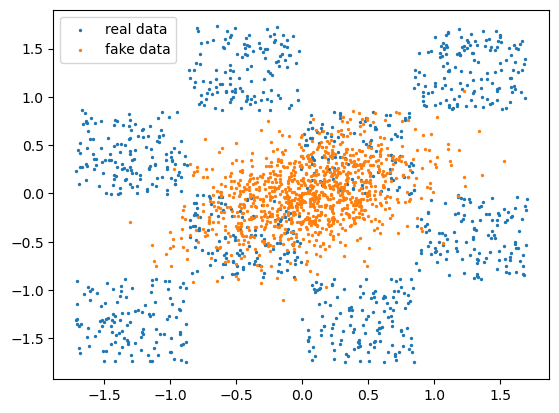

step 30000: discriminator: 1.394e+00, generator: 7.025e-01


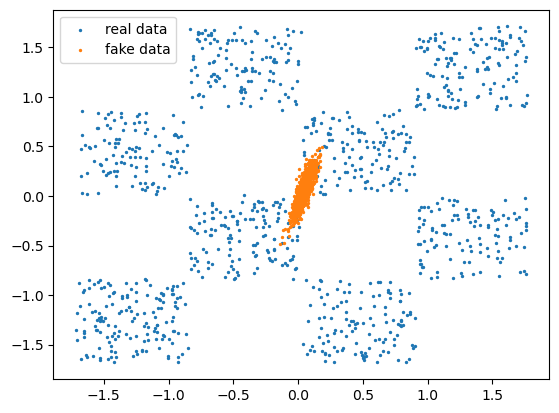

step 31000: discriminator: 1.388e+00, generator: 6.926e-01


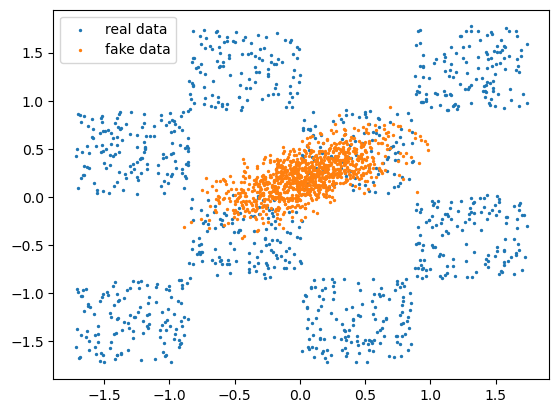

step 32000: discriminator: 1.378e+00, generator: 7.083e-01


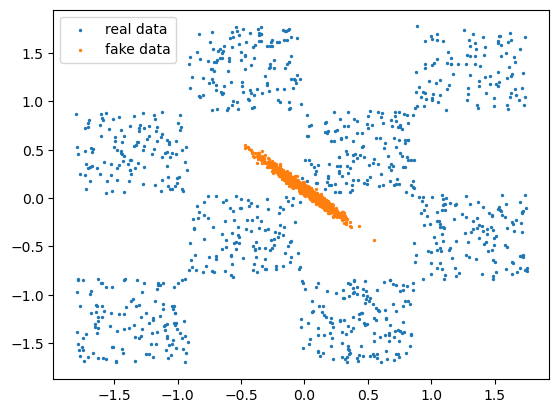

step 33000: discriminator: 1.377e+00, generator: 7.103e-01


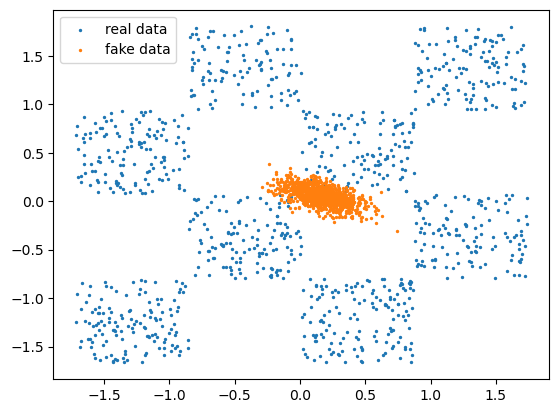

step 34000: discriminator: 1.380e+00, generator: 7.102e-01


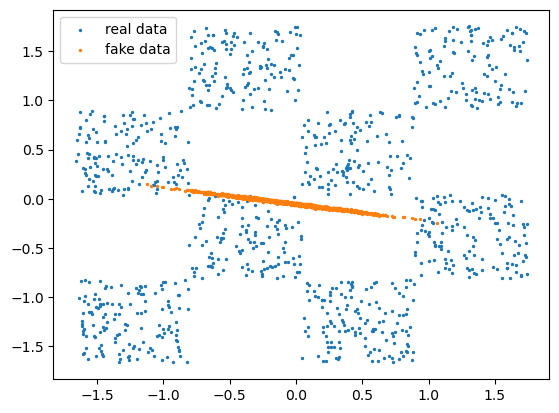

step 35000: discriminator: 1.400e+00, generator: 6.901e-01


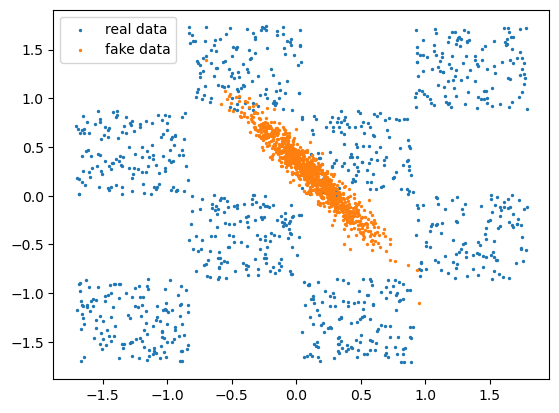

step 36000: discriminator: 1.404e+00, generator: 6.987e-01


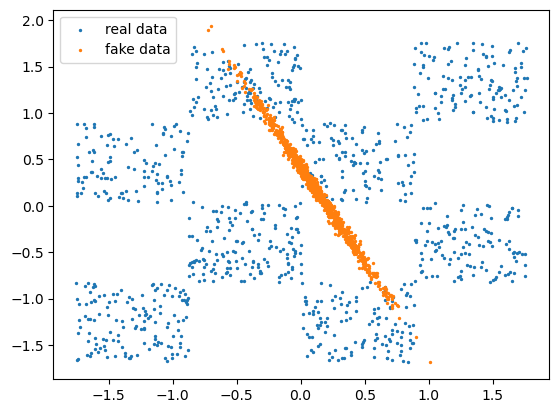

step 37000: discriminator: 1.402e+00, generator: 6.882e-01


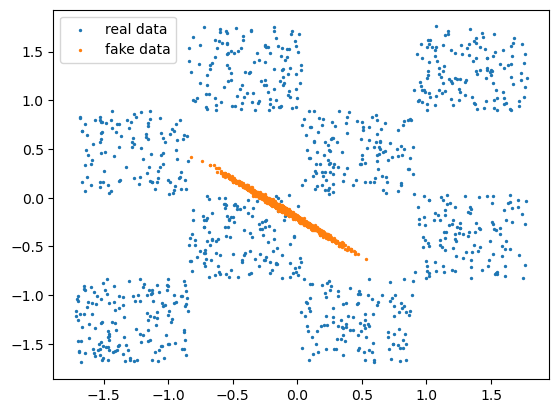

step 38000: discriminator: 1.383e+00, generator: 7.018e-01


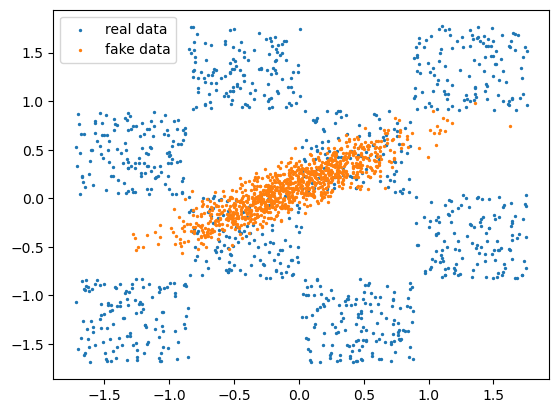

step 39000: discriminator: 1.377e+00, generator: 7.147e-01


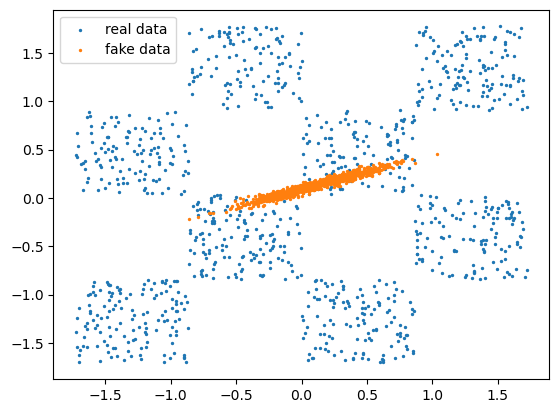

step 40000: discriminator: 1.399e+00, generator: 6.991e-01


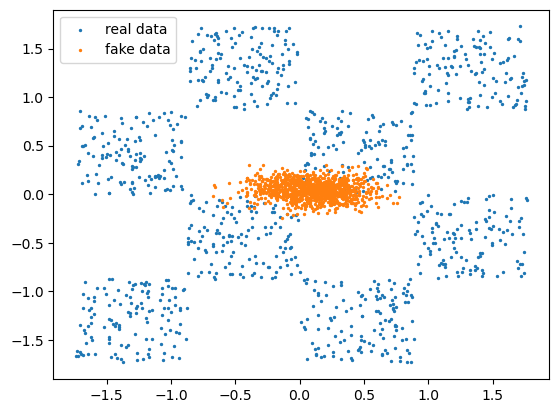

In [6]:
# Number of times to train the discriminator between two generator steps
TRAIN_RATIO = 1
# Total number of training iterations for the generator
N_ITER = 40001
# Batch size to use
BATCHLEN = 128
criterion = nn.BCEWithLogitsLoss()

generator = Generator()
optim_gen = torch.optim.Adam(generator.parameters(), lr=0.05, betas=(0.5,0.9))
discriminator = Discriminator()
optim_disc = torch.optim.Adam(discriminator.parameters(), lr=0.05, betas=(0.5,0.9))

for i in range(N_ITER):
    # train the discriminator
    for _ in range(TRAIN_RATIO):
        discriminator.zero_grad()
        real_batch = generate_batch(BATCHLEN)
        fake_batch = generator.generate(BATCHLEN)
        #
        # == COMPUTE THE DISCRIMINATOR LOSS HERE ==
        #
        real_output, fake_output = discriminator(real_batch), discriminator(fake_batch)
        disc_loss = criterion(real_output, torch.ones(BATCHLEN, 1)) + criterion(fake_output, torch.zeros(BATCHLEN, 1))
        # We want probabilities at the output of the neural network, so to have output in [0,1]
        # We can use sigmoid function on the outputs which leads use to use the softplus function of PyTorch
        # It is used in StyleGAN2 code as well https://github.com/NVlabs/stylegan2/blob/master/training/loss.py        disc_loss.backward()
        disc_loss = F.softplus(-real_output).mean() + F.softplus(fake_output).mean()
        disc_loss.backward()
        optim_disc.step()
        
    # train the generator
    generator.zero_grad()
    fake_batch = generator.generate(BATCHLEN)
    #
    # == COMPUTE THE GENERATOR LOSS HERE
    #
    fake_output = discriminator(fake_batch)
    # We use the alternative loss given after Q6
    gen_loss = F.softplus(-fake_output).mean()
    gen_loss.backward()
    optim_gen.step()
    if i%1000 == 0:
        print('step {}: discriminator: {:.3e}, generator: {:.3e}'.format(i, float(disc_loss), float(gen_loss)))
        # plot the result
        real_batch = generate_batch(1024)
        fake_batch = generator.generate(1024).detach()
        plt.scatter(real_batch[:,0], real_batch[:,1], s=2.0, label='real data')
        plt.scatter(fake_batch[:,0], fake_batch[:,1], s=2.0, label='fake data')
        plt.legend()
        plt.show()

We can observe that the fake data in late steps is matching true data but only focus on some parts of the distribution (central part mostly). The generator is still learning and at some steps during training, it learns 


Complete the previous code and train your model.

Depending on your choice of parameters, the training may not go well at all, with the generator completely collapsing quickly at the beginning of the training. It has been observed by the litterature that the generator's loss $\mathcal{L}_G = \mathbb{E}_{p_\theta} \log(1-D(x))$ is often to blame.

**Q6: Why could we anticipate that this loss could cause this?**

> When the discriminator is trained very well, the generator loss goes to 0 and may lead to have low gradients and the generator won't be able to train well.
> When the discriminator has bad performance (and is not enhancing well during training), the generator loss goes to very low values (and tends to $-\infty$) and may lead to have exploding gradients and the generator won't be able to train well.

This issue is solved by replacing the generator loss by an alternative loss: $\mathcal{L}_G = \mathbb{E}_{p_\theta} [ -\log D(x) ]$ to avoid gradient vanishing.

**Q7: Inspect the impact of these different factors:**

- depth / width of the generator network
- depth / width of the discriminator network
- impact of `TRAIN_RATIO`

In [7]:
# We redefine the generator and the discriminator

import torch.nn as nn
import torch.nn.functional as F

# Choose a value for the prior dimension
PRIOR_N = 2

# Define the generator
class Generator(nn.Module):
    def __init__(self, width, depth, PRIOR_N):
        super().__init__()
        self.fc_in = nn.Linear(PRIOR_N, width)
        self.fc_list = nn.ModuleList([nn.Linear(width, width) for _ in range(depth - 1)])
        self.fc_out = nn.Linear(width, 2)
    def __call__(self, x):
        x = F.relu(self.fc_in(x))
        for layer in self.fc_list:
            x = F.relu(layer(x))
        return self.fc_out(x)
    
    def generate(self, batchlen):
        x = torch.normal(torch.zeros(batchlen, PRIOR_N), 1.0)
        return self.__call__(x)
    

# Define the discriminator
class Discriminator(nn.Module):
    def __init__(self, width, depth):
        super().__init__()
        self.fc_in = nn.Linear(2, width)
        self.fc_list = nn.ModuleList([nn.Linear(width, width) for _ in range(depth - 1)])
        self.fc_out = nn.Linear(width, 1)
    
    def __call__(self, x):
        x = F.relu(self.fc_in(x))
        for layer in self.fc_list:
            x = F.relu(layer(x))
        return self.fc_out(x)
    

In [16]:
def training(TRAIN_RATIO, generator_width, generator_depth, discriminator_width, discriminator_depth):
    # Number of times to train the discriminator between two generator steps
    # TRAIN_RATIO = 1
    # Total number of training iterations for the generator
    N_ITER = 20001
    # Batch size to use
    BATCHLEN = 128
    criterion = nn.BCEWithLogitsLoss()


    generator = Generator(generator_width, generator_depth, PRIOR_N)
    optim_gen = torch.optim.Adam(generator.parameters(), lr=0.001, betas=(0.5,0.9))
    discriminator = Discriminator(discriminator_width, discriminator_depth)
    optim_disc = torch.optim.Adam(discriminator.parameters(), lr=0.001, betas=(0.5,0.9))

    for i in range(N_ITER):
        # train the discriminator
        for _ in range(TRAIN_RATIO):
            discriminator.zero_grad()
            real_batch = generate_batch(BATCHLEN)
            fake_batch = generator.generate(BATCHLEN)
            #
            # == COMPUTE THE DISCRIMINATOR LOSS HERE ==
            #
            real_output, fake_output = discriminator(real_batch), discriminator(fake_batch)
            # We want probabilities at the output of the neural network, so to have output in [0,1]
            # We can use sigmoid function on the outputs which leads use to use the softplus function of PyTorch
            # It is used in StyleGAN2 code as well https://github.com/NVlabs/stylegan2/blob/master/training/loss.py
            disc_loss = F.softplus(-real_output).mean() + F.softplus(fake_output).mean()
            disc_loss.backward()
            optim_disc.step()
        # train the generator
        generator.zero_grad()
        fake_batch = generator.generate(BATCHLEN)
        #
        # == COMPUTE THE GENERATOR LOSS HERE
        #
        fake_output = discriminator(fake_batch)
        gen_loss = F.softplus(-fake_output).mean()
        gen_loss.backward()
        optim_gen.step()
        if i%10000 == 0:
            print('TRAIN_RATIO {}: discriminator depth: {}, discriminator width: {}, generator_depth: {}, generator_width: {}'.format(TRAIN_RATIO, discriminator_depth, discriminator_width, generator_depth, generator_width))
            print('step {}: discriminator: {:.3e}, generator: {:.3e}'.format(i, float(disc_loss), float(gen_loss)))
            # plot the result
            real_batch = generate_batch(1024)
            fake_batch = generator.generate(1024).detach()
            plt.scatter(real_batch[:,0], real_batch[:,1], s=2.0, label='real data')
            plt.scatter(fake_batch[:,0], fake_batch[:,1], s=2.0, label='fake data')
            plt.legend()
            plt.show()

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 1, generator_width: 10
step 0: discriminator: 1.387e+00, generator: 7.325e-01


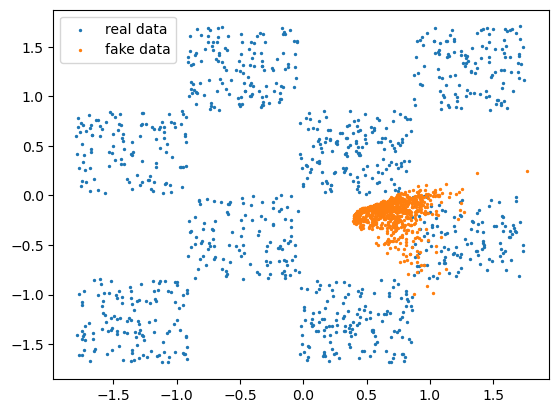

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 1, generator_width: 10
step 10000: discriminator: 8.144e-01, generator: 1.401e+00


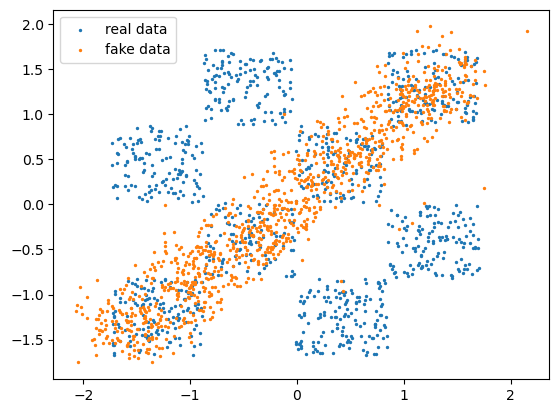

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 1, generator_width: 10
step 20000: discriminator: 9.378e-01, generator: 1.217e+00


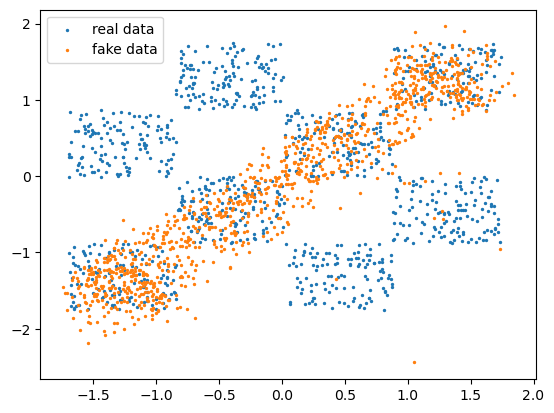

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 1, generator_width: 10
step 30000: discriminator: 1.022e+00, generator: 1.120e+00


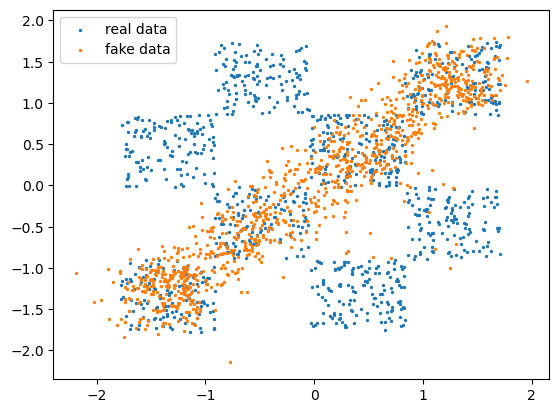

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 1, generator_width: 10
step 40000: discriminator: 1.001e+00, generator: 1.094e+00


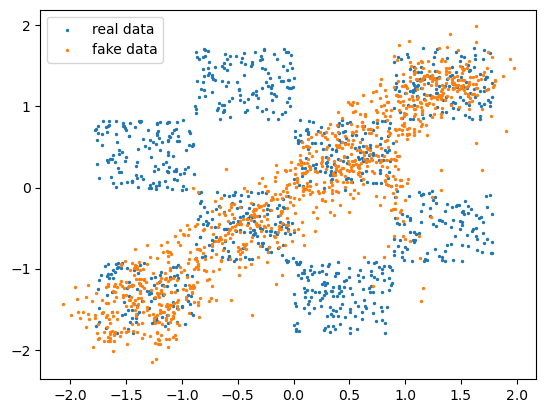

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 10
step 0: discriminator: 1.387e+00, generator: 6.784e-01


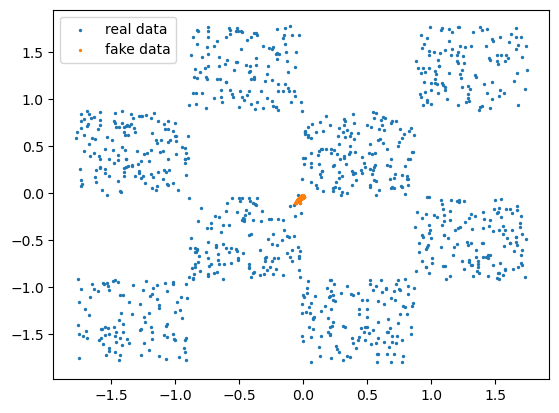

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 10
step 10000: discriminator: 1.303e+00, generator: 9.407e-01


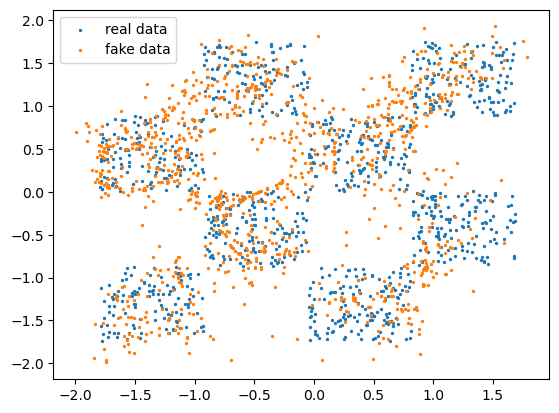

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 10
step 20000: discriminator: 1.344e+00, generator: 9.209e-01


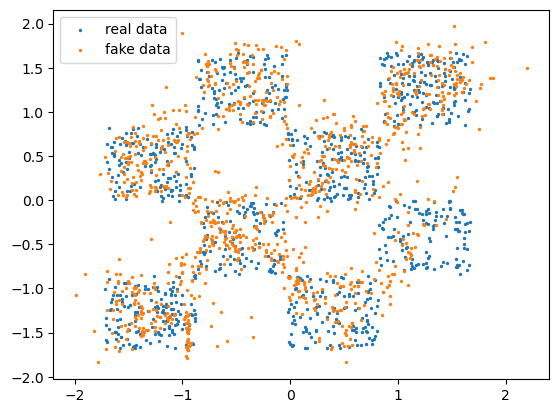

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 10
step 30000: discriminator: 1.363e+00, generator: 7.453e-01


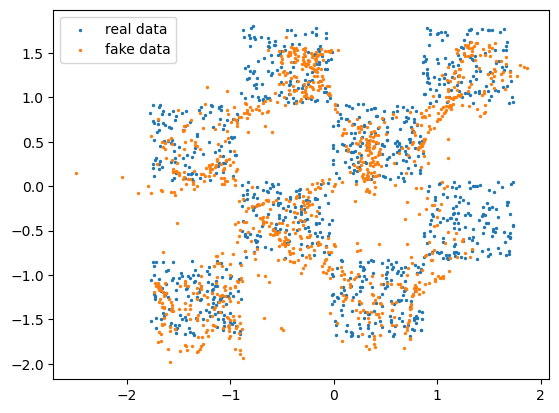

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 10
step 40000: discriminator: 1.305e+00, generator: 7.418e-01


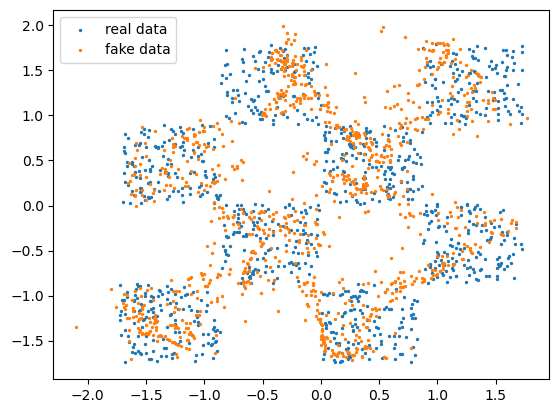

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 10
step 0: discriminator: 1.388e+00, generator: 6.591e-01


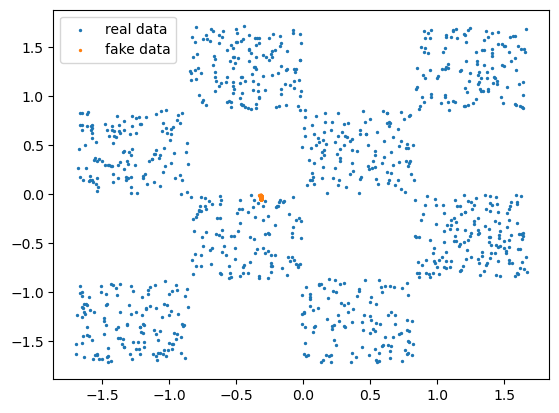

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 10
step 10000: discriminator: 1.304e+00, generator: 8.925e-01


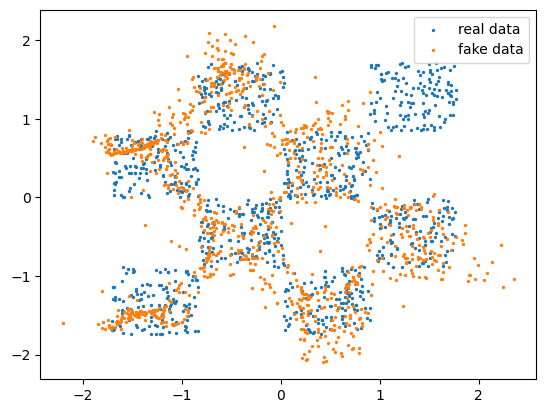

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 10
step 20000: discriminator: 1.336e+00, generator: 7.032e-01


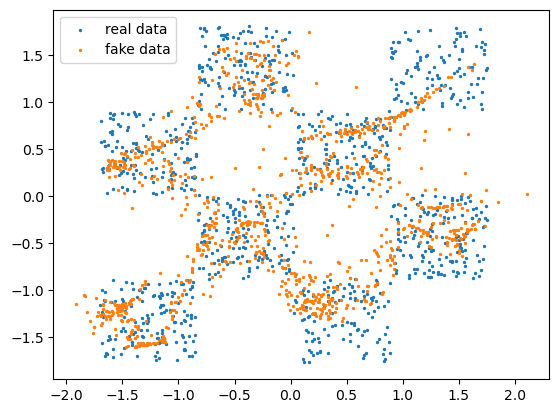

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 10
step 30000: discriminator: 1.391e+00, generator: 6.950e-01


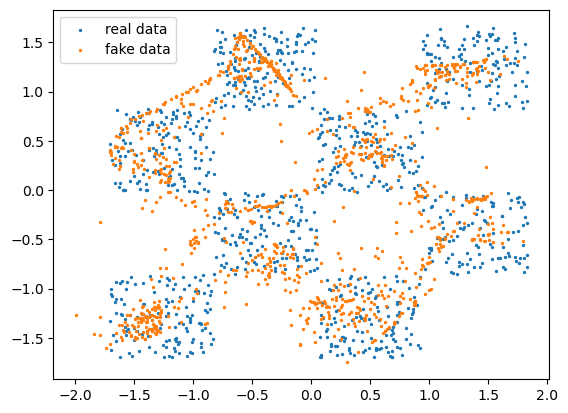

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 10
step 40000: discriminator: 1.386e+00, generator: 6.933e-01


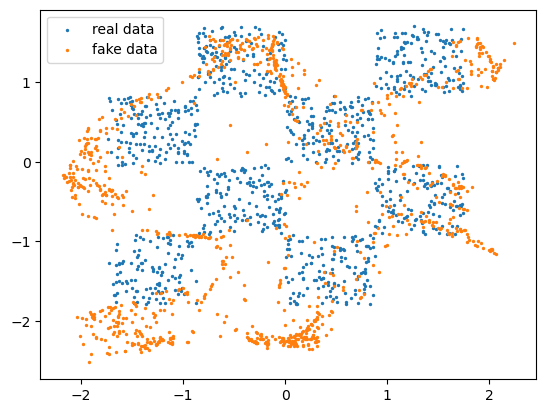

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 128
step 0: discriminator: 1.388e+00, generator: 6.733e-01


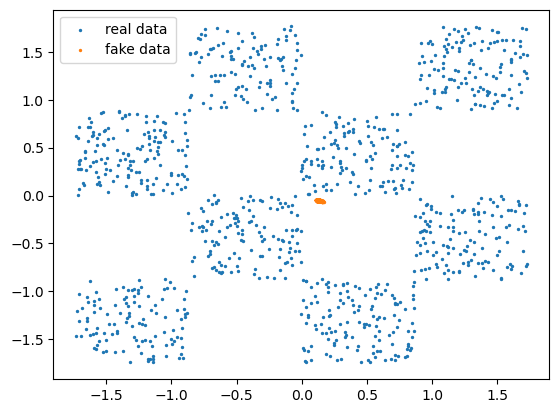

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 128
step 10000: discriminator: 1.386e+00, generator: 6.932e-01


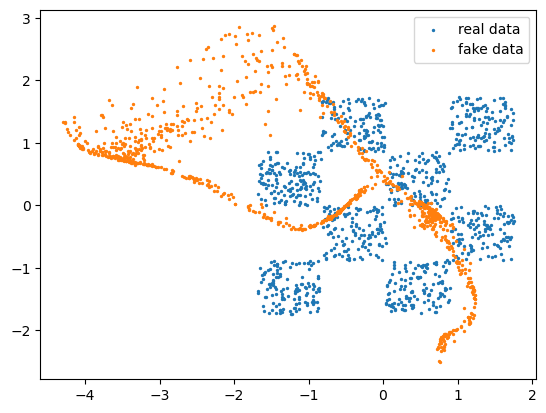

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 128
step 20000: discriminator: 1.386e+00, generator: 6.932e-01


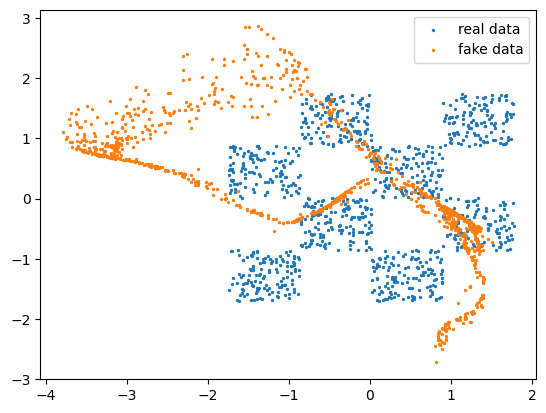

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 128
step 30000: discriminator: 1.386e+00, generator: 6.933e-01


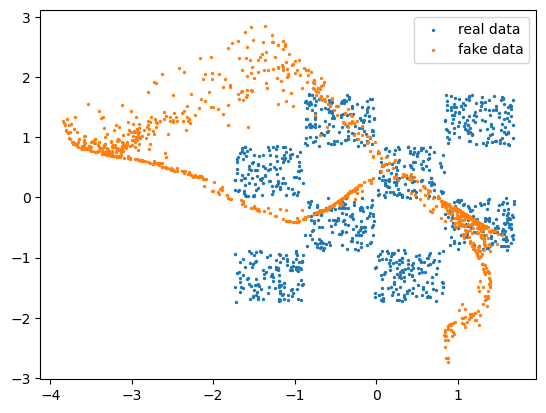

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 128
step 40000: discriminator: 1.386e+00, generator: 6.931e-01


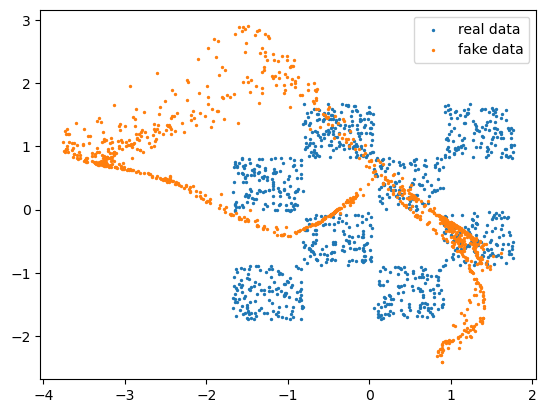

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 128
step 0: discriminator: 1.389e+00, generator: 7.470e-01


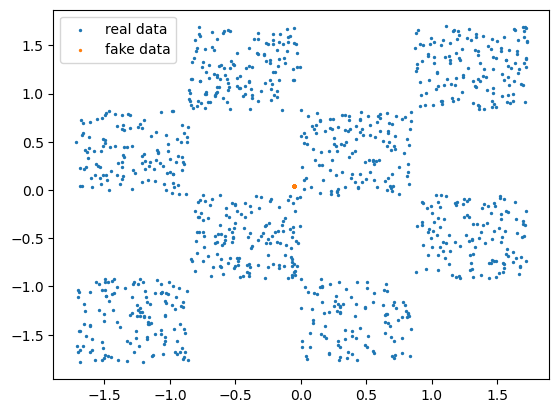

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 128
step 10000: discriminator: 1.386e+00, generator: 6.932e-01


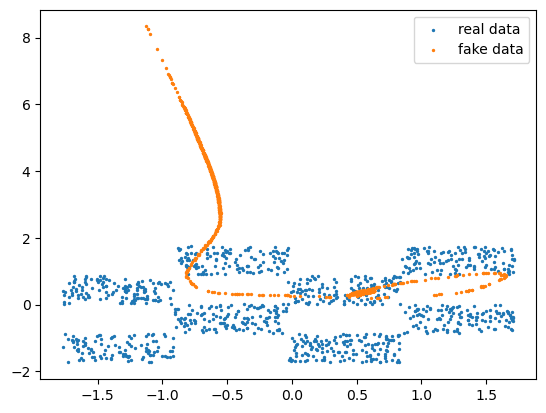

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 128
step 20000: discriminator: 1.386e+00, generator: 6.932e-01


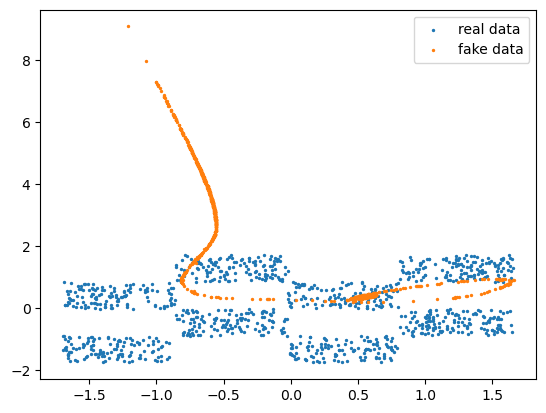

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 128
step 30000: discriminator: 1.386e+00, generator: 6.932e-01


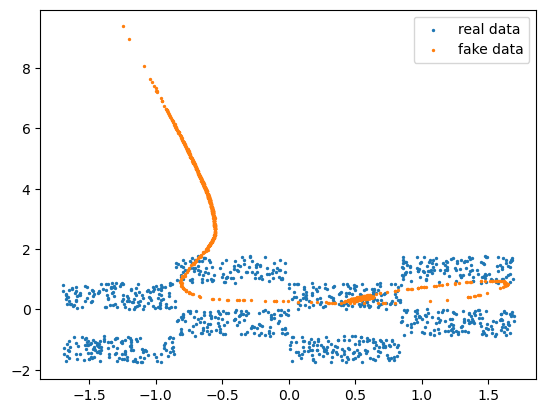

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 128
step 40000: discriminator: 1.386e+00, generator: 6.933e-01


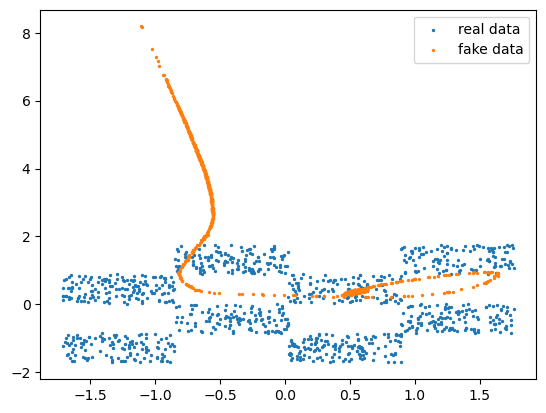

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 256
step 0: discriminator: 1.388e+00, generator: 6.939e-01


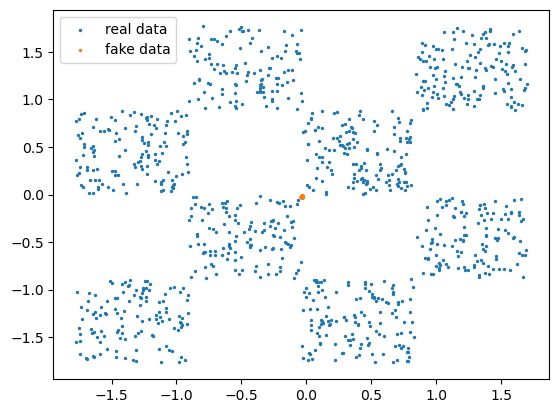

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 256
step 10000: discriminator: 1.386e+00, generator: 6.931e-01


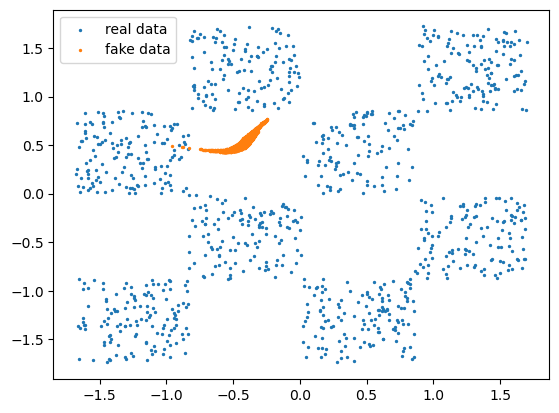

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 256
step 20000: discriminator: 1.386e+00, generator: 6.931e-01


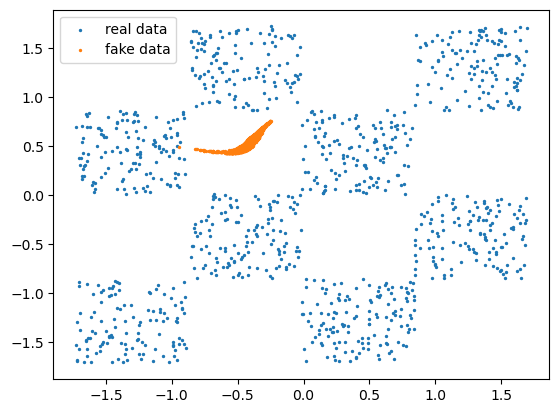

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 256
step 30000: discriminator: 1.386e+00, generator: 6.932e-01


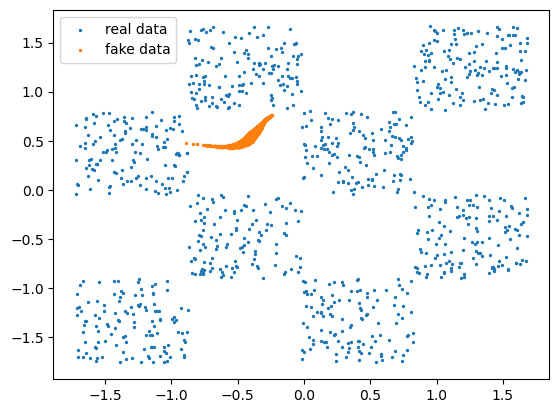

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 8, generator_width: 256
step 40000: discriminator: 1.386e+00, generator: 6.930e-01


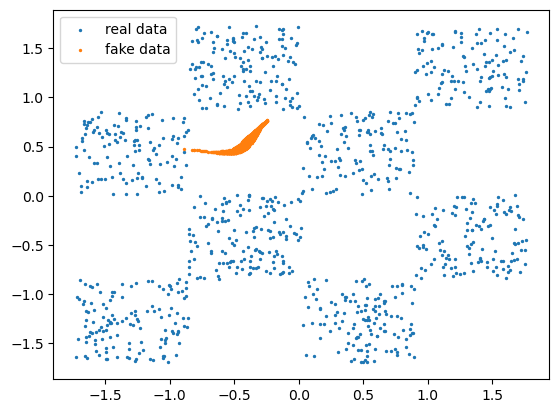

In [13]:
training(TRAIN_RATIO=1, generator_width=10, generator_depth=1, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=10, generator_depth=3, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=10, generator_depth=5, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=128, generator_depth=5, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=128, generator_depth=8, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=256, generator_depth=8, discriminator_width=128, discriminator_depth=5)

We notice that if the generator is simple (depth or width are low), it would only be able to generate data from only some parts of the real data.
When the generator become too large (depth or width are high and are similar or bigger than the discriminant ones), the generator is not training after some steps, and give poor results.

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 16
step 0: discriminator: 1.388e+00, generator: 6.548e-01


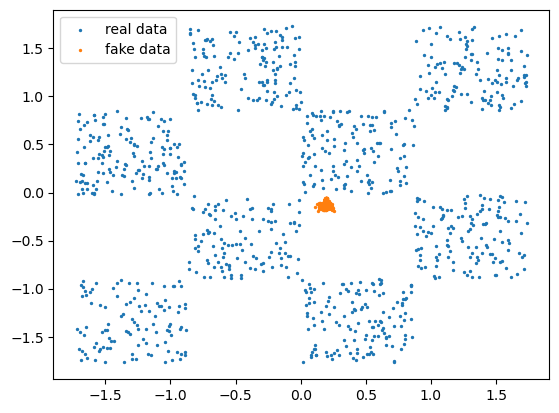

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 16
step 10000: discriminator: 1.144e+00, generator: 8.830e-01


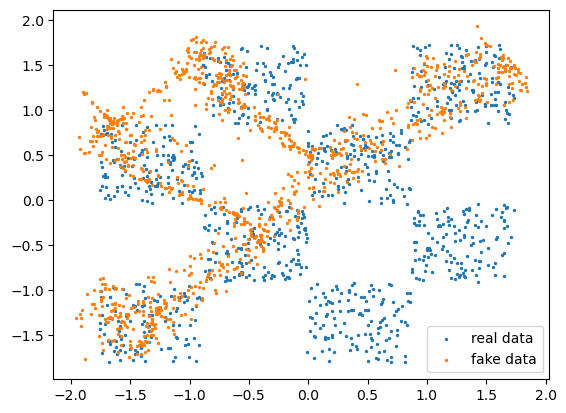

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 16
step 20000: discriminator: 1.326e+00, generator: 7.638e-01


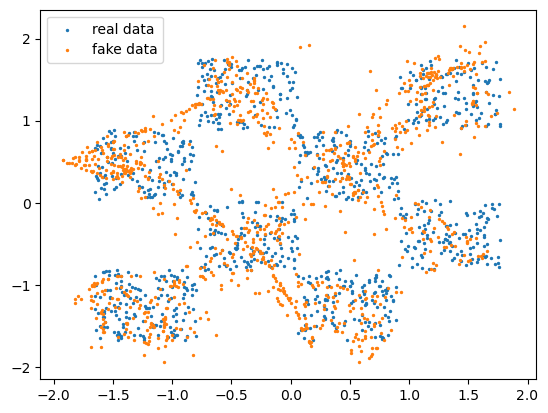

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 16
step 0: discriminator: 1.384e+00, generator: 6.634e-01


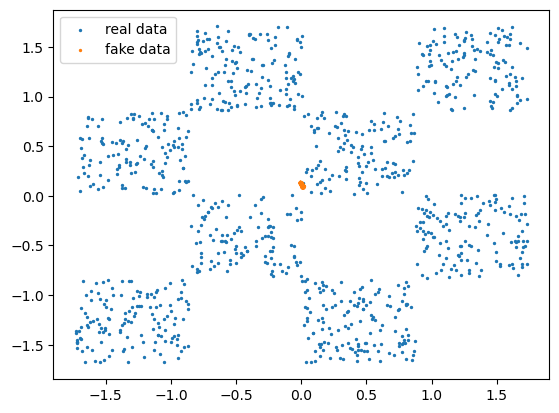

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 16
step 10000: discriminator: 1.386e+00, generator: 6.931e-01


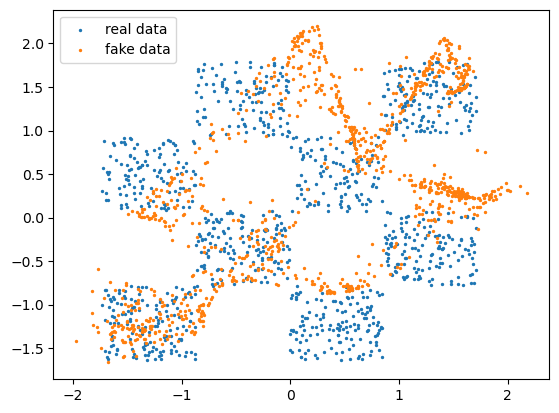

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 16
step 20000: discriminator: 1.386e+00, generator: 6.931e-01


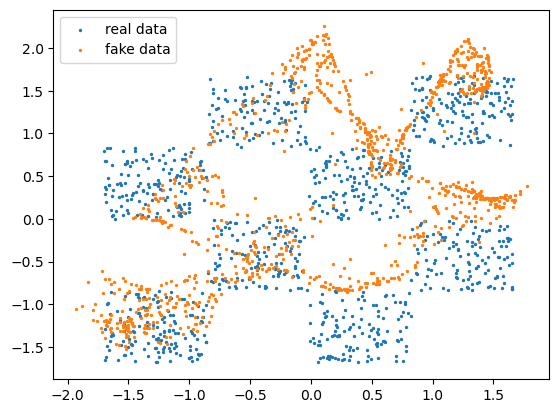

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 64
step 0: discriminator: 1.385e+00, generator: 6.930e-01


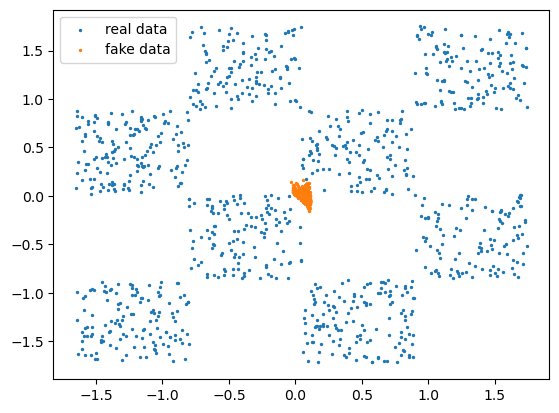

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 64
step 10000: discriminator: 1.386e+00, generator: 6.778e-01


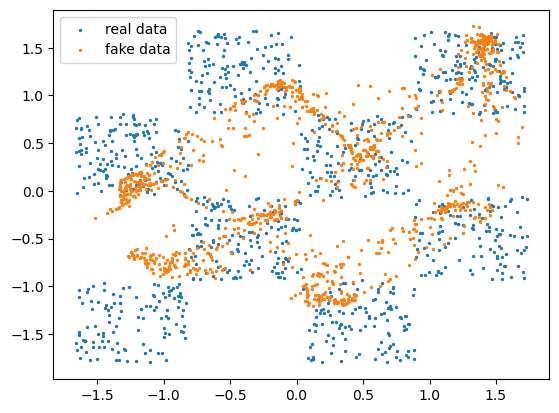

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 64
step 20000: discriminator: 1.386e+00, generator: 6.930e-01


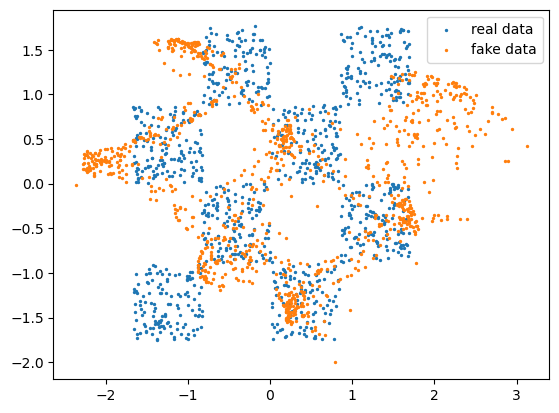

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 64
step 0: discriminator: 1.388e+00, generator: 7.178e-01


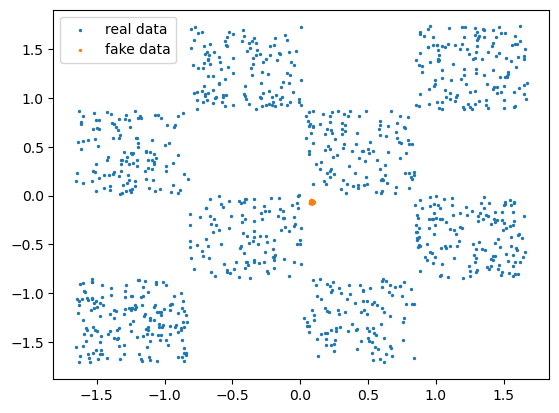

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 64
step 10000: discriminator: 1.382e+00, generator: 6.737e-01


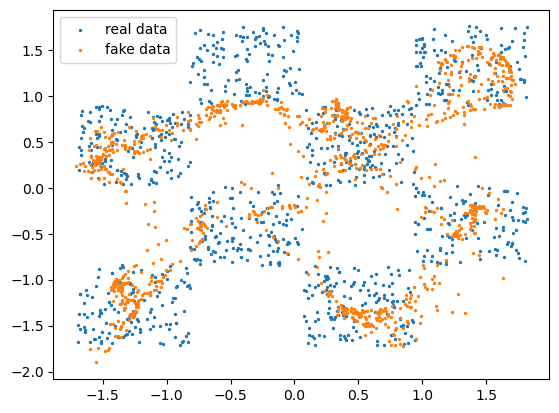

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 64
step 20000: discriminator: 1.386e+00, generator: 6.932e-01


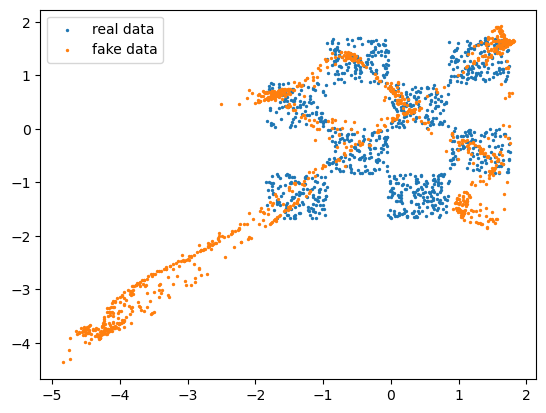

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.388e+00, generator: 7.222e-01


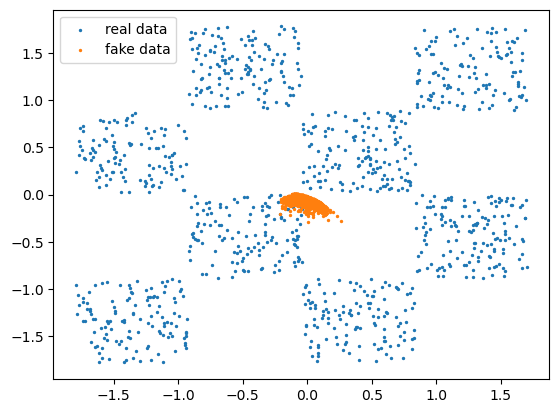

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.366e+00, generator: 7.417e-01


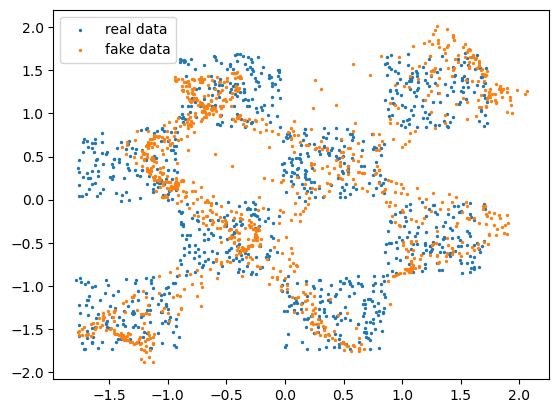

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.374e+00, generator: 6.826e-01


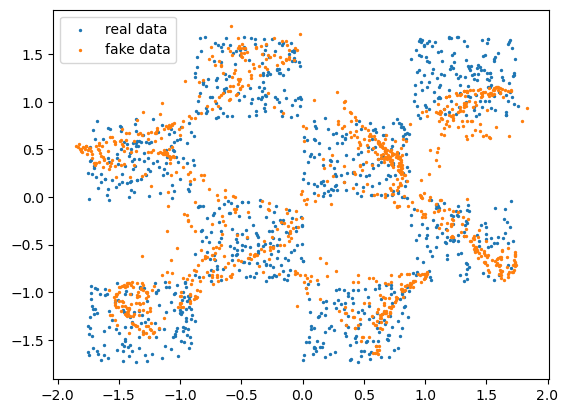

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 96
step 0: discriminator: 1.388e+00, generator: 7.182e-01


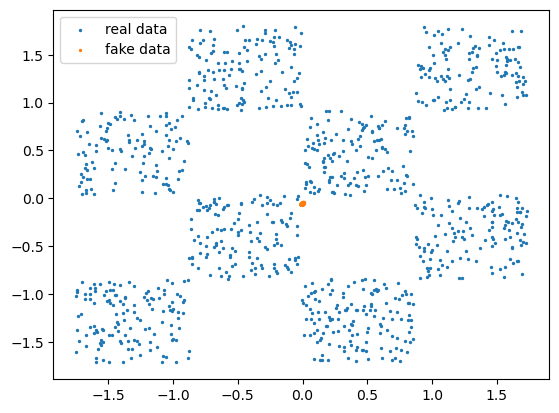

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 96
step 10000: discriminator: 1.357e+00, generator: 8.508e-01


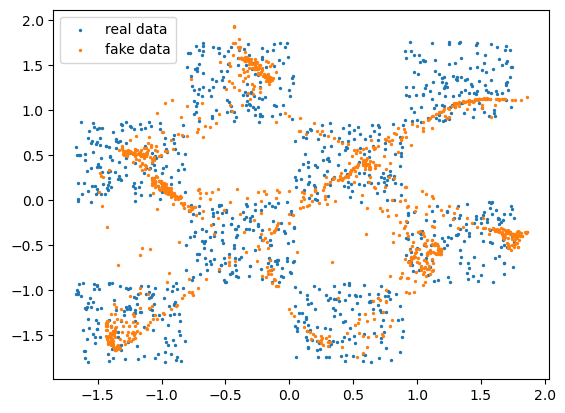

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 5, generator_width: 96
step 20000: discriminator: 1.371e+00, generator: 7.299e-01


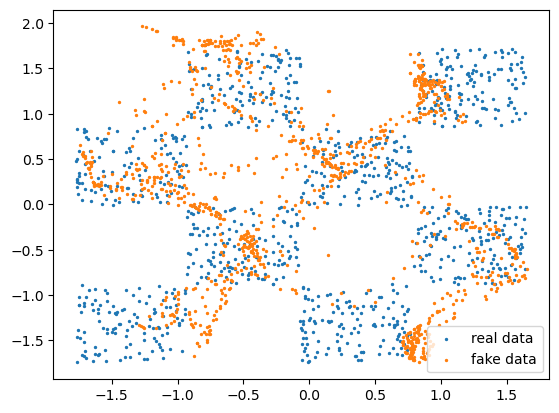

In [17]:
training(TRAIN_RATIO=1, generator_width=16, generator_depth=3, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=16, generator_depth=5, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=64, generator_depth=3, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=64, generator_depth=5, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=96, generator_depth=3, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=96, generator_depth=5, discriminator_width=128, discriminator_depth=5)

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 128
step 0: discriminator: 1.388e+00, generator: 7.265e-01


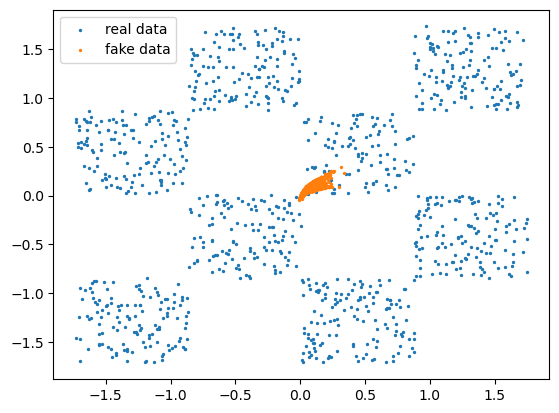

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 128
step 10000: discriminator: 1.390e+00, generator: 7.066e-01


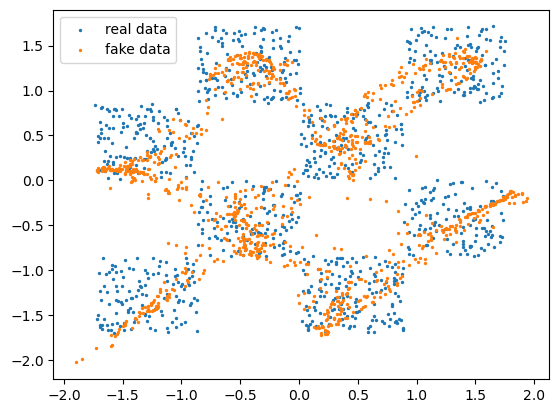

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 128
step 20000: discriminator: 1.387e+00, generator: 6.953e-01


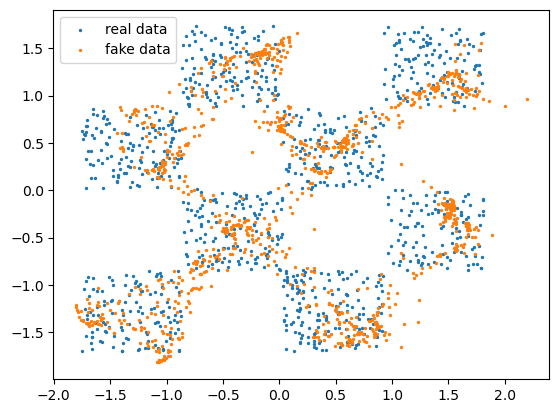

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 256
step 0: discriminator: 1.384e+00, generator: 7.148e-01


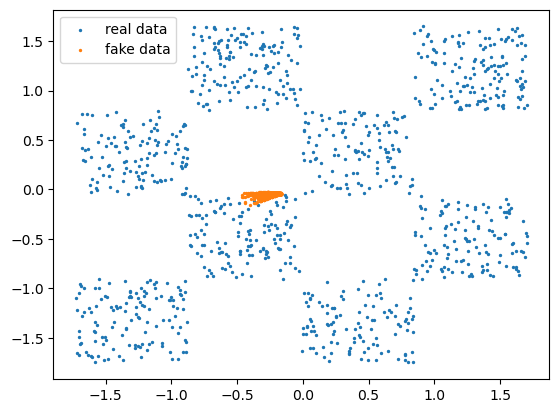

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 256
step 10000: discriminator: 1.301e+00, generator: 6.681e-01


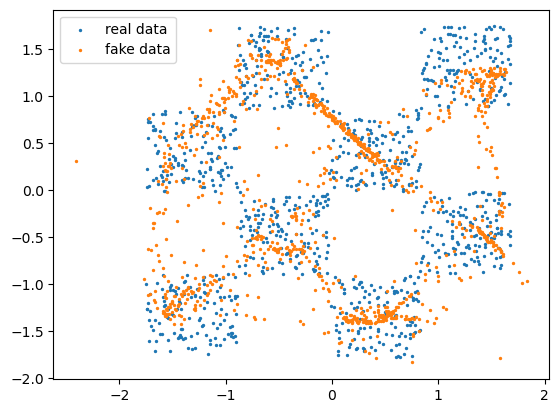

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 128, generator_depth: 3, generator_width: 256
step 20000: discriminator: 1.386e+00, generator: 6.932e-01


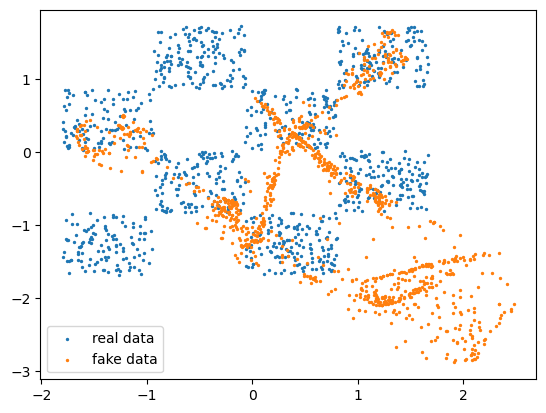

In [18]:
training(TRAIN_RATIO=1, generator_width=128, generator_depth=3, discriminator_width=128, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=256, generator_depth=3, discriminator_width=128, discriminator_depth=5)

In our experiments, we also notice that for more complex generator, we have more instability in the results and more inaccurate fake data generated after a high number of steps.
To obtain, the best results, with the discriminator neural network structure fixed, the generator has to be slightly less complex.
For a depth of 5 and a width of 128 for discriminator, best results were obtained with depth of 3 and width of 96 for generator.

TRAIN_RATIO 1: discriminator depth: 3, discriminator width: 96, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.378e+00, generator: 7.140e-01


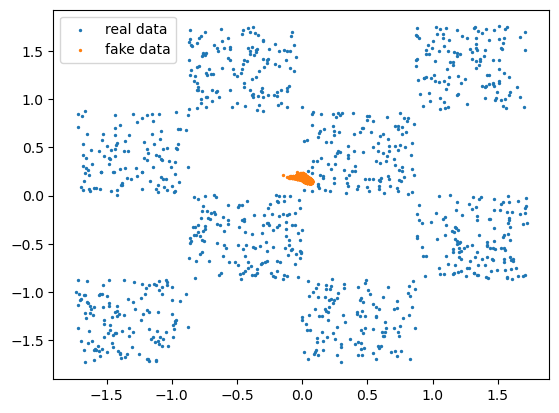

TRAIN_RATIO 1: discriminator depth: 3, discriminator width: 96, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.385e+00, generator: 6.990e-01


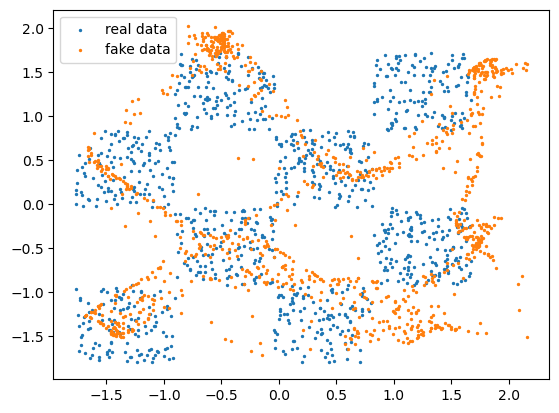

TRAIN_RATIO 1: discriminator depth: 3, discriminator width: 96, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.370e+00, generator: 6.853e-01


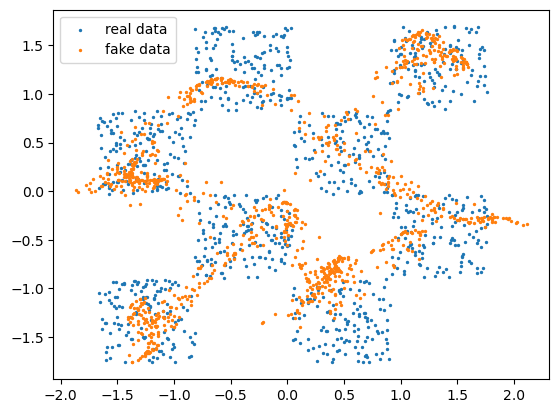

TRAIN_RATIO 1: discriminator depth: 1, discriminator width: 96, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.348e+00, generator: 6.455e-01


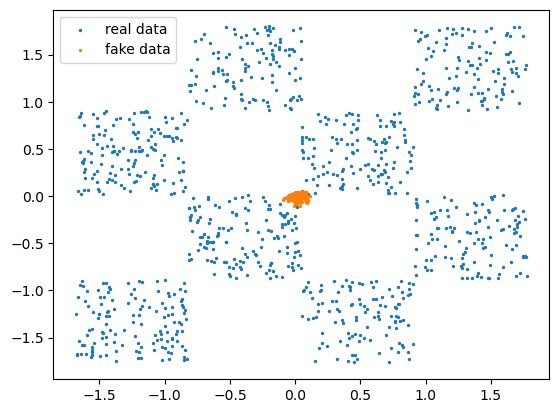

TRAIN_RATIO 1: discriminator depth: 1, discriminator width: 96, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.388e+00, generator: 7.764e-01


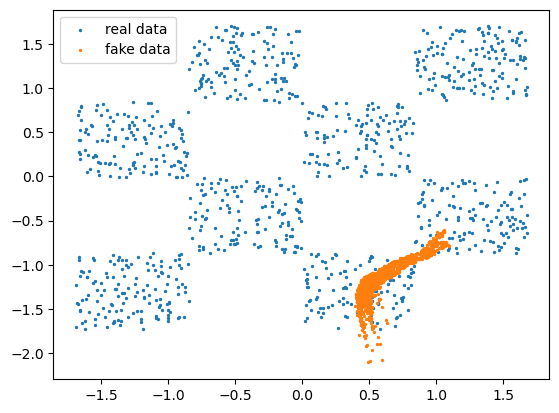

TRAIN_RATIO 1: discriminator depth: 1, discriminator width: 96, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.384e+00, generator: 7.044e-01


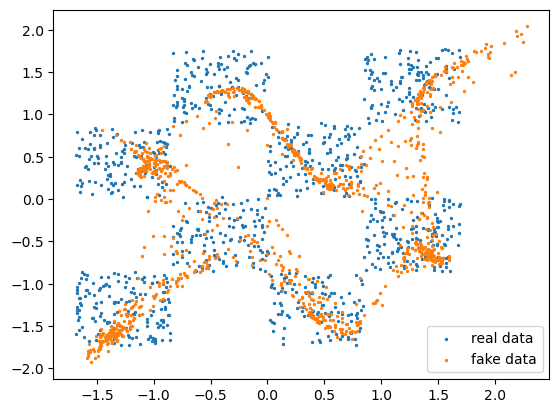

TRAIN_RATIO 1: discriminator depth: 3, discriminator width: 32, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.393e+00, generator: 7.526e-01


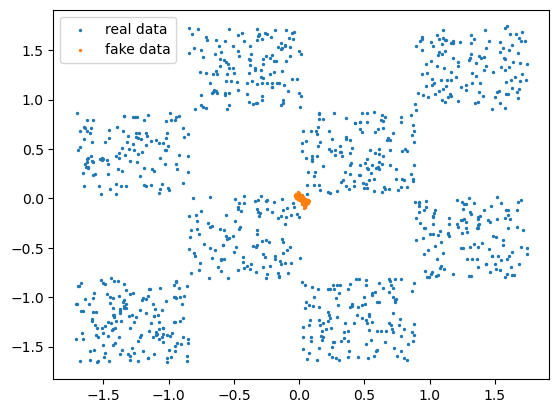

TRAIN_RATIO 1: discriminator depth: 3, discriminator width: 32, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.395e+00, generator: 6.911e-01


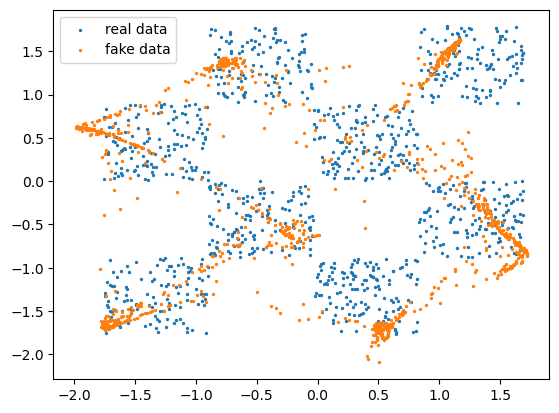

TRAIN_RATIO 1: discriminator depth: 3, discriminator width: 32, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.385e+00, generator: 7.059e-01


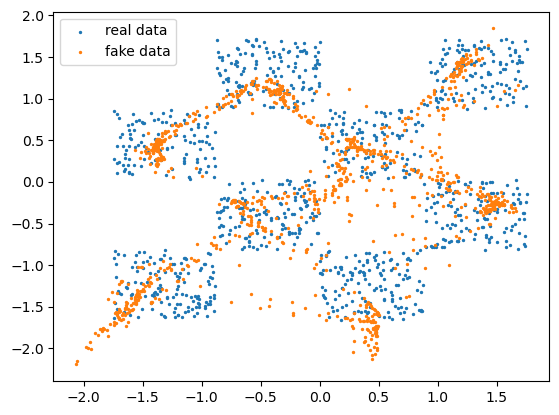

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.390e+00, generator: 7.370e-01


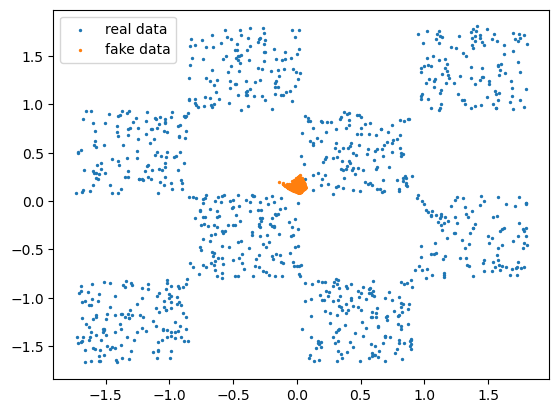

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.392e+00, generator: 6.987e-01


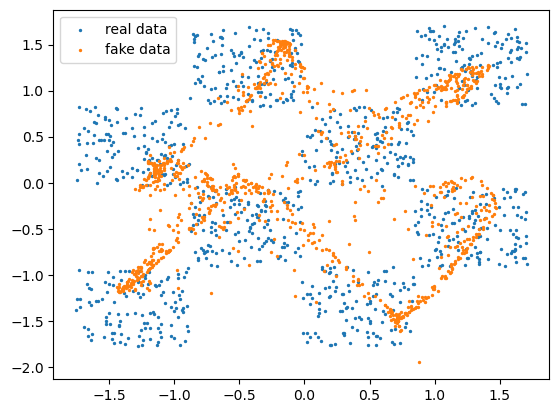

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.367e+00, generator: 6.993e-01


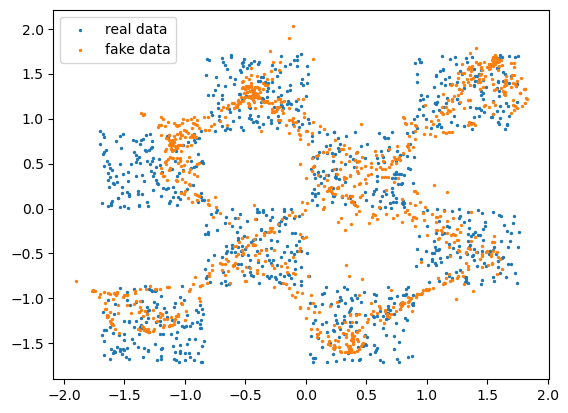

TRAIN_RATIO 1: discriminator depth: 7, discriminator width: 96, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.386e+00, generator: 6.910e-01


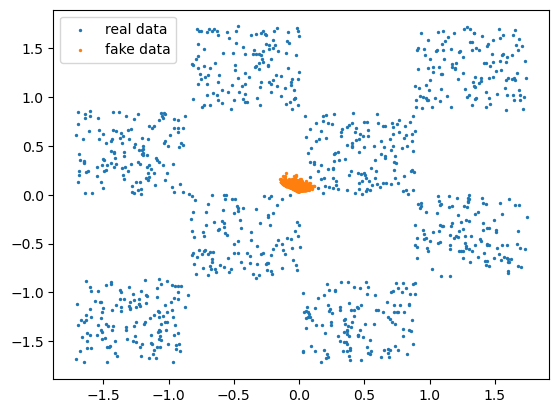

TRAIN_RATIO 1: discriminator depth: 7, discriminator width: 96, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.391e+00, generator: 7.355e-01


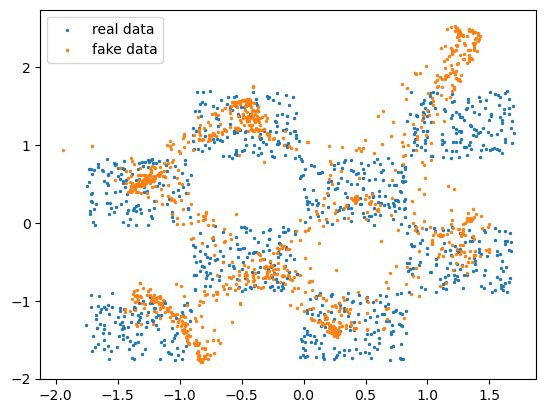

TRAIN_RATIO 1: discriminator depth: 7, discriminator width: 96, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.386e+00, generator: 6.933e-01


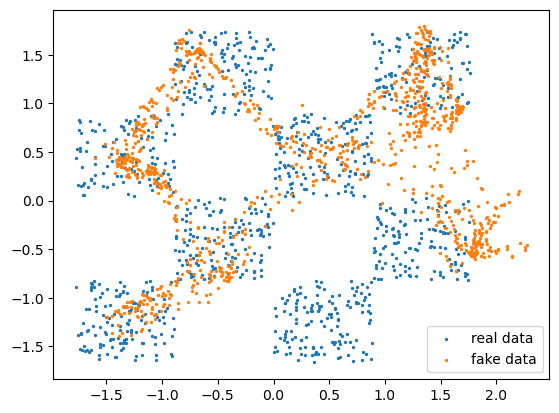

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 256, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.387e+00, generator: 7.052e-01


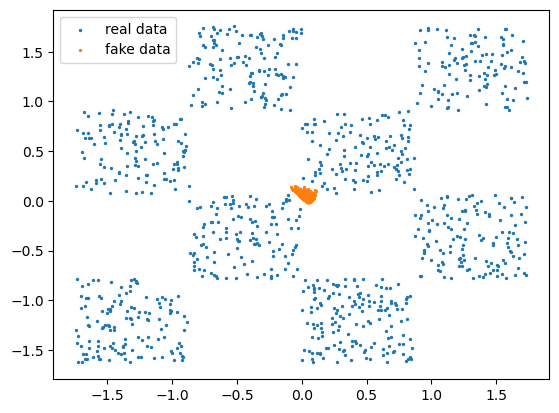

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 256, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.386e+00, generator: 6.931e-01


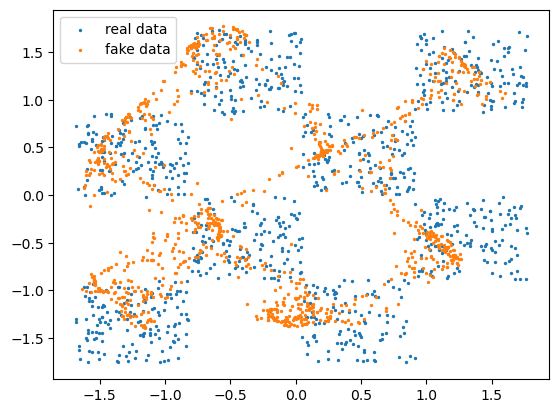

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 256, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.386e+00, generator: 6.932e-01


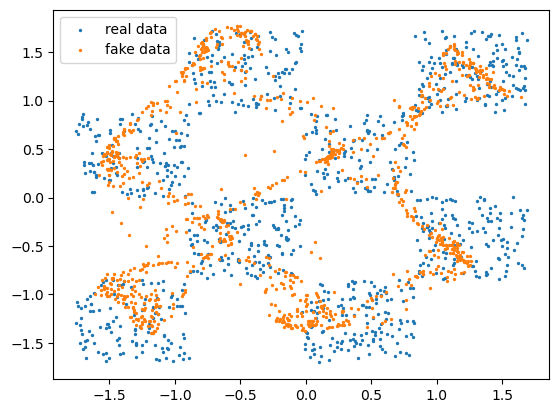

TRAIN_RATIO 1: discriminator depth: 7, discriminator width: 256, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.387e+00, generator: 6.732e-01


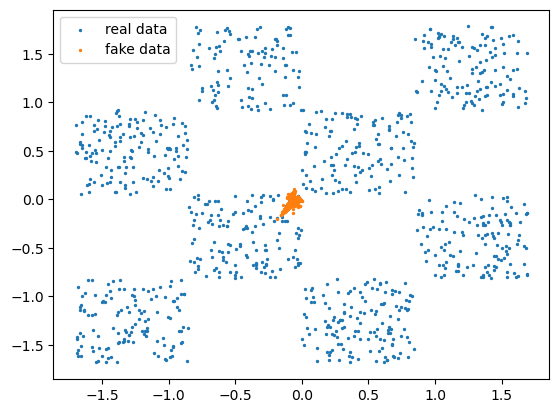

TRAIN_RATIO 1: discriminator depth: 7, discriminator width: 256, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.386e+00, generator: 6.854e-01


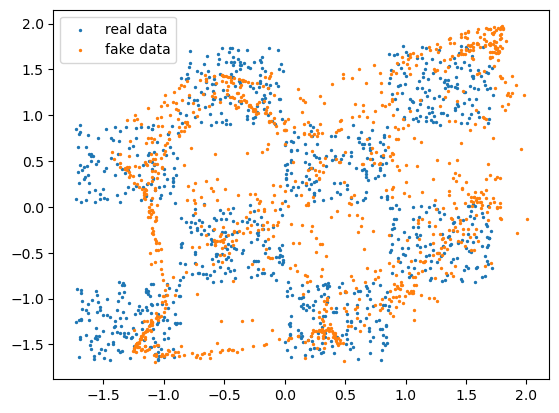

TRAIN_RATIO 1: discriminator depth: 7, discriminator width: 256, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.386e+00, generator: 6.933e-01


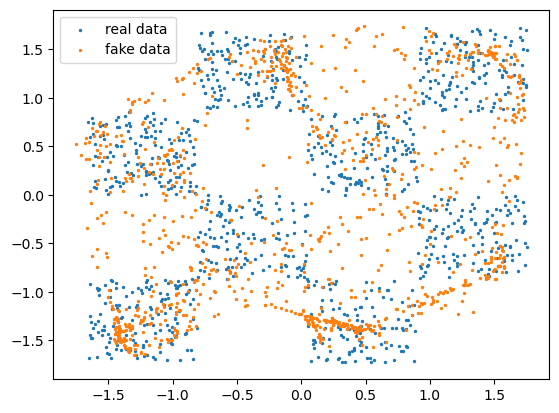

In [19]:
training(TRAIN_RATIO=1, generator_width=96, generator_depth=3, discriminator_width=96, discriminator_depth=3)
training(TRAIN_RATIO=1, generator_width=96, generator_depth=3, discriminator_width=96, discriminator_depth=1)
training(TRAIN_RATIO=1, generator_width=96, generator_depth=3, discriminator_width=32, discriminator_depth=3)
training(TRAIN_RATIO=1, generator_width=96, generator_depth=3, discriminator_width=96, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=96, generator_depth=3, discriminator_width=96, discriminator_depth=7)
training(TRAIN_RATIO=1, generator_width=96, generator_depth=3, discriminator_width=256, discriminator_depth=5)
training(TRAIN_RATIO=1, generator_width=96, generator_depth=3, discriminator_width=256, discriminator_depth=7)

We confirmed the following observations, and we can add that having a too large width is causing unstability in the results.
One advantage of having a more complex discriminator is that it can lead the generator to create more diverse fake data, but the downside is that it may lead to more innacurate generations.

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.392e+00, generator: 6.485e-01


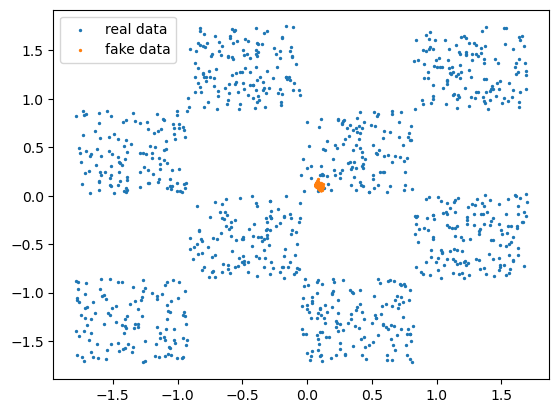

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.369e+00, generator: 7.121e-01


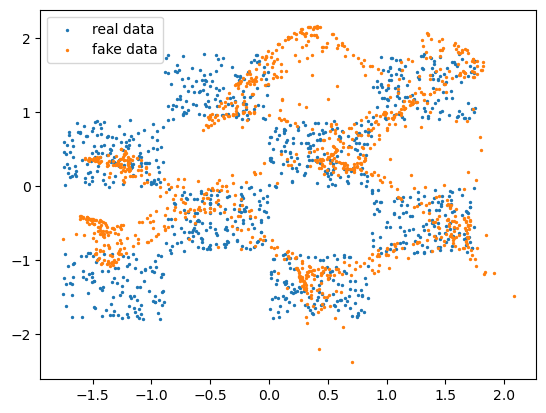

TRAIN_RATIO 1: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.386e+00, generator: 7.151e-01


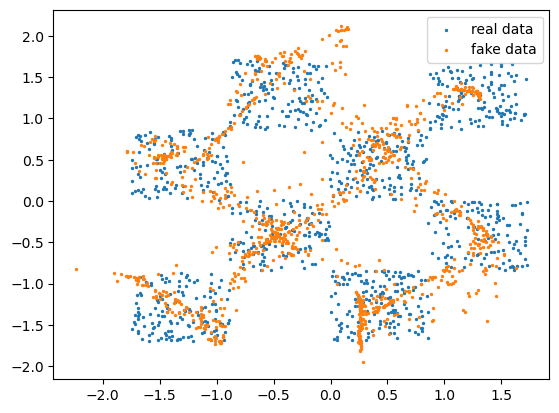

TRAIN_RATIO 2: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.381e+00, generator: 7.040e-01


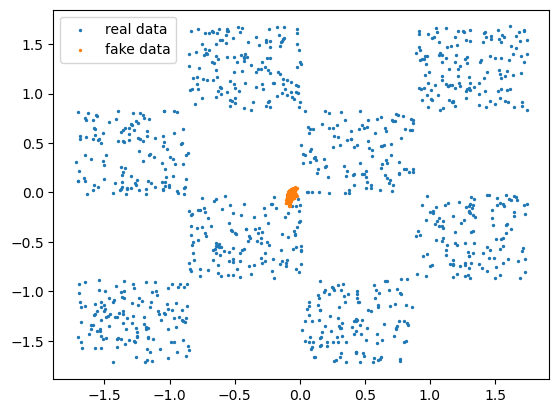

TRAIN_RATIO 2: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.386e+00, generator: 6.932e-01


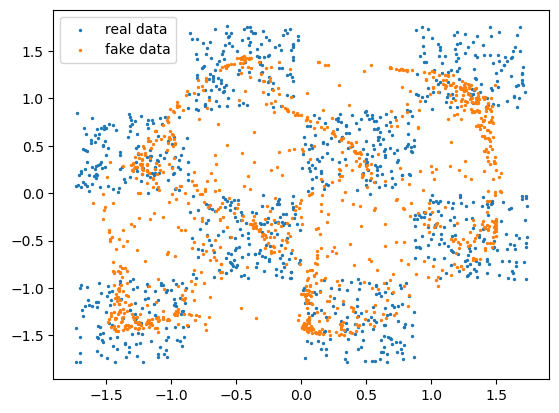

TRAIN_RATIO 2: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.386e+00, generator: 6.931e-01


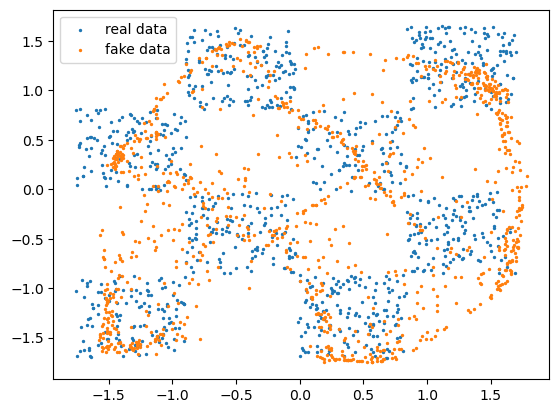

TRAIN_RATIO 3: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.375e+00, generator: 6.762e-01


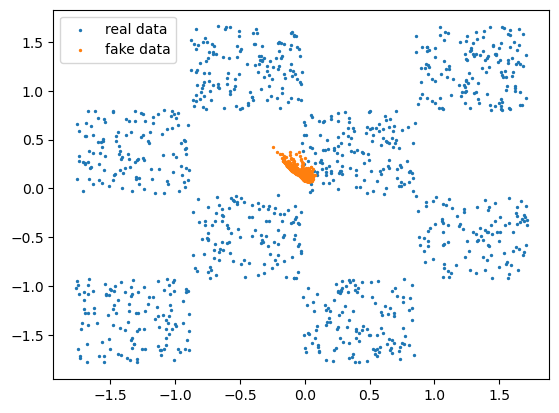

TRAIN_RATIO 3: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.383e+00, generator: 7.100e-01


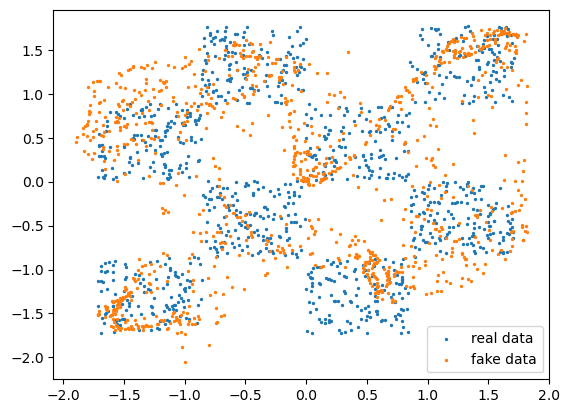

TRAIN_RATIO 3: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.380e+00, generator: 6.993e-01


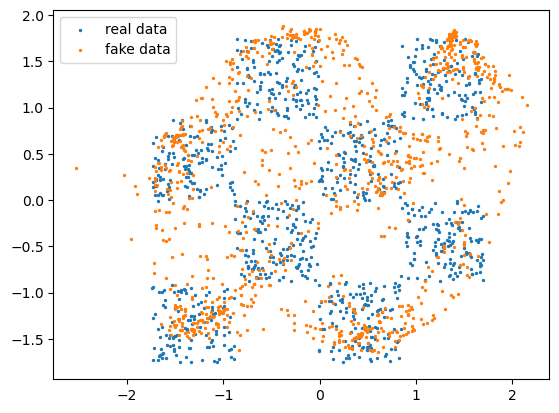

TRAIN_RATIO 4: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.377e+00, generator: 6.646e-01


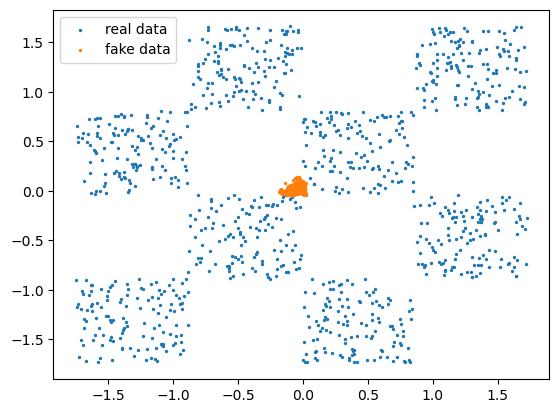

TRAIN_RATIO 4: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.377e+00, generator: 7.120e-01


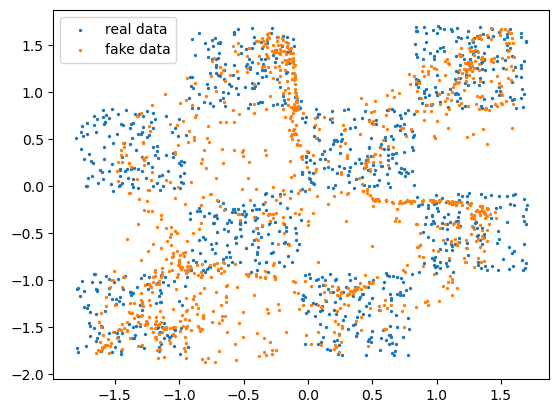

TRAIN_RATIO 4: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.387e+00, generator: 7.057e-01


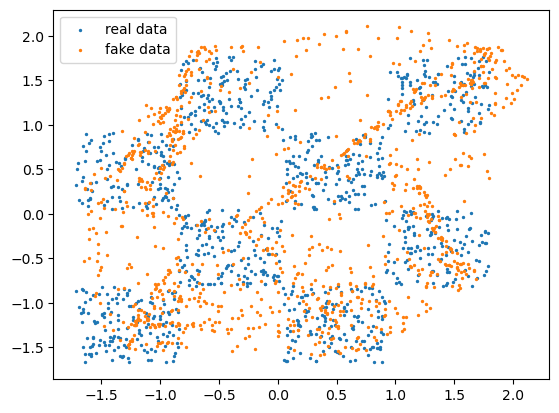

TRAIN_RATIO 5: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 0: discriminator: 1.368e+00, generator: 7.303e-01


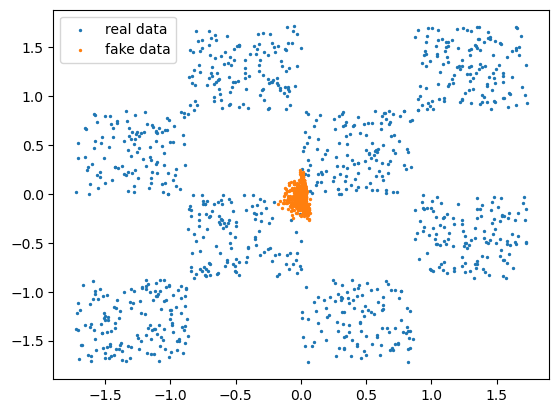

TRAIN_RATIO 5: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 10000: discriminator: 1.378e+00, generator: 7.243e-01


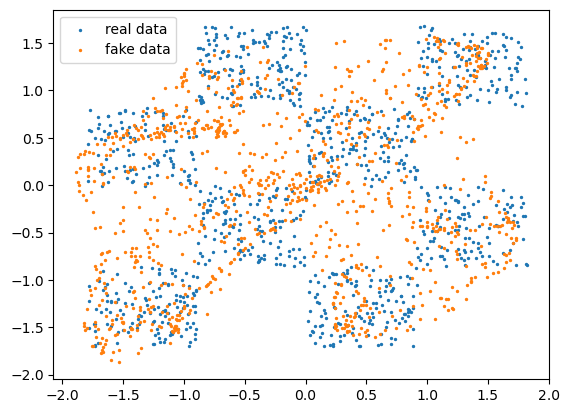

TRAIN_RATIO 5: discriminator depth: 5, discriminator width: 96, generator_depth: 3, generator_width: 96
step 20000: discriminator: 1.386e+00, generator: 6.924e-01


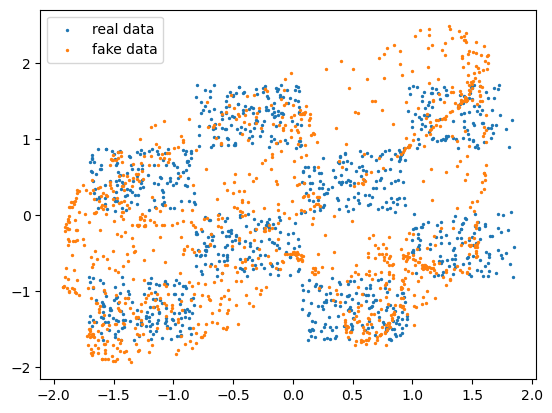

In [20]:
training(TRAIN_RATIO=1, generator_width=96, generator_depth=3, discriminator_width=96, discriminator_depth=5)
training(TRAIN_RATIO=2, generator_width=96, generator_depth=3, discriminator_width=96, discriminator_depth=5)
training(TRAIN_RATIO=3, generator_width=96, generator_depth=3, discriminator_width=96, discriminator_depth=5)
training(TRAIN_RATIO=4, generator_width=96, generator_depth=3, discriminator_width=96, discriminator_depth=5)
training(TRAIN_RATIO=5, generator_width=96, generator_depth=3, discriminator_width=96, discriminator_depth=5)



impact of TRAIN_RATIO : Increasing TRAIN_RATIO make the generator produce well-balanced data and prevent him from only focusing on some part of the data distribition. But having a high value give bad results and lead the generator to produce too much innacurate data.
    I think we have to find an optimal value depending on the structure chosen for width and discriminator network, and depending on the kind of results we want to have (diversity vs ratio of "good" fake data)

depth / width of the generator network : When the generator is too simple, it is only generate some part of the data. When it is too complex, it leads to unstability in the training (maybe requires more steps), and generate more innacurate data

depth / width of the discriminator network : To obtain the best results, the discriminator has to be a little bit more complex than the generator network, for example keeping the same width as the generator network and add 2 to its depth. If it is too simple compared to the generator network, it won't be able to provide good feedback, and the generator network won't be able to learn and will give poor generated data.

For further readings on GANs, you can see the following papers:

- Generative Adversarial Networks *(Goodfellow et al.)*: [arXiv:1406.2661](https://arxiv.org/abs/1406.2661)
- Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks *(Radford et al.)*: [arXiv:1511.06434](https://arxiv.org/abs/1511.06434)
- A Style-Based Generator Architecture for Generative Adversarial Networks *(Karras et al.)* [arxiv:1812.04948v3](https://arxiv.org/abs/1812.04948v3)

----
### Variational AutoEncoders

Another well-known approach to generative modelling is embodied by Variational AutoEncoders (VAEs). While the generative model itself and the procedure to sample it is similar to GANs, the way it is trained is not.

The main goal of VAEs is to optimize the likelihood of the real data according to the generative model. In other words, maximize $\mathbb{E}_{p_D} \left[\log p_\theta(x) \right ]$, which is equivalent to minimizing $D_{KL}(p_D \| p_\theta)$.
$$D_{KL}(p_D \| p_\theta) = \mathbb{E}_{p_D}\left[ log(\frac{p_D}{p_\theta}) \right]$$

**Q8: Prove this equivalence.**

> $$D_{KL}(p_D \| p_\theta) = \int p_D(x) \log \left( \frac{p_D(x)}{p_\theta(x)} \right) \, dx = \int p_D(x) \log p_D(x) \, dx - \int p_D(x) \log p_\theta(x) \, dx$$

So, minimizing $D_{KL}(p_D \| p_\theta)$ is equivalent to maximizing $\int p_D(x) \log p_\theta(x) \, dx = \mathbb{E}_{p_D} \left[\log p_\theta(x) \right ] $


However, the classes of distributions for which $\log p_\theta(x)$ can be analytically computed and optimized is very restricted, and not suitable for real world problems. The main idea of the VAE is thus to introduce a latent variable $z$ and decompose the distribution as: $p_\theta(x, z) = p_\theta(x | z) p(z)$. Here $p(z)$ is some fixed prior and $p_\theta(x | z)$ is a simple distribution whose parameters are the output of a neural network.

For example, you could have $p(z)$ be a standard $\mathcal{N}(0;1)$ and $p_\theta(x | z)$ be defined as a gaussian $\mathcal{N}(\mu_\theta(z); \sigma_\theta(z))$ where $\mu_\theta(z)$ and $\sigma_\theta(z)$ are created by the neural network you will train. In this case, the resulting distribution $p_\theta(x) = \int_z p_\theta(x|z)p(z)dz$ is an infinite mixture of Gaussians, which is a much more expressive class of distributions.

Now, this cannot stop here, as we are not able to analitically compute the density $p_\theta(x)$. The second main idea of the VAE is to introduce another, auxilliary distribution: $q_\phi(z | x)$, which will be modelled by a neural network similarly to $p_\theta(x | z)$. Introducing it allows us to create a lower bound for $\log p_\theta(x)$:

$$\log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \left[ \log p_\theta(x) \frac {q_\phi(z|x)}{q_\phi(z|x)} \right]$$

Following Bayes theorem, $p_\theta(x) p_\theta(z|x) = p_\theta(x, z) = p_\theta(x|z) p(z)$, so we get:

$$\log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \left[ \log \frac{p_\theta(x|z) p(z)}{p_\theta(z|x)} \frac {q_\phi(z|x)}{q_\phi(z|x)} \right]$$

Re-organizing the terms:

$$\log p_\theta(x) = \mathbb{E}_{z \sim q_\phi} \log \frac{q_\phi(z|x)}{p_\theta(z|x)} + \mathbb{E}_{z \sim q_\phi} \log \frac{p(z)}{q_\phi(z|x)} + \mathbb{E}_{z \sim q_\phi} \log p_\theta(x | z)$$

This can be re-expressed like so:

$$\log p_\theta(x) = D_{KL}(q_\phi(z | x) \| p_\theta(z | x)) - D_{KL}(q_\phi(z | x) \| p(z)) + \mathbb{E}_{z \sim q_\phi} \log p_\theta(x|z)$$

The 3 terms of this equality can be interpreted like so:

- the first term measures how much $q_\phi(z | x)$ is similar to $p_\theta(z | x)$, or in other words is a good inverse of $p_\theta(x | z)$
- the second term measures how similar $q_\phi(z|x)$ is from the latent prior $p(z)$
- the third term is linked to how likely $p_\theta$ is to yield the given $x$ when $z$ is sampled from $q_\phi(z | x)$ rather than $p(z)$

It is interesting to note that the first term, being a KL-divergence is always positive. As such the combination of the last two terms forms a lower bound of $\log p_\theta(x)$ which *can* be computed and used as a training objective. This bound is called the *Evidence Lower-Bound (ELBO)*. Simply flipping its sign can make it into a loss that can be minimized by gradient descent:

$$ \mathcal{L}_{ELBO} = D_{KL}(q_\phi(z | x) \| p(z)) + \mathbb{E}_{z \sim q_\phi} [ - \log p_\theta(x|z) ]$$

From this formulation comes the parallel with auto-encoders that give the VAE its name: $q_\phi(z | x)$ can be seen as a *probabilistic encoder* from the data $x$ to the latent space $z$, and $p_\theta(x | z)$ can be seen as a *probabilistic decoder* from the latent space $z$ to the data $x$. In this case the second term of $\mathcal{L}_{ELBO}$ is the loss measuring the reconstruction quality of the auto-encoder, and the first term can be seens as a regularization of the latent space.

![VAE](./vae-gaussian.png)

**Q9: We can see that $p(z)$ is never sampled during the training process, how can that be a problem?**

> 
p(z) plays a role in the distribution $p_\theta(x, z) = p_\theta(x | z) p(z)$.

When the VAE generate data, it will come from the destribution resulting from the previous one integrated on z: $p_\theta(x) = \int_z p_\theta(x|z)p(z)dz$.

If we are not sampling $p(z)$ during the training process, it will have an impact on the data generation, it may lead to some problems. First, the model would overfit on training data, and it won't be able to genzeralize well on new unseen data having a different prior distribution $p(z)$

A typical choice to represent $q_\phi(z | x)$ is to use a diagonal Gaussian distribution $\mathcal{N}(\mu_\phi(x); Diag(\sigma_\phi^2(x)))$, which makes the KL-divergence term of $\mathcal{L}_{ELBO}$ analytically computable.

**Q10: Assuming $p(z)$ is a $\mathcal{N}(0; Id)$ gaussian, what is the value of $D_{KL}(q_\phi(z | x) \| p(z))$?**

> We will use the result giving the KL divergence between two multivariate Gaussians (https://www.researchgate.net/publication/349195372_On_the_Properties_of_Kullback-Leibler_Divergence_Between_Multivariate_Gaussian_Distributions).

> As $q_\phi(z | x)$ is a $\mathcal{N}(0; \mu_\phi(x); Diag(\sigma_\phi^2(x)))$ gaussian, we have that:

> $$\begin{align*}
D_{KL}(q_\phi(z | x) \| p(z)) 
&= \frac{1}{2} \left( \text{tr}(Id^{-1} Diag(\sigma_\phi^2(x))) + (\mu_\phi(x) - 0)^\top Id^{-1} (\mu_\phi(x) - 0) - d + \log \left( \frac{\text{det}(Id)}{\text{det}(Diag(\sigma_\phi^2(x)))} \right) \right)\\
&= \frac{1}{2} \left( \text{tr}(Diag(\sigma_\phi^2(x))) + (\mu_\phi(x))^\top (\mu_\phi(x)) - d - \log \left( \text{det}(Diag(\sigma_\phi^2(x))) \right) \right)\\
&= \frac{-d}{2} + \frac{1}{2} \sum_{i=1}^{d}\left( \sigma_{\phi_i}^2(x) + \mu_{\phi_i}^2(x) - \log(\sigma_{\phi_i}^2(x))\right)
\end{align*}$$


We will also model $p_\theta(x | z)$ as a diagonal Gaussian $\mathcal{N}(\mu_\theta(z); Diag(\sigma_\theta^2(z)))$.


**Note:** For the following, be careful about the difference between $\mu_\phi, \sigma_\phi$ which define the Gaussian distribution of the *encoder* $q_\phi$ and $\mu_\theta, \sigma_\theta$ which define the Gaussian distribution of the *decoder* $p_\theta$.

**Q11: What is the expression of $-\log p_\theta(x | z)$ for given $x$ and $z$?**

> $$\begin{align*}
p_\theta(x | z) &= \frac{1}{(2\pi)^{n/2} |\text{Diag}(\sigma_{\theta}^2(z))|^{1/2}} \exp\left(-\frac{1}{2} (x - \mu_{\theta}(z))^\top \text{Diag}(\sigma_{\theta}^2)^{-1} (x - \mu_{\theta}(z))\right) \\
&= \frac{1}{(2\pi)^{n/2} \sqrt{\prod_{i=1}^{n} \sigma_{\theta_i}^2(z)}} \exp\left(-\frac{1}{2} \sum_{i=1}^{n} \frac{(x_i - \mu_{\theta_i}(z))^2}{\sigma_{\theta_i}^2(z)}\right)
\end{align*}
$$
So,
> $$\begin{align*}
-\log p_\theta(x | z) &= \frac{1}{2} \sum_{i=1}^{d} \frac{(x_i - \mu_{\theta_i}(z))^2}{\sigma_{\theta_i}^2(z)} + \frac{d}{2} \log(2\pi) + \frac{1}{2} \sum_{i=1}^{d} \log(\sigma_{\theta_i}^2(z))
\end{align*}
$$

We will build and train a VAE using the same dataset as previously, in order to compare its behavior to GANs. For numerical stability, we will interpret the output of the encoder and decoder networks as $(\mu, \log\sigma^2)$, rather than $(\mu, \sigma)$.

In [44]:
# Choose a value for the latent dimension
LATENT_N = 10

# Define the generator
class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc_mu = nn.Linear(2, LATENT_N)
        self.fc_logvar = nn.Linear(2, LATENT_N)
        
    # encode a datapoint. This should return a couple of tensors (mu, logvar) representing
    # the parameters of the Gaussian q_\phi(z | x)
    def __call__(self, x):
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return (mu, logvar)
    

# Define the discriminator
class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc_mu = nn.Linear(LATENT_N, 2)
        self.fc_logvar = nn.Linear(LATENT_N, 2)
    
    # decode a datapoint. This should return a couple of tensors (mu, logvar) representing
    # the parameters of the Gaussian p_\theta(z | x)
    def __call__(self, z):
        mu = self.fc_mu(z)
        logvar = self.fc_logvar(z)
        return (mu, logvar)

    def generate(self, batchlen):
        z = torch.normal(torch.zeros(batchlen, LATENT_N), 1.0)
        (mu, logvar) = self.__call__(z)
        return torch.normal(mu, torch.exp(0.5*logvar))

From this, the parameters of both networks are trained conjointly using the same loss $\mathcal{L}_{ELBO}$. 

step 0: KL: 4.195e+02, rec: 4.152e+02


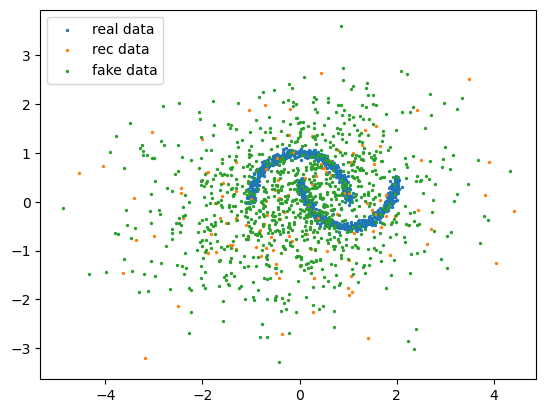

step 1000: KL: 1.616e+01, rec: 2.371e+02


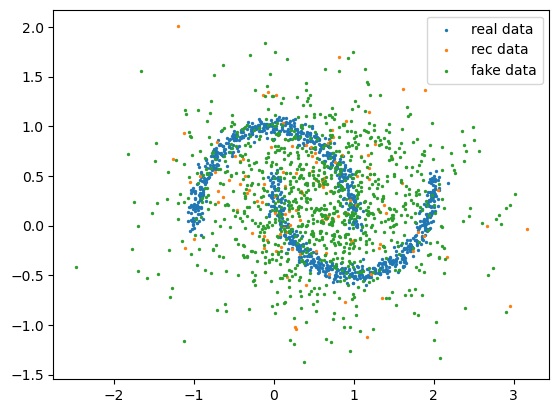

step 2000: KL: 5.072e+01, rec: 1.903e+02


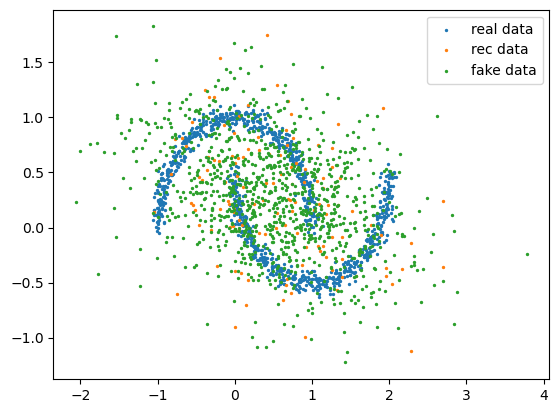

step 3000: KL: 5.958e+01, rec: 1.748e+02


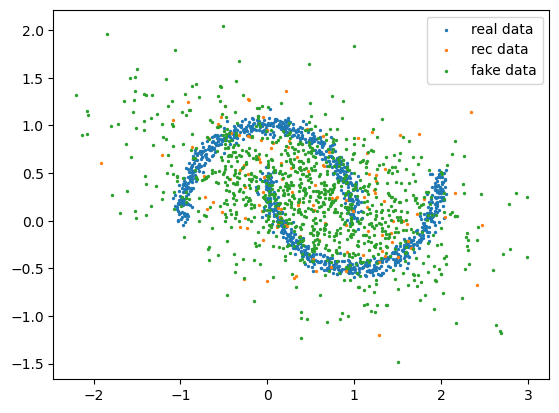

step 4000: KL: 6.184e+01, rec: 1.756e+02


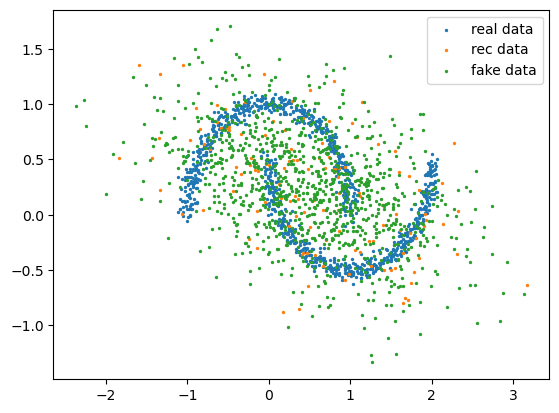

step 5000: KL: 6.280e+01, rec: 1.912e+02


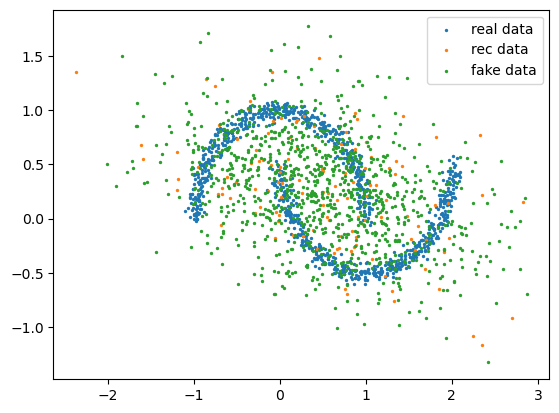

step 6000: KL: 6.193e+01, rec: 1.752e+02


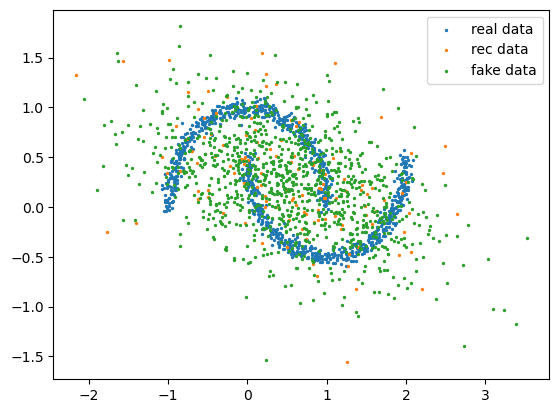

step 7000: KL: 6.246e+01, rec: 1.820e+02


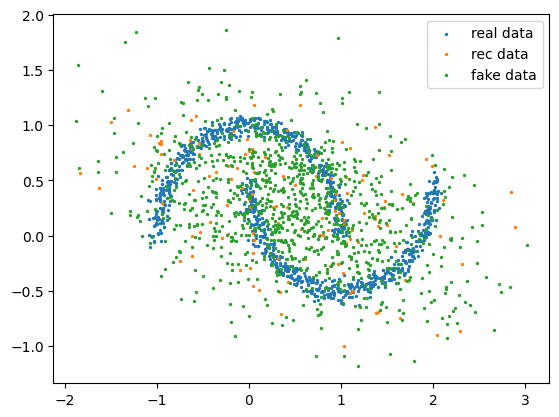

step 8000: KL: 6.571e+01, rec: 1.832e+02


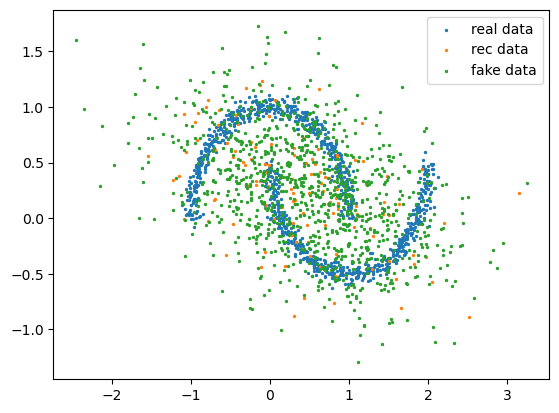

step 9000: KL: 6.554e+01, rec: 1.738e+02


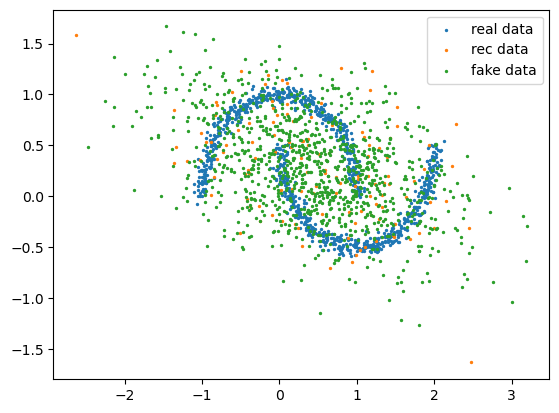

step 10000: KL: 6.442e+01, rec: 1.823e+02


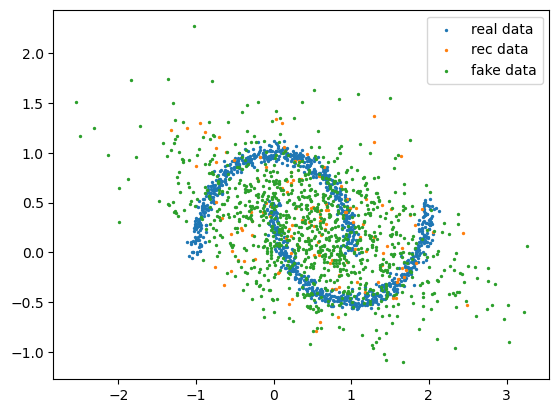

step 11000: KL: 6.220e+01, rec: 1.761e+02


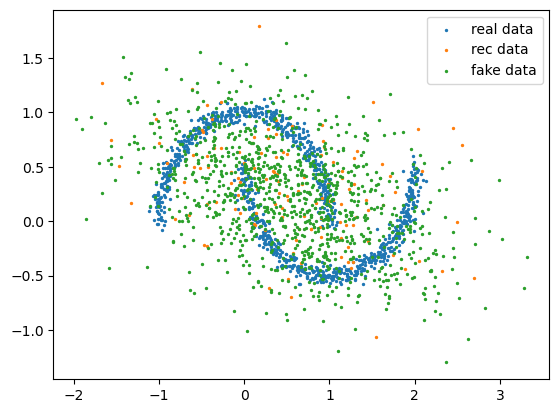

step 12000: KL: 6.586e+01, rec: 1.792e+02


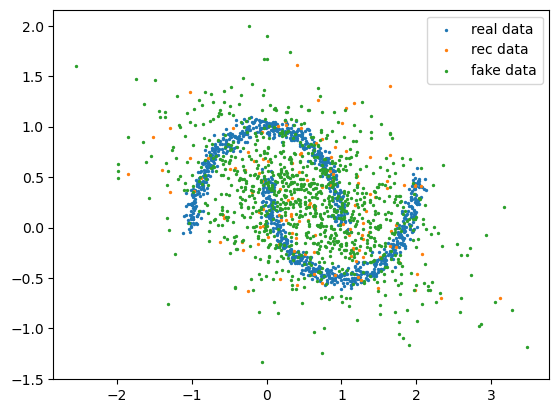

step 13000: KL: 6.514e+01, rec: 1.879e+02


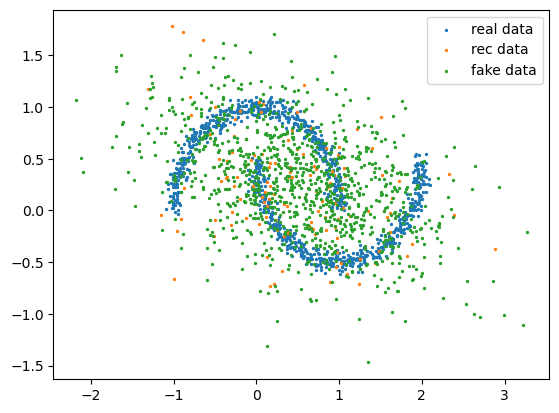

step 14000: KL: 6.489e+01, rec: 1.750e+02


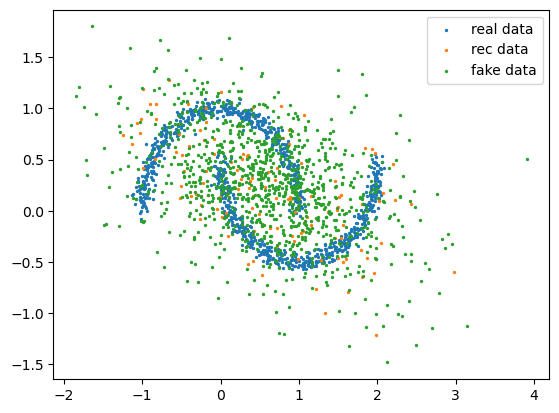

step 15000: KL: 6.335e+01, rec: 1.847e+02


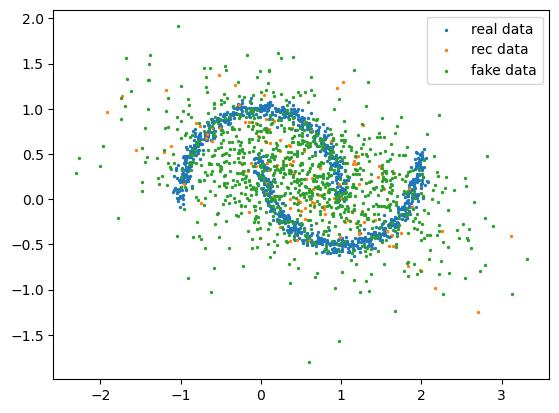

step 16000: KL: 6.355e+01, rec: 1.775e+02


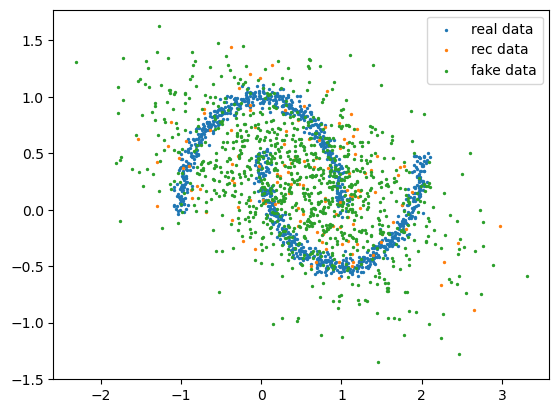

step 17000: KL: 6.273e+01, rec: 1.732e+02


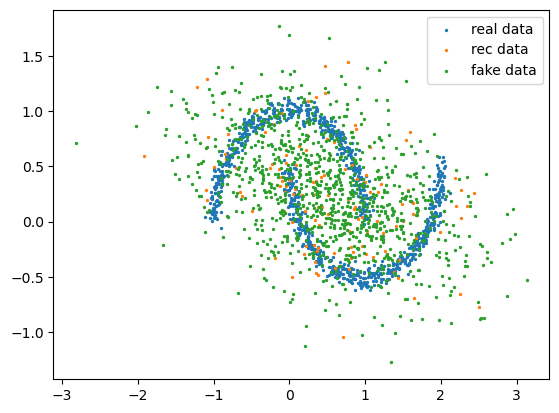

step 18000: KL: 6.134e+01, rec: 1.816e+02


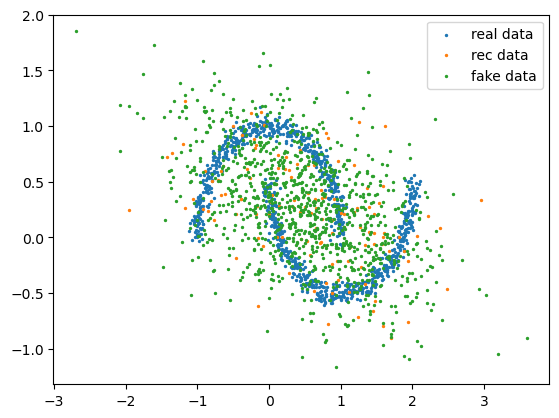

step 19000: KL: 6.317e+01, rec: 1.774e+02


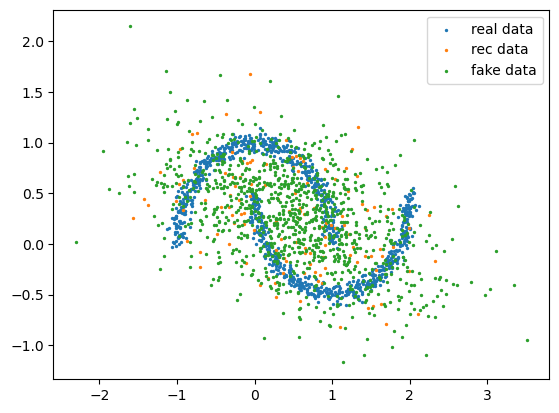

step 20000: KL: 6.556e+01, rec: 1.698e+02


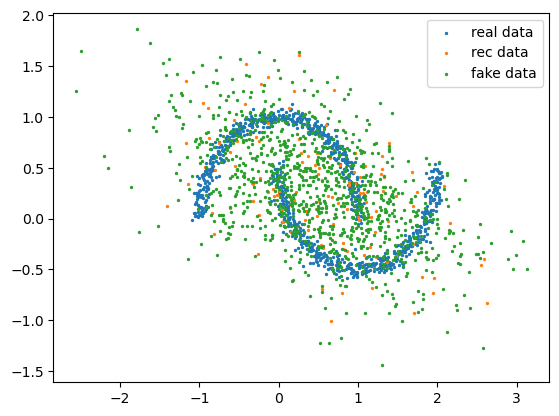

step 21000: KL: 6.483e+01, rec: 1.713e+02


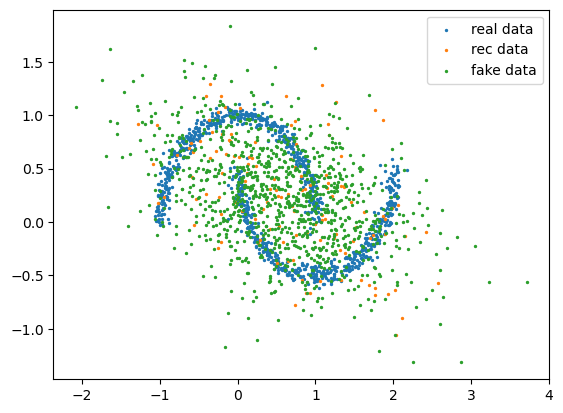

step 22000: KL: 6.220e+01, rec: 1.806e+02


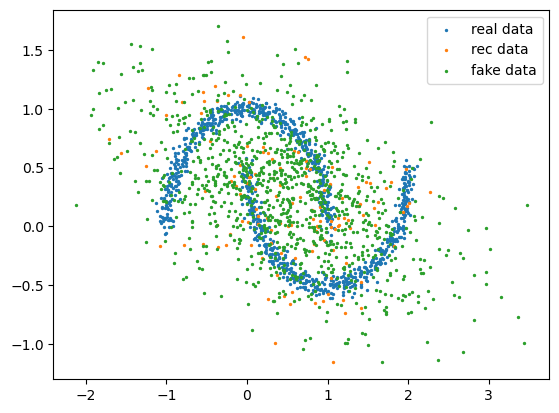

step 23000: KL: 6.261e+01, rec: 1.800e+02


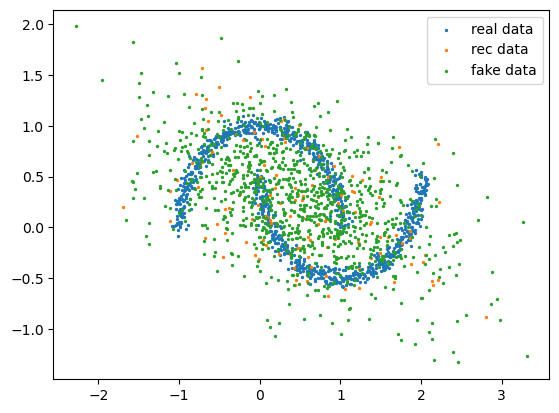

step 24000: KL: 6.253e+01, rec: 1.777e+02


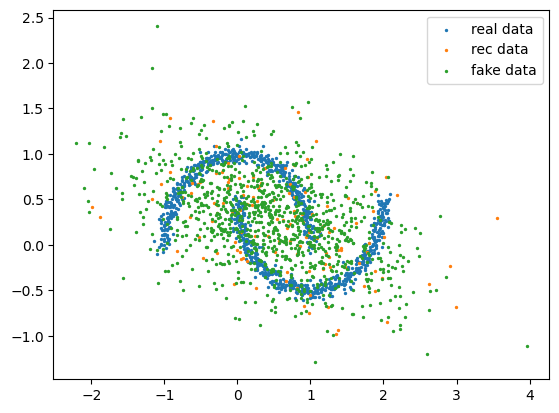

step 25000: KL: 6.479e+01, rec: 1.802e+02


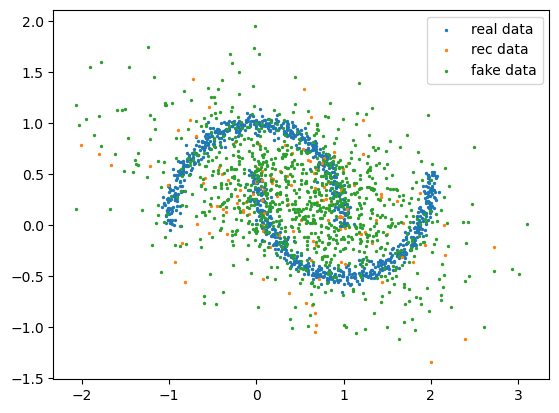

step 26000: KL: 6.360e+01, rec: 1.724e+02


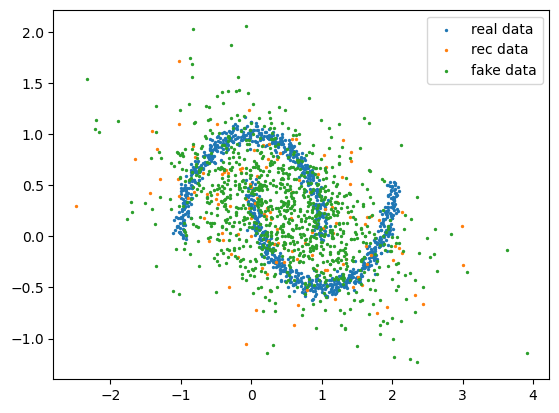

step 27000: KL: 6.426e+01, rec: 1.824e+02


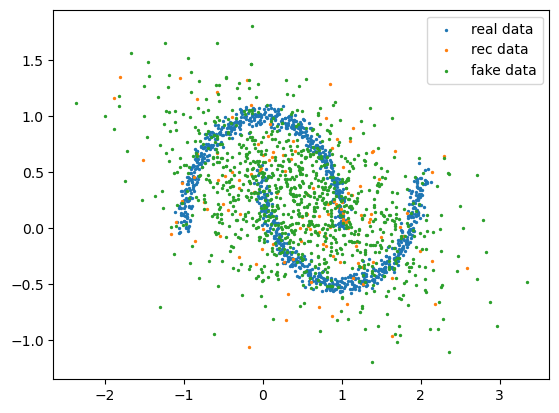

step 28000: KL: 6.561e+01, rec: 1.698e+02


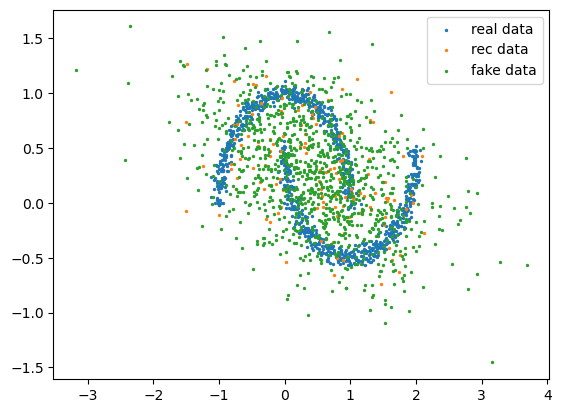

step 29000: KL: 6.364e+01, rec: 1.776e+02


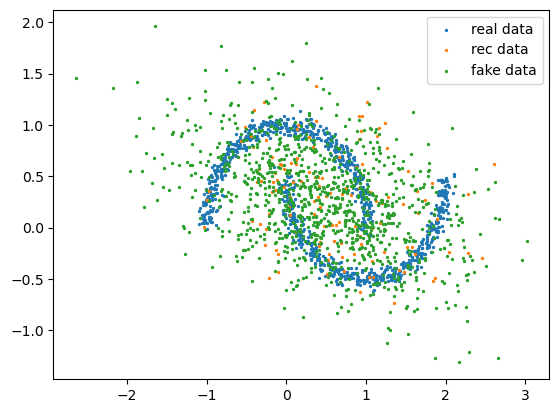

step 30000: KL: 6.410e+01, rec: 1.574e+02


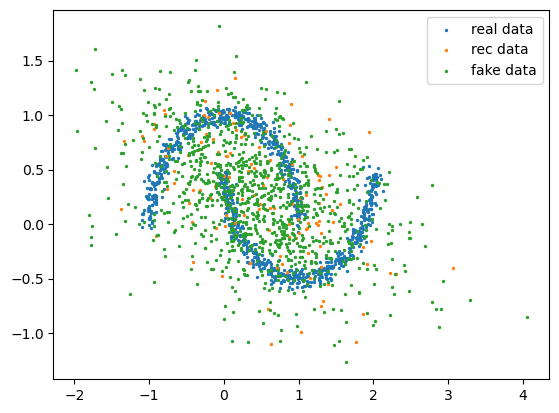

step 31000: KL: 6.220e+01, rec: 1.900e+02


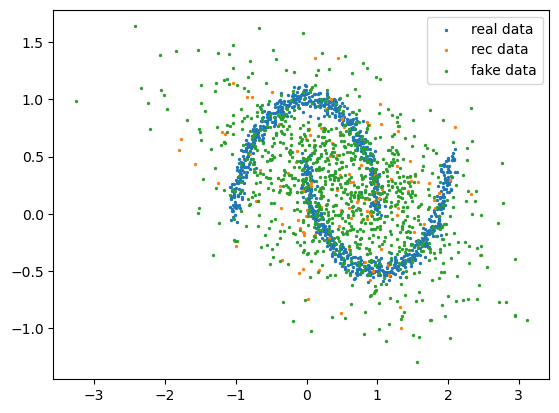

step 32000: KL: 6.386e+01, rec: 1.786e+02


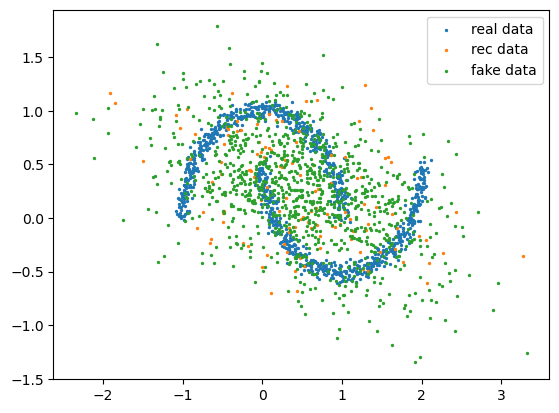

step 33000: KL: 6.303e+01, rec: 2.008e+02


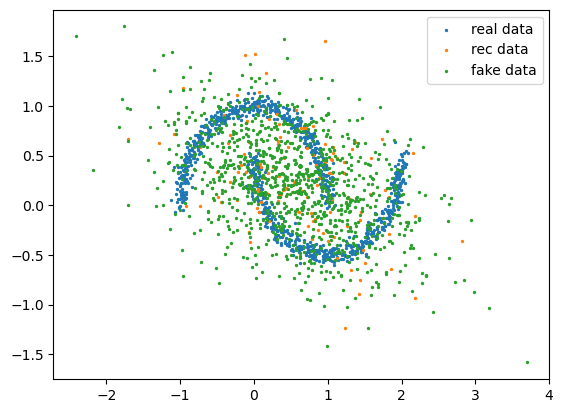

step 34000: KL: 6.398e+01, rec: 1.667e+02


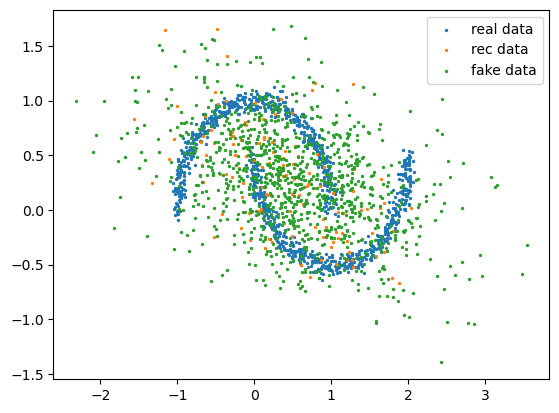

step 35000: KL: 6.431e+01, rec: 1.921e+02


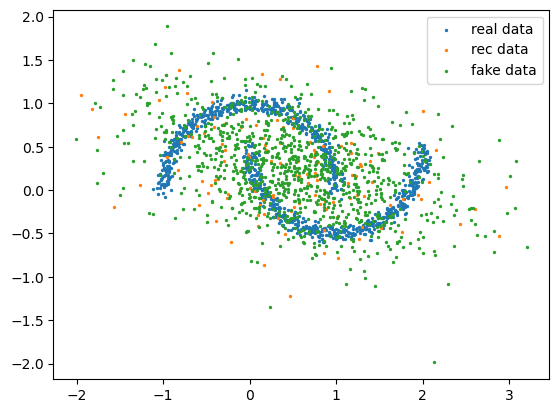

step 36000: KL: 6.306e+01, rec: 1.838e+02


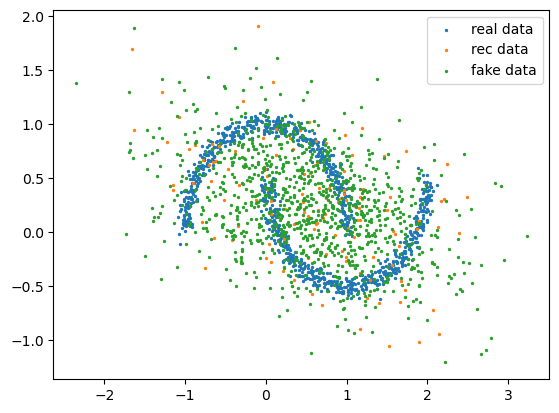

step 37000: KL: 6.282e+01, rec: 2.017e+02


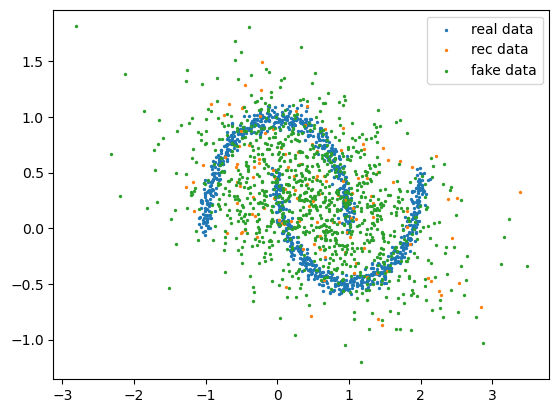

step 38000: KL: 6.090e+01, rec: 1.893e+02


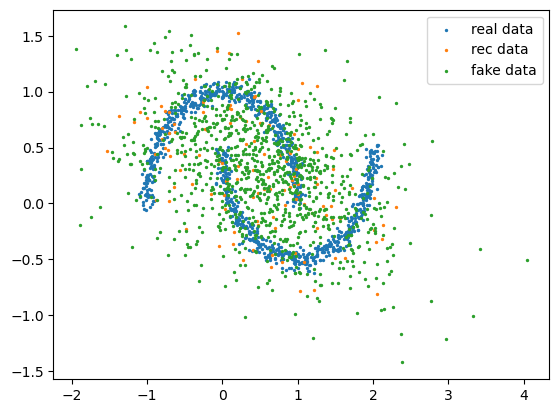

step 39000: KL: 6.416e+01, rec: 1.683e+02


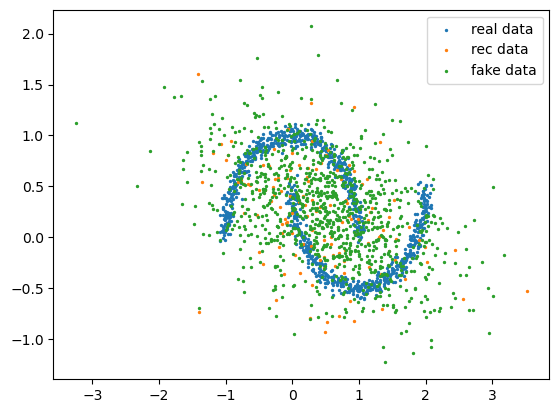

step 40000: KL: 6.222e+01, rec: 1.731e+02


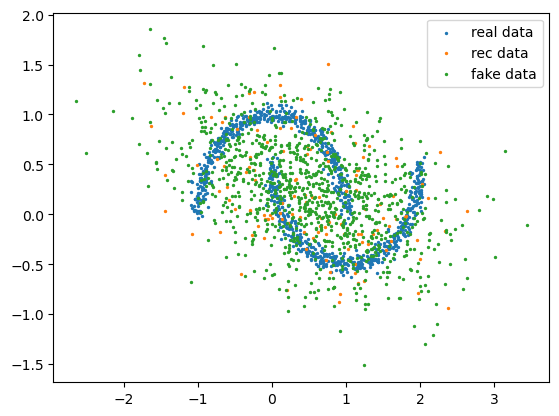

In [45]:
# Total number of training iterations for the VAE
N_ITER = 40001
# Batch size to use
BATCHLEN = 128

encoder = Encoder()
optim_enc = torch.optim.Adam(encoder.parameters(), lr=0.001, betas=(0.5,0.9))
decoder = Decoder()
optim_dec = torch.optim.Adam(decoder.parameters(), lr=0.001, betas=(0.5,0.9))

for i in range(N_ITER):
    encoder.zero_grad()
    decoder.zero_grad()
    
    x = generate_batch(BATCHLEN)
    
    enc_mu, enc_logvar = encoder(x)
    #
    # COMPUTE THE KL PART OF THE LOSS HERE
    #
    loss_kl = 0.5 * torch.sum(torch.exp(enc_logvar) + torch.square(enc_mu) enc_logvar - 1)
    #
    # SAMPLE z FROM q(z|x) HERE
    #
    z = enc_mu + torch.exp(0.5*enc_logvar) * torch.randn_like(enc_logvar)
    
    dec_mu, dec_logvar = decoder(z)
    #
    # COMPUTE THE RECONSTRUCTION PART OF THE LOSS HERE
    #
    loss_rec = 0.5 * torch.sum(torch.square(x-dec_mu)/torch.exp(dec_logvar) + dec_logvar + np.log(2*torch.pi))
    
    (loss_kl + loss_rec).backward()
    optim_enc.step()
    optim_dec.step()
    if i%1000 == 0:
        print('step {}: KL: {:.3e}, rec: {:.3e}'.format(i, float(loss_kl), float(loss_rec)))
        # plot the result
        real_batch = generate_batch(1024)
        rec_batch = torch.normal(dec_mu, torch.exp(0.5*dec_logvar)).detach()
        fake_batch = decoder.generate(1024).detach()
        plt.scatter(real_batch[:,0], real_batch[:,1], s=2.0, label='real data')
        plt.scatter(rec_batch[:,0], rec_batch[:,1], s=2.0, label='rec data')
        plt.scatter(fake_batch[:,0], fake_batch[:,1], s=2.0, label='fake data')
        plt.legend()
        plt.show()

**Q12: Try hardcoding $\sigma_\theta(z)$ to some small value (like 1E-4) rather than allowing the decoder to learn it. What does it change?**

In [48]:
# Choose a value for the latent dimension
LATENT_N = 10

# Define the generator
class Encoder(nn.Module):
    def __init__(self, width, depth, LATENT_N):
        super().__init__()
        self.fc_in = nn.Linear(2, width)
        self.fc_list = nn.ModuleList([nn.Linear(width, width) for _ in range(depth - 1)])
        self.fc_out_mu = nn.Linear(width, LATENT_N)
        self.fc_out_logvar = nn.Linear(width, LATENT_N)
        self.relu = nn.ReLU()
        
        
    
    # encode a datapoint. This should return a couple of tensors (mu, logvar) representing
    # the parameters of the Gaussian q_\phi(z | x)
    def __call__(self, x):
        x = self.relu(self.fc_in(x))
        for layer in self.fc_list:
            x = self.relu(layer(x))

        mu = self.fc_out_mu(x)
        logvar = self.fc_out_logvar(x)
        
        return (mu, logvar)
    

# Define the discriminator
class Decoder(nn.Module):
    def __init__(self, width, depth, LATENT_N, hardcoded):
        super().__init__()
        self.width = width
        self.depth = depth
        self.fc_in = nn.Linear(LATENT_N, width)
        self.fc_list = nn.ModuleList([nn.Linear(width, width) for _ in range(depth - 1)])
        self.fc_out_mu = nn.Linear(width, 2)
        self.fc_out_logvar = nn.Linear(width, 2)
        self.relu = nn.ReLU()
        self.hardcoded = hardcoded
    
    # decode a datapoint. This should return a couple of tensors (mu, logvar) representing
    # the parameters of the Gaussian p_\theta(z | x)
    def __call__(self, z):
        z = self.relu(self.fc_in(z))
        for layer in self.fc_list:
            z = self.relu(layer(z))
        mu = self.fc_out_mu(z)
        
        #if True: #self.hardcoded:
        #    logvar = torch.ones(mu.shape)*2*np.log(1e-4) #log_var_value
        #else:
        logvar = self.fc_out_logvar(z)
        
        return (mu, logvar)

    def generate(self, batchlen):
        z = torch.normal(torch.zeros(batchlen, LATENT_N), 1.0)
        (mu, logvar) = self.__call__(z)
        if self.hardcoded:
            return torch.normal(mu, 1e-4)#torch.exp(0.5*logvar))
        else:
            return torch.exp(0.5*logvar)
        
# Total number of training iterations for the VAE
N_ITER = 40001
# Batch size to use
BATCHLEN = 128


def train_VAE(LATENT_N, width_enc, width_dec, depth_enc, depth_dec, N_ITER, coef_KL, hardcoded):
    encoder = Encoder(width_enc, depth_enc, LATENT_N)
    optim_enc = torch.optim.Adam(encoder.parameters(), lr=0.001, betas=(0.5,0.9))
    decoder = Decoder(width_dec, depth_dec, LATENT_N, hardcoded)
    optim_dec = torch.optim.Adam(decoder.parameters(), lr=0.001, betas=(0.5,0.9))
    
    for i in range(N_ITER):
        encoder.zero_grad()
        decoder.zero_grad()
        
        x = generate_batch(BATCHLEN)
        
        enc_mu, enc_logvar = encoder(x)
        #
        # COMPUTE THE KL PART OF THE LOSS HERE
        #
        # We put 1 inside the sum so we get the d/2 term in the q10 formula after summing
        loss_kl = 0.5 * torch.sum(torch.exp(enc_logvar) + torch.square(enc_mu) - enc_logvar - 1)
        #
        # SAMPLE z FROM q(z|x) HERE
        #
        z = enc_mu + torch.exp(0.5*enc_logvar) * torch.randn_like(enc_logvar)
        
        dec_mu, dec_logvar = decoder(z)
        #
        # COMPUTE THE RECONSTRUCTION PART OF THE LOSS HERE
        #
        loss_rec = 0.5 * torch.sum(torch.square(x-dec_mu)/torch.exp(dec_logvar) + dec_logvar + np.log(2*torch.pi))
        
        (coef_KL*loss_kl + loss_rec).backward()
        optim_enc.step()
        optim_dec.step()

        #if i%N_ITER-1 == 0:
    print('Latent space dimension {}:, Width of encoder {}: Depth of encoder: {}, Width of decoder: {}, Depth of decoder: {}'.format(LATENT_N, width_enc, depth_enc, width_dec, depth_dec))
    print('step {}: KL: {:.3e}, rec: {:.3e}'.format(i, float(loss_kl), float(loss_rec)))
    # plot the result
    real_batch = generate_batch(1024)
    rec_batch = torch.normal(dec_mu, torch.exp(0.5*dec_logvar)).detach()
    fake_batch = decoder.generate(1024).detach()
    plt.scatter(real_batch[:,0], real_batch[:,1], s=2.0, label='real data')
    plt.scatter(rec_batch[:,0], rec_batch[:,1], s=2.0, label='rec data')
    plt.scatter(fake_batch[:,0], fake_batch[:,1], s=2.0, label='fake data')
    plt.legend()
    plt.show()

We switched to the moon dataset as we were not be able to obtain good results on the first dataset. To make the model learn in a good way, we add the coefficient coef_KL (https://medium.com/@chengjing/a-must-have-training-trick-for-vae-variational-autoencoder-d28ff53b0023). We should increase the coefficient after but did not do it as we obtained good results.

> We notice that with the variance fixed, the generated data is more stable and also more accurate. It may be because the model focuses on learning the mean and update it, so the generations will be more similar to the real data.

Latent space dimension 10:, Width of encoder 150: Depth of encoder: 5, Width of decoder: 150, Depth of decoder: 5
step 4999: KL: 9.528e+02, rec: -3.081e+02


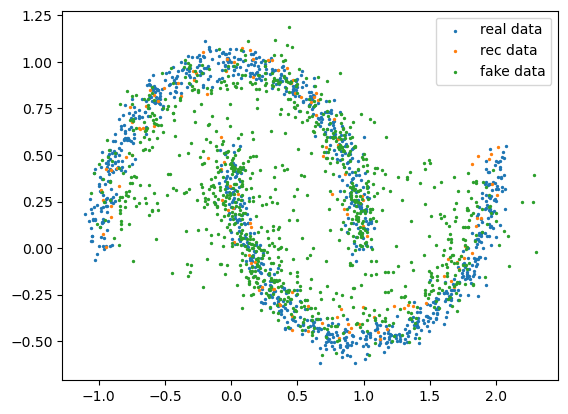

In [56]:
train_VAE(LATENT_N=10, width_enc=150, width_dec=150, depth_enc=5, depth_dec=5, N_ITER=5000, coef_KL=0.1, hardcoded=True)


**Q13: How do the power of encoder and decoder affect the overall training of the VAE?**

> Similarly to the GAN, if the encoder and decoder structure are too simple, we won't obtain good results. It can be explained with the fact that the encoder should be enough complex to capture the information from the input data. And similarly, the decoder should be enough complex to recreate the data from the latent space.
Intutively, if they are too complex, they need more data to train, and also the decoder should have a similar size to the encoder.
The width seems to be an important parameter. If the neural networks are too complex, the model may generate data which corresponds to only a part of the real data.

Latent space dimension 10:, Width of encoder 10: Depth of encoder: 2, Width of decoder: 10, Depth of decoder: 2
step 4999: KL: 1.366e+03, rec: -6.289e+01


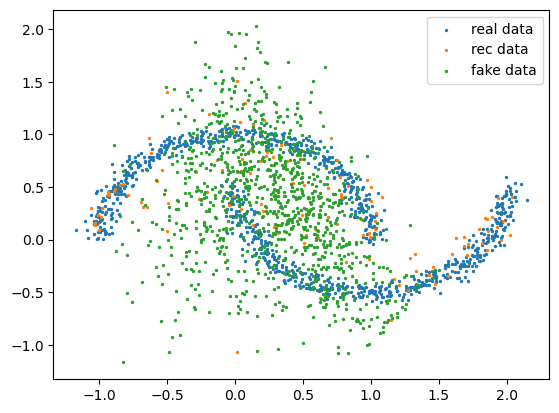

Latent space dimension 10:, Width of encoder 10: Depth of encoder: 2, Width of decoder: 50, Depth of decoder: 5
step 4999: KL: 1.491e+03, rec: -6.102e+02


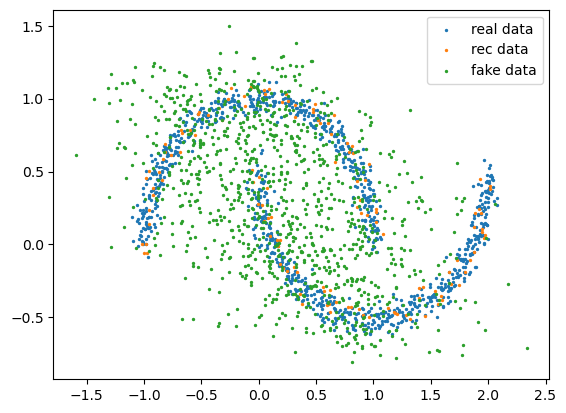

Latent space dimension 10:, Width of encoder 50: Depth of encoder: 5, Width of decoder: 10, Depth of decoder: 2
step 4999: KL: 2.674e+03, rec: -6.116e+02


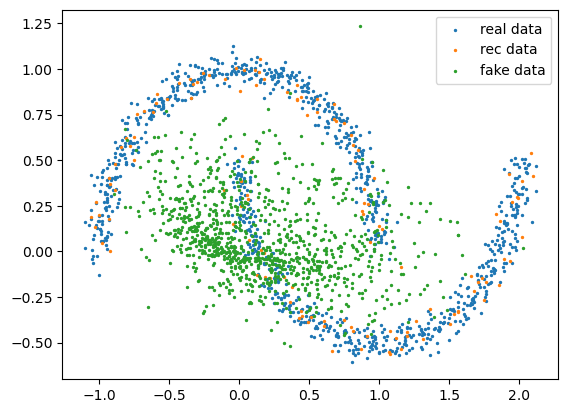

In [59]:
train_VAE(LATENT_N=10, width_enc=10, width_dec=10, depth_enc=2, depth_dec=2, N_ITER=5000, coef_KL=0.1, hardcoded=True)
train_VAE(LATENT_N=10, width_enc=10, width_dec=50, depth_enc=2, depth_dec=5, N_ITER=5000, coef_KL=0.1, hardcoded=True)
train_VAE(LATENT_N=10, width_enc=50, width_dec=10, depth_enc=5, depth_dec=2, N_ITER=5000, coef_KL=0.1, hardcoded=True)


Latent space dimension 10:, Width of encoder 200: Depth of encoder: 8, Width of decoder: 200, Depth of decoder: 8
step 4999: KL: 5.407e+02, rec: -1.815e+02


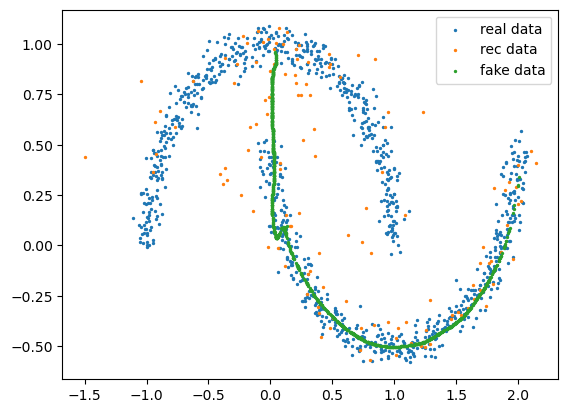

In [60]:
train_VAE(LATENT_N=10, width_enc=200, width_dec=200, depth_enc=8, depth_dec=8, N_ITER=5000, coef_KL=0.1, hardcoded=True)


---
### Normalizing flows

Another approach to generative modelling is given by Normalizing flows. The idea is to learn a mapping $f$ from the data distribution $p_D$ (defined over a space $\mathcal{X}$) to a known distribution (typically, a normal distribution) from which we know how to sample. Two key points are to be noted:
1. The mapping needs to be bijective (i.e., the network needs to be invertible).
2. The exact likelihood of a data point should be easily computable.

To tackle point 2, let us introduce some notations.
Let us denote by $p_\mathcal{N} = \mathcal{N}(0,1)$ the normal distribution from which we sample $z$. We obtain points $x$ by computing $x = f^{-1}(z)$, and we hope that the distribution of points obtained this way will match more or less the dataset distribution $p_D$ of real examples.
We denote by $p_G$ this obtained distribution, that is, the image of $p_\mathcal{N}$ through $f^{-1}$: $p_G$ is a probability distribution defined on $\mathcal{X}$, and our goal will be to optimize the mapping $f$ so that $p_G$ is close to $p_D$. If you are not familiar with images of distributions, the definition is here: https://en.wikipedia.org/wiki/Pushforward_measure ; it can be defined as the measure that satisfies this change of variables: $\int_{z\sim p_\mathcal{N}} g(f^{-1}(z)) dz = \int_{x\sim p_{G}} g(x) dx$ for all functions $g$. Another notation for this is $\int_{z} g(f^{-1}(z)) \;dp_\mathcal{N}(z) = \int_{x} g(x) \;dp_{G}(x)$. 
We will build on the following identity:
$$
\log(p_X(x))=\log(p_Z(z))+\log \det J_f
$$
where $J_f = \frac{df(x)}{dx}$ is the Jacobian matrix of the function $f$.

**Q14: Justify the above equality**

> (Write your answer here)

Let us consider, as an optimization criterion, the Kullback-Leibler divergence $KL(p_D||p_G)$.

**Q15: Express this loss as a (very simple) function of the quantity above.**

> (Write your answer here)

A challenging task is then to find a network, such that f is:
* invertible
* $\det J_f$ is tractable
* $f$ is general enough

A common architecture is the so called real-valued non-volume preserving (real-NVP), which is made of coupling layers.

The idea of coupling layers is to cut the input $x$ in two (let say keeping only the $d < D$ first dimensions on one hand and the $D-d$ other dimensions on the other hand, with $D$ the dimension of the input space $\mathcal{X}$). This gives inputs $x_{1:d}$ and $x_{d+1:D}$. Then the forward pass is defined as:
* $y_{1:d}=x_{1:d}$
* $y_{d+1:D}=x_{d+1:D}\odot \exp(s(x_{1:d})) + t(x_{1:d})$

where $s,t:\mathbb{R}^d\to\mathbb{R}^{D-d}$ and $\odot$ is the coefficient-wise multiplication of two vectors of the same size.

Those equations can be resumed in the following diagram:
![real NVP diagram](./realNVPforward.png)

**Q16: Show that the defined mapping is indeed invertible**

> (Write your answer here)

**Q17: Show that the determinant of the Jacobian of such a mapping is $\exp(\sum_j s(x_{1:d})_j)$**

> (Write your answer here)

**Q18: Fill the Coupling layer structure below by defining suitable functions sfun and tfun (using a final tanh in sfun is highly recommended) and the inverse pass**

In [ ]:
import torch
from torch import nn
from torch.nn import functional as F


class CouplingLayer(nn.Module):
    def __init__(self, input_size, output_size, hidden_size, mask):
        super().__init__()
        ### define here variables to use in f and s ###
        
        ###
        self.mask = mask #we use the mask variable to make the cut in input

    def sfun(self, x_m):
        return x_m
        
    def tfun(self, x_m):
        return x_m
        
    def forward(self, x):
        x_m = x * self.mask
        s_out = self.sfun(x_m) # multiplicative block
        t_out = self.tfun(x_m) # additive block
        y = x_m + (1-self.mask)*(x*torch.exp(s_out)+t_out)
        log_det_jacobian = s_out.sum(dim=1)  # CRITICAL
        return y, log_det_jacobian

    def inverse(self, y):
        return y

In [ ]:
class RealNVP(nn.Module):
    def __init__(self, input_size, output_size, hidden_size, mask, n_layers=6):
        super().__init__()
        assert n_layers >= 2, "num of coupling layers should be greater or equal to 2"

        self.modules = []
        self.modules.append(CouplingLayer(input_size, output_size, hidden_size, mask))
        for _ in range(n_layers-2):
            mask = 1 - mask
            self.modules.append(CouplingLayer(input_size, output_size, hidden_size, mask))
        self.modules.append(CouplingLayer(input_size, output_size, hidden_size, 1 - mask))
        self.module_list = nn.ModuleList(self.modules)

    def forward(self, x):
        ldj_sum = 0  # sum of log determinant of jacobian
        for module in self.module_list:
            x, ldj = module(x)
            ldj_sum += ldj
        return x, ldj_sum

    def inverse(self, z):
        for module in reversed(self.module_list):
            z = module.inverse(z)
        return z

In [ ]:
import os

import matplotlib.pyplot as plt
import numpy as np
import torch


def train(epoch, model, optimizer, prior_z, train_loader, log_interval=50):
    model.train()
    train_loss = 0
    for batch_idx, x_inputs in enumerate(train_loader):
        optimizer.zero_grad()
        z_outputs, log_det_j_sum = model.forward(x_inputs)  # train with the forward
        loss = -(prior_z.log_prob(z_outputs)+log_det_j_sum).mean()  # CRITICAL
        loss.backward()
        cur_loss = loss.item()
        train_loss += cur_loss
        optimizer.step()
        if batch_idx % log_interval == 0:
            print("Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                epoch, batch_idx * len(x_inputs), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), cur_loss / len(x_inputs)))

    average_train_loss = train_loss / len(train_loader.dataset)
    print(f"====> Epoch: {epoch} Average train loss: {average_train_loss:.4f}")


def test(epoch, model, prior_z, test_loader):
    model.eval()
    test_loss = 0
    x_all = np.array([[]]).reshape(0, 2)
    z_all = np.array([[]]).reshape(0, 2)
    with torch.no_grad():
        for batch_idx, x_inputs in enumerate(test_loader):
            z_outputs, log_det_j_sum = model.forward(x_inputs)
            cur_loss = -(prior_z.log_prob(z_outputs)+log_det_j_sum).mean().item()
            test_loss += cur_loss
            x_all = np.concatenate((x_all, x_inputs.numpy()))
            z_all = np.concatenate((z_all, z_outputs.numpy()))

        subfig_plot(1, x_all, -2, 3, -1, 1.5, "Input: x ~ p(x)", "b")
        subfig_plot(2, z_all, -3, 3, -3, 3, "Output: z = f(x)", "b")

        test_loss /= len(test_loader.dataset)
        print(f"====> Test loss: {test_loss:.4f}")


def sample(epoch, model, prior_z, save_plt_interval=5):
    model.eval()
    with torch.no_grad():
        z_inputs = prior_z.sample((1000,))
        x_outputs = model.inverse(z_inputs)  # generation with the inverse
        z_inputs = z_inputs.numpy()
        x_outputs = x_outputs.numpy()

        subfig_plot(3, z_inputs, -3, 3, -3, 3, "Input: z ~ p(z)", "r")
        subfig_plot(4, x_outputs, -2, 3, -1, 1.5, "Output: x = g(z) (g: inverse of f)", "r")

        if epoch % save_plt_interval == 0:
            if not os.path.exists("results"):
                os.makedirs("results")
            plt.savefig("results/"+"result_"+str(epoch)+".png")


def subfig_plot(location, data, x_start, x_end, y_start, y_end, title, color):
    if location == 1:
        plt.clf()
    plt.subplot(2, 2, location)
    plt.scatter(data[:, 0], data[:, 1], c=color, s=1)
    plt.xlim(x_start, x_end)
    plt.ylim(y_start, y_end)
    plt.title(title)
    plt.pause(1e-2)

In [ ]:
# globals
BATCH_SIZE = 128
LOG_INTERVAL = 50
N_EPOCHS = 10
INPUT_SIZE = 2
OUTPUT_SIZE = 2
HIDDEN_SIZE = 256
SAVE_PLT_INTERVAL = 5
N_COUPLING_LAYERS = 8

In [ ]:
# data loading
train_data = datasets.make_moons(n_samples=50000, noise=.05)[0].astype(np.float32)
test_data = datasets.make_moons(n_samples=1000, noise=.05)[0].astype(np.float32)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
loader_kwargs = {"num_workers": 1, "pin_memory": True} if device == "cuda" else {}
train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True, **loader_kwargs)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=True, **loader_kwargs)

In [ ]:
from torch import distributions # optim, 
# model construction
mask = torch.from_numpy(np.array([0, 1]).astype(np.float32))
model = RealNVP(INPUT_SIZE, OUTPUT_SIZE, HIDDEN_SIZE, mask, N_COUPLING_LAYERS)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
prior_z = distributions.MultivariateNormal(torch.zeros(2), torch.eye(2))

In [ ]:
from timeit import default_timer as timer
# run
start = timer()
for epoch in range(1, N_EPOCHS + 1):
    train(epoch, model, optimizer, prior_z, train_loader)
    test(epoch, model, prior_z, test_loader)
    sample(epoch, model, prior_z)
f"{timer() - start:.02f}s"

**Q19: Explain why Normalizing flows do not fit well when there are many clusters in data**

> (Write your answer here)

---
## Denoising Diffusion Model

Recently Diffusion Models received a lot of attention. __Diffusion Models Beat GANs on Image Synthesis__ *(Dhariwal,Nichol)* : [arXiv:2105.05233](https://arxiv.org/pdf/2105.05233.pdf) shows significant improvement on image generation with a model claimed to be easier to train than GANs.


It is the key of the image generating process behind Latent Diffusion models such as Dall.e, Imagen or StableDiffusion. 

We are going to implement a model inspired by the paper
__Denoising Diffusion Probabilistic Models__  *(Ho et al.)*: [arXiv:2006.11239](https://arxiv.org/pdf/2006.11239.pdf) 


 Denoising diffusion probabilistic model  introduce noise into data and gradually learn to reverse this process for generating new samples. It involves two Markov chains, one that forwards data to noise, and another that reverses this process by converting the noise back to data. The forward chain is usually designed to transform any data distribution into a simpler prior distribution, such as a standard Gaussian distribution, while the reverse Markov chain is parametrized by a neural network and learns to reverse this process. To generate new data points, we first sample a random vector from the prior distribution, then applies ancestral sampling through the reverse Markov chain.

 References:

- Survey on Diffusion Models : https://arxiv.org/pdf/2209.00796.pdf
- https://lilianweng.github.io/posts/2021-07-11-diffusion-models/
- https://blog.alexalemi.com/diffusion.html
- https://sander.ai/posts/



![Denoisingdiagram](./illustrationDenoising.png)

$q$ and $p_{\theta}$ being the respective kernels of the two chains. 


#### Forward Pass ####

For our purpose we are going to use a Gaussian Noise. The forward Kernel will have the following shape : 

$$q(x_t| x_{t-1}) = \mathcal{N}(x_t;\sqrt{1- \beta_t} x_{t-1},\beta_t I )$$

with $\mathcal{N}(x;\mu,\sigma I )$ a conditional gaussian :
$$ y \sim \mathcal{N}(x;\mu,\sigma I ) \equiv y|x \sim  \mathcal{N}(\mu,\sigma I )$$

**Q20: What does $\beta_t$ represent in the formula ?**

> (Write your answer here)

In our example the sequence $\beta_t$ will be chosen linearly wrt $t$. 

We introduce $\alpha_t := 1-\beta_t$ and $\overline{\alpha_t} = \prod_{s=1}^{t} \alpha_s$ we can sample forward directly at timestep $t$ from the original image : 
$$q(\mathbf{x}_{1:T}|\mathbf{x}_0) = \prod_{t=1}^{T}q(\mathbf{x}_t|\mathbf{x}_{t-1})$$
$$ q(\mathbf{x}_t| \mathbf{x}_0) = \mathcal{N}(\mathbf{x}_t;\sqrt{\overline{\alpha_t}} \mathbf{x}_0, (1-\overline{\alpha_t})I)$$

i.e. 
\begin{align}
\boldsymbol{x}_t = \sqrt{\bar{\alpha}_t} \boldsymbol{x}_0 + \sqrt{1 - \bar{\alpha}_t} \boldsymbol{\epsilon} \;\;\; \text{where} \; \boldsymbol{\epsilon} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})
\end{align}

we will then fix $$\sigma_t = \sqrt{1 - \bar{\alpha}_t}$$

**Q22:  Implement the forward pass using $\overline{\alpha_t}$ (Hint : you may need to precalculate the $\overline{\alpha_t}$ from $\beta_t$)**

In [ ]:
def bcast_right(x: torch.Tensor, ndim: int) -> torch.Tensor:
    """Util function for broadcasting to the right."""
    if x.ndim > ndim:
        raise ValueError(f'Cannot broadcast a value with {x.ndim} dims to {ndim} dims.')
    elif x.ndim < ndim:
        difference = ndim - x.ndim
        return x.view(x.shape + (1,) * difference)
    else:
        return x


In [ ]:
class DiscreteDDPMProcess:
    """A Gaussian diffusion process: q(xt|x0) = N(sqrt_alpha_bar(t)*x0, sigma(t)^2 * I),
    which implies the following transition from x0 to xt:

    xt = sqrt_alpha_bar(t) x0 + sigma(t) eps, eps ~ N(0, I).

    Diffusion processes differ in how they specify sqrt_alpha_bar(t) and/or sigma(t).
    Here we follow the DDPM paper.

    """
    def __init__(
        self,
        num_diffusion_timesteps: int = 1000,
        beta_start: float = 0.0001,
        beta_end: float = 0.02,
    ):
        self._num_diffusion_timesteps = num_diffusion_timesteps
        self._beta_start = beta_start
        self._beta_end = beta_end
        self._betas = np.linspace(self._beta_start, self._beta_end, self._num_diffusion_timesteps)

        alphas_bar = self._get_alphas_bar()
        ###############
        # TO COMPLETE #
        ###############
        self._sqrt_alphas_bar = ? #put in dtype=torch.float32
        self._sigmas = ? #put in dtype=torch.float32

    @property
    def tmin(self):
        return 1

    @property
    def tmax(self):
        return self._num_diffusion_timesteps

    def _get_alphas_bar(self) -> np.ndarray:
        ###############
        # TO COMPLETE #
        ###############
        alphas_bar = ?

        # we can add this 1 in front to simplify indexing,
        # and to make alpha[0]=1 and sigma[0]=0.
        # these values at t=0 will be needed later when generating samples
        alphas_bar = np.concatenate(([1.], alphas_bar))

        return alphas_bar

    def sqrt_alpha_bar(self, t: torch.Tensor) -> torch.Tensor:
        return self._sqrt_alphas_bar[t.long()]

    def sigma(self, t: torch.Tensor) -> torch.Tensor:
        return self._sigmas[t.long()]

    def sample(self, x0: torch.Tensor, t: torch.Tensor, eps: torch.Tensor) -> torch.Tensor:
        """Draws samples from the forward diffusion process q(xt|x0)."""
        ###############
        # TO COMPLETE #
        ###############
        return 

In [ ]:
# data loading
test_data = generate_batch(1000)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
process = DiscreteDDPMProcess(num_diffusion_timesteps=1000)
ts = torch.Tensor(np.linspace(process.tmin, process.tmax, num=process.tmax, dtype=np.int32))

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(4 * 2, 2))

# plot how sqrt_alpha_bar and sigma change over time
ax[0].plot(ts.numpy(), process.sigma(ts), label=r'$\sigma$')
ax[0].plot(ts.numpy(), process.sqrt_alpha_bar(ts), label=r'$\sqrt{\bar\alpha}$')
ax[0].set_xlabel('time')
ax[0].legend()

# It is often helpful to reason in terms of signal-to-noise ratio:
# SNR = sqrt_alpha_bar(t)^2 / sigma(t)^2 or more conveniently, its logarithm.
# High SNR = little noise, low SNR = a lot of noise.
lambda_ = [2. * np.log(process.sqrt_alpha_bar(t) / process.sigma(t)) for t in ts]
ax[1].plot(ts.numpy(), lambda_, c='g', label=r'$log SNR$')
ax[1].set_xlabel('time')
ax[1].legend()

plt.show()

In [ ]:
# Effect on the distribution
torch_test_data = torch.Tensor(test_data)
def apply_on_dataset(dataset,t):
    dataset_t = torch.zeros_like(dataset)
    for i in range(dataset.shape[0]):
        point = dataset[i]
        eps = torch.randn_like(point)
        point_t = process.sample(point, t, eps)
        dataset_t[i] = point_t
    return dataset_t

fig,axes = plt.subplots(1,5,figsize=(20,5))
axes[0].scatter(torch_test_data[:,0],torch_test_data[:,1])
for i in range(1,5):
    t = torch.Tensor([i*50]).type(torch.int64)
    dataset_t = apply_on_dataset(torch_test_data,t)
    axes[i].scatter(dataset_t[:,0],dataset_t[:,1])
    axes[i].set_title(f"After {t.detach().item()} walks")
fig.suptitle("Influence of the forward pass on the distribution")
plt.show()



#### Backward Process

Hypothetically, We would like  to train the reverse kernel $p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)$, with parameters $\theta$ parametrized by a neural network 

$$
p_\theta\left(\mathbf{x}_{0: T}\right):=p\left(\mathbf{x}_T\right) \prod_{t=1}^T p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)
$$

with $p(\mathbf{x}_T)$ a Gaussian prior, $p(\mathbf{x}_T) \sim \mathcal{N}(0,I)$ . We would use $p(\mathbf{x}_T)$ to sample new data points for generation.

#### Variational Lower Bound 

In the paper, they used the knowledge of the forward pass and design a  Gaussian  reverse kernel

$$
p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)=\mathcal{N}\left(\mathbf{x}_{t-1} ; \mu_\theta\left(\mathbf{x}_t, t\right), \Sigma_\theta\left(\mathbf{x}_t, t\right)\right)
$$

with $\mu_{\theta}$ and $\Sigma_{\theta}$  parametrized by a neural network

We can write the previous forward kernel
$$
\begin{aligned}
q\left(\mathbf{x}_t \mid \mathbf{x}_0\right) & =\mathcal{N}\left(\mathbf{x}_t ; \sqrt{\bar{\alpha}_t} \mathbf{x}_0,\left(1-\bar{\alpha}_t\right) \mathbf{I}\right) \\
& =\sqrt{\bar{\alpha}_t} \mathbf{x}_0+\epsilon \sqrt{1-\bar{\alpha}_t}
\end{aligned}
$$
with $ \epsilon \sim \mathcal{N}(0, \mathbf{I})$ 

The natural loss would be to optimize under the variational lower bound $L_t$ such that : 
$$
\begin{aligned}
L_{\mathrm{vlb}} & :=L_0+L_1+\ldots+L_{T-1}+L_T \\
L_0 & :=-\log p_\theta\left(x_0 \mid x_1\right) \\
L_{t-1} & :=D_{K L}\left(q\left(x_{t-1} \mid x_t, x_0\right) \| p_\theta\left(x_{t-1} \mid x_t\right)\right) \\
L_T & :=D_{K L}\left(q\left(x_T \mid x_0\right) \| p\left(x_T\right)\right)
\end{aligned}
$$

One can show that an alternative loss can be used that only take one parametrized estimator $\epsilon_{\theta}$. \
Hint: KL divergences between Gaussian distributions can be computed analytically
$$
L_{\text {simple }}(\theta):=\mathbb{E}_{t, \mathbf{x}_0, \boldsymbol{\epsilon}}\left[\left\|\boldsymbol{\epsilon}-\boldsymbol{\epsilon}_\theta\left(\sqrt{\bar{\alpha}_t} \mathbf{x}_0+\sqrt{1-\bar{\alpha}_t} \boldsymbol{\epsilon}, t\right)\right\|^2\right]
$$

Let's start implementing the network that predicts $\widehat \epsilon(x_t, t; \theta)$. Note that, as stated by its definition, $\epsilon$ is the cumulated noise from $t=0$ and not just the noise added at the last step.

In [ ]:
import torch.nn as nn

class ResidualMLP(nn.Module):
    """MLP with residual connections."""

    def __init__(
        self,
        n_blocks: int,
        n_hidden: int,
        n_out: int,
        activation: str,
        name: str = None
    ):
        super(ResidualMLP, self).__init__()
        self._n_blocks = n_blocks
        self._n_hidden = n_hidden
        self._n_out = n_out
        self._activation = getattr(nn.functional, activation)

        self.linear_input = nn.Linear(n_out, n_hidden)
        self.linear_time = nn.ModuleList([nn.Linear(n_hidden, n_hidden) for _ in range(self._n_blocks)])
        self.linear_hidden = nn.Sequential(
    nn.ModuleList([nn.Linear(n_hidden, n_hidden) for _ in range(self._n_blocks)]),
    nn.ModuleList([nn.Linear(n_hidden, n_hidden) for _ in range(self._n_blocks)])
        )
        self.linear_output = nn.Linear(n_hidden, n_out)

    def forward(self, xt: torch.Tensor, time: torch.Tensor) -> torch.Tensor:
        x = self.linear_input(xt)

        for _ in range(self._n_blocks):
            h=self._activation(x)
            h=self.linear_hidden[_][0](h)
            h=h+self.linear_time[_](time)
            h=self._activation(h)
            h=self.linear_hidden[_][1](h)
            x=x+h

        outputs = self.linear_output(x)

        return outputs


#### Time embeddings

As we can see above, the denoiser network needs to get timestep $t$ as an input.

However, feeding integers $t=1, 2, ... T$ into the network will not work.

[Transformers](https://arxiv.org/abs/1706.03762), when faced with the same problem, proposed to embed timesteps into $d$-dimensional vectors of sinusoids:

$$e = [\; \sin(w_1 t) \; \; \cos(w_1 t) \; ... \; \sin(w_{d/2} t) \; \; \cos(w_{d/2} t) \;]$$

with $w_i = 1/ 10000^{\frac{2i}{d}}$.

Here is nice blogpost with more intuition: https://kazemnejad.com/blog/transformer_architecture_positional_encoding/


In [ ]:
class SinusoidalTimeEmbedding(nn.Module):
    """Time (positional) embedding as in Transformers."""

    def __init__(self, num_features: int, name: str = None):
        super(SinusoidalTimeEmbedding, self).__init__()
        self._num_features = num_features

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        assert len(inputs.shape) == 1
        half_dim = self._num_features // 2
        e = torch.log(torch.tensor(10000.0)) / (half_dim - 1)
        embedding = torch.exp(-e * torch.arange(half_dim).float()).to(device)
        embedding = inputs.view(-1, 1) * embedding
        embedding = torch.cat([torch.cos(embedding), torch.sin(embedding)], dim=-1)
        if self._num_features % 2 == 1:
            embedding = nn.functional.pad(embedding, (0, 1))
        return embedding


Now we need to put the two modules together:

In [ ]:
import dataclasses

@dataclasses.dataclass
class NetConfig:
    resnet_n_blocks: int = 2
    resnet_n_hidden: int = 256
    resnet_n_out: int = 2
    activation: str = 'elu'
    time_embedding_dim: int = 256


class Net(nn.Module):
    """Combines MLP and time embeddings."""
    def __init__(self, net_config: NetConfig, name: str = None):
        super(Net, self).__init__()

        self._time_encoder = SinusoidalTimeEmbedding(net_config.time_embedding_dim)
        self._predictor = ResidualMLP(
            n_blocks=net_config.resnet_n_blocks,
            n_hidden=net_config.resnet_n_hidden,
            n_out=net_config.resnet_n_out,
            activation=net_config.activation
        )

    def forward(self, noisy_data: torch.Tensor, time: torch.Tensor) -> torch.Tensor:
        time_embedding = self._time_encoder(time)
        outputs = self._predictor(noisy_data, time_embedding)
        return outputs


#### Time sampler

To compute our loss function, for each example, we need to sample a random timestep. In this trivial case of uniform sampling between step 1 and T, it might be an overkill to implement it as a separate class. It would be more helpful if you're going to explore more exotic diffusion models.

In [ ]:
from typing import Sequence

class UniformDiscreteTimeSampler:

    def __init__(self, tmin: int, tmax: int):
        self._tmin = tmin
        self._tmax = tmax

    def sample(self, shape: Sequence[int]) -> torch.Tensor:
        return torch.randint(low=self._tmin, high=self._tmax, size=shape)


#### Full DDPM model

**Q.23 Implement the Simplified loss given a model $\epsilon_{\theta}$**

In [ ]:
class DiffusionModel(nn.Module):
    """Diffusion model."""

    def __init__(self, diffusion_process, time_sampler, net_config, data_shape):
        super(DiffusionModel, self).__init__()

        self._process = diffusion_process
        self._time_sampler = time_sampler
        self._net_config = net_config
        self._data_shape = data_shape
        self.net_fwd = Net(net_config)

    def loss(self, x0: torch.Tensor) -> torch.Tensor:
        """Computes MSE between the true noise and predicted noise,
        i.e. the goal of the network is to correctly predict eps from a noisy observation
        xt = alpha(t) * x0 + sigma(t)**2 * eps"""

        ###############
        # TO COMPLETE #
        ###############

        t = ?  # sample time

        eps = ?  # sample noise

        xt = ?  # corrupt the data

        net_outputs = ?  # get net outputs

        loss = ?  # compute MSE loss between predicted and true noise

        return loss

    #Used for sampling 
    def _reverse_process_step(
        self,
        xt: torch.Tensor,
        t: int,
    ) -> Tuple[torch.Tensor, torch.Tensor]:
        """Computes parameters of a Gaussian p_{\theta}(x_{t-1}| x_t)."""

        t = t * torch.ones((xt.shape[0],), dtype=torch.int32, device=xt.device)

        ###############
        # TO COMPLETE #
        ###############

        eps_pred = ?  # predict epsilon from x_t

        sqrt_alpha_t = ? # use self._sqrt_alpha_bar
        inv_sqrt_alpha_t = bcast_right(1.0 / sqrt_alpha_t, xt.ndim)

        beta_t = ?
        beta_t = bcast_right(beta_t, xt.ndim)

        inv_sigma_t = ?
        inv_sigma_t = bcast_right(inv_sigma_t, xt.ndim)

        mean = ?

        # DDPM instructs to use either the variance of the forward process
        # or the variance of q(x_{t-1}|x_t, x_0). Former is easier.
        std = ?

        eps = ?

        return ?


    def sample(self, x0, sample_size):
    """To generate samples from DDPM, we follow the reverse process.
    At each step of the chain, we sample x_{t-1} from p(x_{t-1}| x_t, x0_pred) until we get to x_0."""
        with torch.no_grad():
            x = torch.randn((sample_size,) + self._data_shape, device=x0.device) #sample pure noise

            
            ###############
            # TO COMPLETE #
            ###############

        return x

Given the noise obtained by the model $\boldsymbol{\epsilon}_\theta\left(\mathbf{x}_t, t\right)$, you can sample $\mu_{\theta}(\mathbf{x}_t,t)$ in order to get a denoised sample point.
$$
\mu_{\theta}(\mathbf{x}_t,t) = \frac{1}{\sqrt{\alpha_t}}\left(\mathbf{x}_t-\frac{\beta_t}{\sqrt{1-\bar{\alpha}_t}} \boldsymbol{\epsilon}_\theta\left(\mathbf{x}_t, t\right)\right)
$$ 


The _reverse_process_step function sample $x_{t-1} \sim p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)$ where
$$
p_\theta\left(\mathbf{x}_{t-1} \mid \mathbf{x}_t\right)=\mathcal{N}\left(\mathbf{x}_{t-1} ; \mu_\theta\left(\mathbf{x}_t, t\right), \Sigma_\theta\left(\mathbf{x}_t, t\right)\right)
$$
and we set $$\Sigma_\theta\left(\mathbf{x}_t, t\right) = \beta_{t}\boldsymbol{I}$$

Thus $$x_{t-1} = \mu_{\theta}(\mathbf{x}_t,t) + \sqrt{\beta_t}\epsilon$$ where $$\epsilon \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$$

**Q.24 Build the sampling function that allows you from inputs $\mathbf{x}_t$ and $t$ to obtain $\mu_{\theta}(\mathbf{x}_t,t)$ and $x_{t-1}$**

#### Training

In [ ]:
from torch import optim

# create the model
diffusion_process = DiscreteDDPMProcess(num_diffusion_timesteps=1000)
time_sampler = UniformDiscreteTimeSampler(diffusion_process.tmin, diffusion_process.tmax)
model = DiffusionModel(diffusion_process, time_sampler, net_config=NetConfig(), data_shape=(2,)).to(device)
optimizer = optim.Adam(model.parameters(), lr=3e-4)

We will use a learning rate scheduler with a warmup. \
You will have to install the library pytorch_warmup with "pip install -U pytorch_warmup": https://github.com/Tony-Y/pytorch_warmup \
Our learning rate schedule will have the following shape.

![Denoisingdiagram](./lr_with_warmup.png)

In [ ]:
import pytorch_warmup as warmup

training_steps = 50000

warmup_period=1000 #this is the increasing part of the learning rate schedule
num_steps = training_steps
t0 = num_steps // 1
lr_min = 3e-12
max_step = t0 * 1 + warmup_period #you can also create cycle but we won't touch it here

lr_scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=t0, T_mult=1, eta_min=lr_min)

warmup_scheduler = warmup.LinearWarmup(optimizer, warmup_period)


##### Training loop

**Q.25 Train $\epsilon_{\theta}(\mathbf{x},t)$ that take as entry a transformed vector $\mathbf{x}$ and  $t$ a number of time $\mathbf{x}$ passed through the forward process  and return  a direct estimate of  the noise $\epsilon$**

In [ ]:
BATCH_SIZE=1024

for step in range(training_steps):
    #generate batch on the fly

    ###############
    # TO COMPLETE #
    ###############

    if step % 1000 == 0:
        print(f'Step: {step}, Loss: {loss:.5f}')

    if step % 10000 == 0:
        with torch.no_grad():
            samples = ? # create new samples
        plt.figure(figsize=(3, 3))
        plt.scatter(samples[:, 0], samples[:, 1], s=1, alpha=0.5)
        plt.show()

    with warmup_scheduler.dampening():
        if warmup_scheduler.last_step + 1 >= warmup_period:
            lr_scheduler.step()
        if warmup_scheduler.last_step + 1 >= max_step:
            break


#### Ablation study

**Q.26 Perform ablations experiments on hyperparameters, such as: learning rate (try constant learning rate with different values), batch size, the number of timesteps, the positional embedding for timestep (remove it), the hidden size, number of epochs, skip connections**

For a given ablation experiment (they ought to be done separately!), you should plot generated samples at few given timesteps (if compute resources is limited, do it for one timestep).

Note: you don't have to do all of these experiments, but the bigger is your group, the more you should do.

> (Write your answer here)

#### Generation/Sampling

**Q.27  Generate samples and plot them at different timestep of the chain. Check how real & synthetic distribution overlap, compare the densities**

---
### Conclusion

**Q.28: As a conclusion, how would you compare the advantages and shortcomings of GANs, VAEs, Normalizing flows and Denoising Models ?**

> GAN are designed to solve the problem of generating accurate fake data. However, for complex tasks, it may requires a lot of parameter fine-tuning as we can often be stuck in training problems.

> VAE may perform well if we want to work on complex multidimensional data. By having a latent space, we can capture important information from the initial data and then work on it to generate new data. It may require less parameter tuning, but we have to choose the loss functions accurately dependin on the problem we want to solve. With the problem of reconstructing the data, we may have more innacurate fake data than with other methods like GAN, but the advantage is that we may have more diverse data as well.
